# Load HMDA 2020/2023 Data

In [3]:
import pandas as pd
import requests
from io import BytesIO
from zipfile import ZipFile

# Step 1: Download the zip file
url = "https://s3.amazonaws.com/cfpb-hmda-public/prod/snapshot-data/2020/2020_public_lar_csv.zip"
response = requests.get(url)
response.raise_for_status()
zip_file = ZipFile(BytesIO(response.content))

# Step 2: Extract CSV file name
csv_files = [file for file in zip_file.namelist() if file.endswith('.csv')]
csv_file_name = csv_files[0]

# Step 3: Load in chunks and filter by Cook County (county_code = 17031)
chunks = []
chunk_size = 100_000

with zip_file.open(csv_file_name) as csv_file:
    for chunk in pd.read_csv(csv_file, chunksize=chunk_size, dtype={'county_code': str}):
        # Convert to numeric safely, in case of missing values or non-numeric
        chunk['county_code'] = pd.to_numeric(chunk['county_code'], errors='coerce')
        cook_chunk = chunk[chunk['county_code'] == 17031]
        if not cook_chunk.empty:
            chunks.append(cook_chunk)
        # Optional: break after enough data loaded (for testing)
        # if len(chunks) >= 5: break

# Step 4: Combine filtered chunks into one DataFrame
df_cook = pd.concat(chunks, ignore_index=True)
print(df_cook.head())

C:\Users\admin\AppData\Local\Temp\ipykernel_10344\4156658800.py:21: DtypeWarning: Columns (46,77,78,79,80) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in pd.read_csv(csv_file, chunksize=chunk_size, dtype={'county_code': str}):
C:\Users\admin\AppData\Local\Temp\ipykernel_10344\4156658800.py:21: DtypeWarning: Columns (46,78,80) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in pd.read_csv(csv_file, chunksize=chunk_size, dtype={'county_code': str}):
C:\Users\admin\AppData\Local\Temp\ipykernel_10344\4156658800.py:21: DtypeWarning: Columns (22,23,24,26,27,28,29,30,31,32,33,38,43,44) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in pd.read_csv(csv_file, chunksize=chunk_size, dtype={'county_code': str}):
C:\Users\admin\AppData\Local\Temp\ipykernel_10344\4156658800.py:21: DtypeWarning: Columns (43,46) have mixed types. Specify dtype option on import or set low_memory=False.


   activity_year                   lei  derived_msa_md state_code  \
0           2020  549300LBCBNR1OT00651           16984         IL   
1           2020  549300LBCBNR1OT00651           16984         IL   
2           2020  549300LBCBNR1OT00651           16984         IL   
3           2020  549300LBCBNR1OT00651           16984         IL   
4           2020  549300LBCBNR1OT00651           16984         IL   

   county_code   census_tract conforming_loan_limit derived_loan_product_type  \
0      17031.0  17031819801.0                     C   Conventional:First Lien   
1      17031.0  17031823903.0                     C   Conventional:First Lien   
2      17031.0  17031820101.0                     C   Conventional:First Lien   
3      17031.0  17031710400.0                     C   Conventional:First Lien   
4      17031.0  17031802605.0                     C   Conventional:First Lien   

              derived_dwelling_category        derived_ethnicity  ...  \
0  Single Family (1-4 Uni

In [21]:
#Shape of data after duplicate removal
df_cook.shape

(338083, 99)

In [22]:
df_cook['action_taken'].value_counts(normalize=True).round(3)

action_taken
1    0.553
4    0.146
6    0.125
3    0.110
5    0.047
2    0.019
8    0.000
7    0.000
Name: proportion, dtype: float64

In [23]:
df_cook["lei"].nunique()

866

In [24]:
print(df_cook.columns.tolist())


['activity_year', 'lei', 'derived_msa_md', 'state_code', 'county_code', 'census_tract', 'conforming_loan_limit', 'derived_loan_product_type', 'derived_dwelling_category', 'derived_ethnicity', 'derived_race', 'derived_sex', 'action_taken', 'purchaser_type', 'preapproval', 'loan_type', 'loan_purpose', 'lien_status', 'reverse_mortgage', 'open_end_line_of_credit', 'business_or_commercial_purpose', 'loan_amount', 'combined_loan_to_value_ratio', 'interest_rate', 'rate_spread', 'hoepa_status', 'total_loan_costs', 'total_points_and_fees', 'origination_charges', 'discount_points', 'lender_credits', 'loan_term', 'prepayment_penalty_term', 'intro_rate_period', 'negative_amortization', 'interest_only_payment', 'balloon_payment', 'other_nonamortizing_features', 'property_value', 'construction_method', 'occupancy_type', 'manufactured_home_secured_property_type', 'manufactured_home_land_property_interest', 'total_units', 'multifamily_affordable_units', 'income', 'debt_to_income_ratio', 'applicant_cre

I did not do any other data cleaning here. I would like to first prepare the data according to NCRC's instructions. NCRC requested that all students prepare total borrower cost, race, and ethnicity variables using these calculations:

https://ncrc.org/ncrcs-hmda-2018-methodology-how-to-calculate-loan-price/

https://ncrc.org/ncrcs-hmda-2018-methodology-how-to-calculate-race-and-ethnicity/




## List and Types of Variables

In [27]:
#types of data
print(df_cook.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 338083 entries, 0 to 338082
Data columns (total 99 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   activity_year                             338083 non-null  int64  
 1   lei                                       338083 non-null  object 
 2   derived_msa_md                            338083 non-null  int64  
 3   state_code                                338076 non-null  object 
 4   county_code                               338083 non-null  float64
 5   census_tract                              337969 non-null  object 
 6   conforming_loan_limit                     336070 non-null  object 
 7   derived_loan_product_type                 338083 non-null  object 
 8   derived_dwelling_category                 338083 non-null  object 
 9   derived_ethnicity                         338083 non-null  object 
 10  derived_race        

# Preprocessing

## Calculate Ethnicity and Race According to NCRC's Methodology
https://ncrc.org/ncrcs-hmda-2018-methodology-how-to-calculate-race-and-ethnicity/

In [30]:
import numpy as np

df_cook = df_cook.copy()

# Ethnicity
def calculate_ethnicity(row):
    for col in ['applicant_ethnicity_1', 'applicant_ethnicity_2',
                'applicant_ethnicity_3', 'applicant_ethnicity_4',
                'applicant_ethnicity_5']:
        val = row[col]
        if pd.notna(val) and val > 10:
            return int(val)
    return int(row['applicant_ethnicity_1']) if pd.notna(row['applicant_ethnicity_1']) else np.nan

df_cook.loc[:, 'calculated_ethnicity'] = df_cook.apply(calculate_ethnicity, axis=1)

# Race
def calculate_race(row):
    for col in ['applicant_race_1', 'applicant_race_2',
                'applicant_race_3', 'applicant_race_4',
                'applicant_race_5']:
        val = row[col]
        if pd.notna(val) and val > 20:
            return int(val)
    return int(row['applicant_race_1']) if pd.notna(row['applicant_race_1']) else np.nan

df_cook.loc[:, 'calculated_race'] = df_cook.apply(calculate_race, axis=1)

In [31]:
# Function to calculate combined co-applicant ethnicity
df_cook = df_cook.copy()

# Function to calculate combined co-applicant ethnicity
def calculate_co_ethnicity(row):
    for col in ['co_applicant_ethnicity_1', 'co_applicant_ethnicity_2',
                'co_applicant_ethnicity_3', 'co_applicant_ethnicity_4',
                'co_applicant_ethnicity_5']:
        val = row[col]
        if pd.notna(val) and val > 10:
            return int(val)
    return int(row['co_applicant_ethnicity_1']) if pd.notna(row['co_applicant_ethnicity_1']) else np.nan

# Function to calculate combined co-applicant race
def calculate_co_race(row):
    for col in ['co_applicant_race_1', 'co_applicant_race_2',
                'co_applicant_race_3', 'co_applicant_race_4',
                'co_applicant_race_5']:
        val = row[col]
        if pd.notna(val) and val > 20:
            return int(val)
    return int(row['co_applicant_race_1']) if pd.notna(row['co_applicant_race_1']) else np.nan

# Apply safely
df_cook['calculated_co_ethnicity'] = df_cook.apply(calculate_co_ethnicity, axis=1)
df_cook['calculated_co_race'] = df_cook.apply(calculate_co_race, axis=1)


In [32]:
# Assuming df0 is already defined as in your previous code
columns_to_drop = ['applicant_race_1', 'applicant_race_2', 'applicant_race_3', 'applicant_race_4', 'applicant_race_5',
                   'applicant_ethnicity_1', 'applicant_ethnicity_2', 'applicant_ethnicity_3', 'applicant_ethnicity_4', 'applicant_ethnicity_5',
                   'co_applicant_race_1', 'co_applicant_race_2', 'co_applicant_race_3', 'co_applicant_race_4', 'co_applicant_race_5',
                   'co_applicant_ethnicity_1', 'co_applicant_ethnicity_2', 'co_applicant_ethnicity_3', 'co_applicant_ethnicity_4', 'co_applicant_ethnicity_5']

df_cook = df_cook.drop(columns=columns_to_drop, errors='ignore')

In [33]:
df_cook=df_cook.dropna(axis=1, how='all')

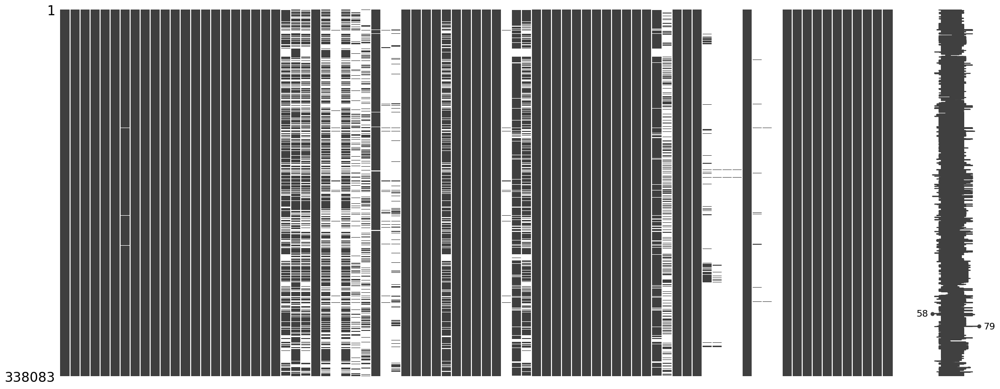

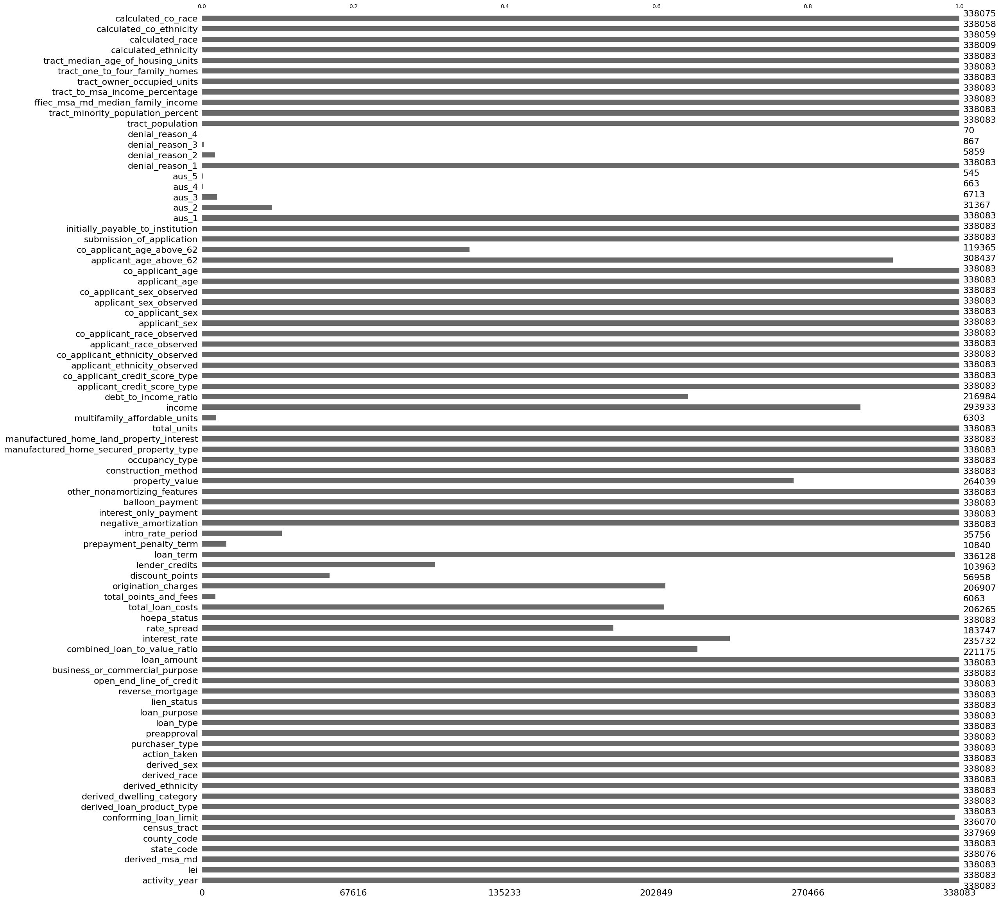

In [34]:
import missingno as msno
import matplotlib.pyplot as plt

# Visualize missing values as a matrix
msno.matrix(df_cook)
plt.show()

# Visualize missing values as a bar chart
msno.bar(df_cook)
plt.show()

In [35]:
# Identify columns with mixed data types
# for col in df_cook.columns:
#     if df_cook[col].dtype == 'object':  # Check object type columns
#         try:
#             # Try converting to numeric
#             df_cook.loc[:, col] = pd.to_numeric(df_cook[col], errors='coerce')
#         except (ValueError, TypeError):
#             # If numeric conversion fails, try converting to datetime
#             try:
#                 df_cook.loc[:, col] = pd.to_datetime(df_cook[col], errors='coerce')
#             except (ValueError, TypeError):
#                 pass  # If both conversions fail, leave the column as is


import pandas as pd

# Initialize a list to collect conversion logs
conversion_log = []

for col in df_cook.columns:
    col_dtype = df_cook[col].dtype

    # Only consider object columns
    if col_dtype == 'object':
        sample_types = df_cook[col].dropna().map(type).nunique()

        if sample_types > 1:
            original_non_nulls = df_cook[col].notna().sum()

            # Try numeric conversion
            numeric_converted = pd.to_numeric(df_cook[col], errors='coerce')
            numeric_na = numeric_converted.isna().sum()

            if numeric_na < original_non_nulls:
                df_cook[col] = numeric_converted
                conversion_log.append({
                    'column': col,
                    'original_dtype': col_dtype,
                    'new_dtype': 'numeric',
                    'na_introduced': numeric_na,
                    'note': 'Converted to numeric'
                })
                continue  # skip datetime attempt if numeric worked reasonably

            # Try datetime conversion
            datetime_converted = pd.to_datetime(df_cook[col], errors='coerce')
            datetime_na = datetime_converted.isna().sum()

            if datetime_na < original_non_nulls:
                df_cook[col] = datetime_converted
                conversion_log.append({
                    'column': col,
                    'original_dtype': col_dtype,
                    'new_dtype': 'datetime',
                    'na_introduced': datetime_na,
                    'note': 'Converted to datetime'
                })
            else:
                conversion_log.append({
                    'column': col,
                    'original_dtype': col_dtype,
                    'new_dtype': 'object',
                    'na_introduced': 0,
                    'note': 'Mixed types, no successful conversion'
                })
        else:
            conversion_log.append({
                'column': col,
                'original_dtype': col_dtype,
                'new_dtype': 'object',
                'na_introduced': 0,
                'note': 'Homogeneous type, left as is'
            })

# Convert log to DataFrame for inspection
conversion_df = pd.DataFrame(conversion_log)


C:\Users\admin\AppData\Local\Temp\ipykernel_10344\435200715.py:46: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  datetime_converted = pd.to_datetime(df_cook[col], errors='coerce')
C:\Users\admin\AppData\Local\Temp\ipykernel_10344\435200715.py:46: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  datetime_converted = pd.to_datetime(df_cook[col], errors='coerce')
C:\Users\admin\AppData\Local\Temp\ipykernel_10344\435200715.py:46: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  datetime_converted = pd.to_datetime(df_cook[col], errors='coerce')
C:\Users\admin\AppData\Local\Temp\ipyker

## Calculate Total Charges to Borrower Using NCRC'S Methodology
 https://ncrc.org/ncrcs-hmda-2018-methodology-how-to-calculate-loan-price/

In [37]:
import pandas as pd
import numpy as np

# Step 1: Clean slice and ensure working on a copy
# df_cook = df_cook.copy()

# Step 2: Convert relevant columns to numeric
cols_to_convert = [
    'total_loan_costs', 'total_points_and_fees', 
    'discount_points', 'lender_credits',
    'interest_rate', 'loan_amount', 
    'loan_term', 'rate_spread'
]

for col in cols_to_convert:
    df_cook[col] = pd.to_numeric(df_cook[col], errors='coerce')

# Step 3: Calculate Total Charges to Borrower
df_cook['total_charges_to_borrower'] = (
    df_cook['total_loan_costs'].fillna(0) +
    df_cook['total_points_and_fees'].fillna(0) +
    df_cook['discount_points'].fillna(0) -
    df_cook['lender_credits'].fillna(0)
)

# Step 4: Calculate APY from interest rate
df_cook['apy'] = ((1 + (df_cook['interest_rate'] / 100) / 12) ** 12 - 1) * 100  # percent format

# Step 5: Calculate Monthly Interest Rate
df_cook['monthly_interest'] = (df_cook['apy'] / 100) / 12

# Step 6: Define function to safely compute monthly payment (P&I)
def safe_payment_calc(loan_amount, monthly_interest, loan_term):
    try:
        numerator = monthly_interest * ((1 + monthly_interest) ** loan_term)
        denominator = ((1 + monthly_interest) ** loan_term) - 1
        return loan_amount * (numerator / denominator)
    except:
        return np.nan

# Step 7: Apply monthly payment formula
df_cook['monthly_P&I_payment'] = df_cook.apply(
    lambda row: safe_payment_calc(
        row['loan_amount'], row['monthly_interest'], row['loan_term']
    ), axis=1
)

# step 8: Calculate adjusted APY using rate spread
df_cook['adjusted_apy'] = df_cook['interest_rate'] + df_cook['rate_spread']

In [38]:
df_cook.loc[:, 'no_co_applicant'] = (
    (df_cook['co_applicant_sex'].isin([5, 'No Co-Applicant', 'Not Applicable'])) |
    (df_cook['co_applicant_age'].astype(str) == '9999') |
    (df_cook['co_applicant_ethnicity_observed'] == 3) |
    (df_cook['co_applicant_race_observed'] == 3)
)

In [39]:
columns_to_drop = [
    
    # Reporting / regulatory dummy fields
    'reverse_mortgage', 'open_end_line_of_credit', 'business_or_commercial_purpose',
    'balloon_payment', 'negative_amortization', 'interest_only_payment',
    'other_nonamortizing_features', 'initially_payable_to_institution',
    'manufactured_home_secured_property_type', 'manufactured_home_land_property_interest',

    # Redundant derived fields (you already calculated these more precisely)
    'derived_dwelling_category', 'derived_ethnicity', 'derived_race', 'derived_sex',

    # Extremely sparse fields (not keeping these anymore)
    'multifamily_affordable_units', 'prepayment_penalty_term', 'intro_rate_period',
    'discount_points', 'lender_credits', 'total_points_and_fees', 'applicant_age_above_62', 'co_applicant_age_above_62'
]

# Drop safely
df_cook.drop(columns=[col for col in columns_to_drop if col in df_cook.columns], inplace=True)


In [40]:
# Temporarily show all columns
pd.set_option('display.max_rows', None)        # If you also want to see all rows
pd.set_option('display.max_columns', None)     # Show all columns
pd.set_option('display.width', 0)              # Auto-fit width
pd.set_option('display.max_colwidth', None)    # Show full content of each column

# Now display your missing info
missing_info = df_cook.isnull().sum() / df_cook.shape[0]
missing_info = missing_info.sort_values(ascending=False)
print(missing_info)

denial_reason_4                      0.999793
aus_5                                0.998388
aus_4                                0.998039
denial_reason_3                      0.997436
denial_reason_2                      0.982670
aus_3                                0.980144
applicant_age                        0.912311
aus_2                                0.907221
adjusted_apy                         0.472508
rate_spread                          0.471473
total_loan_costs                     0.405436
origination_charges                  0.403537
combined_loan_to_value_ratio         0.361252
debt_to_income_ratio                 0.358193
co_applicant_age                     0.353064
monthly_P&I_payment                  0.320936
interest_rate                        0.318194
monthly_interest                     0.318194
apy                                  0.318194
property_value                       0.234516
income                               0.130589
loan_term                         

In [41]:
df_cook.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 338083 entries, 0 to 338082
Data columns (total 67 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   activity_year                      338083 non-null  int64  
 1   lei                                338083 non-null  object 
 2   derived_msa_md                     338083 non-null  int64  
 3   state_code                         338076 non-null  object 
 4   county_code                        338083 non-null  float64
 5   census_tract                       337969 non-null  float64
 6   conforming_loan_limit              336070 non-null  object 
 7   derived_loan_product_type          338083 non-null  object 
 8   action_taken                       338083 non-null  int64  
 9   purchaser_type                     338083 non-null  int64  
 10  preapproval                        338083 non-null  int64  
 11  loan_type                          3380

In [42]:
# Show all object-type columns and a few sample values
for col in df_cook.select_dtypes(include='object').columns:
    print(f"\n{'='*40}\n{col} (dtype: object)")
    print(df_cook[col].dropna().unique()[:50])  # Show first 10 unique values (non-null only)



lei (dtype: object)
['549300LBCBNR1OT00651' '549300FGXN1K3HLB1R50' '549300GKFNPRWNS0GF29'
 '5493009XSE00M8B9R434' '549300C8GOC4OYUV0Z32' '549300J7XKT2BI5WX213'
 '5493001FXF3J5C0QWQ87' '549300EM6UG8HE3P8U74' '549300X66F41NHRM7578'
 '54930044OSTKOJMHF287' '549300ZWNETGFXTBBY03' '549300YIQ7S7Z8PIHE53'
 '549300DL7AWRPX6NXO12' '5Z1UQ1CWY0DQ3KJWDQ07' 'YWC0TIKBQM2JV8L4IV08'
 '549300C70VBQUGXHPR07' '549300X4P2GHQNMZGO79' '549300BNF25IPYUUCT31'
 '549300UFNWYY11NLMW19' '549300AG10BX85DF5S49' '549300HW662MN1WU8550'
 '254900IO72BNE5PL8P26' '549300IRXW9RSZM2B951' '549300X7KG2H84UCP685'
 '549300UL36AJZ0WZ4U93' 'MV4O55SH8HO6KQSGW013' '549300G36820CW642I52'
 '549300PIL8LFAQ04XC20' '549300L0EV5UM3IRHJ33' '54930072OCHTUJOZQB56'
 '54930065B0NVUO52TY13' '2549008LUH7QKMXQ8N53' '549300OWUY97LHFQ0512'
 'OTQ7L99FG3H1GQVQBT56' '254900E3R2YX26OH3128' '549300MCPCNPQAOB4032'
 'VNOO6EITDJ2YUEBMSZ83' '6BYL5QZYBDK8S7L73M02' '549300E2UX99HKDBR481'
 '549300Z6EE8DBBFUW487' '5493002YXAOJOQPEGS38' '549300REENMLD2RN3W58'

In [43]:
import pandas as pd
import numpy as np

# Function to clean and convert truly numeric fields
def clean_and_convert_to_numeric(df, col_name):
    df[col_name] = df[col_name].astype(str).replace('Exempt', pd.NA)
    df[col_name] = pd.to_numeric(df[col_name], errors='coerce')
    return df

# Clean and convert only truly numeric fields
numeric_cols = [
    'property_value',
    'combined_loan_to_value_ratio',
    'origination_charges',
    'total_loan_costs'
]
for col in numeric_cols:
    df_cook = clean_and_convert_to_numeric(df_cook, col)

# Clean exempt from categorical banded fields, but DO NOT convert to numeric
banded_cols = ['debt_to_income_ratio', 'co_applicant_age', 'total_units']
for col in banded_cols:
    df_cook[col] = df_cook[col].astype(str).replace('Exempt', pd.NA)

# Focus only on originated loans
originated = df_cook['action_taken'] == 1

# Interest-related fields: fill only for originated loans
df_cook.loc[originated, 'interest_rate'] = df_cook.loc[originated, 'interest_rate'].fillna(df_cook['interest_rate'].median())
df_cook.loc[originated, 'loan_term'] = df_cook.loc[originated, 'loan_term'].fillna(df_cook['loan_term'].mode()[0])

# Property value: group-wise fill by state
df_cook['property_value'] = df_cook.groupby('state_code')['property_value'].transform(lambda x: x.fillna(x.median()))

# Income: global median imputation
df_cook['income'] = df_cook['income'].fillna(df_cook['income'].median())

# DTI: treat as categorical, flag missing
df_cook['debt_to_income_ratio_missing'] = df_cook['debt_to_income_ratio'].isnull().astype(int)

# Combined LTV: safe numeric fill
df_cook['combined_loan_to_value_ratio'] = df_cook['combined_loan_to_value_ratio'].fillna(df_cook['combined_loan_to_value_ratio'].median())

# Recalculate APY and monthly interest
df_cook['apy'] = ((1 + (df_cook['interest_rate'] / 100) / 12) ** 12 - 1) * 100
df_cook['monthly_interest'] = (df_cook['apy'] / 100) / 12

# Adjusted APY
df_cook['adjusted_apy'] = df_cook['interest_rate'] + df_cook['rate_spread']

# Monthly P&I payment calculation
def safe_payment_calc(loan_amount, monthly_interest, loan_term):
    try:
        numerator = monthly_interest * ((1 + monthly_interest) ** loan_term)
        denominator = ((1 + monthly_interest) ** loan_term) - 1
        return loan_amount * (numerator / denominator)
    except:
        return np.nan

df_cook['monthly_P&I_payment'] = df_cook.apply(
    lambda row: safe_payment_calc(
        row['loan_amount'], row['monthly_interest'], row['loan_term']
    ) if pd.notna(row['monthly_interest']) and pd.notna(row['loan_term']) else np.nan,
    axis=1
)




In [44]:
missing_info = df_cook.isnull().sum() / df_cook.shape[0]
missing_info = missing_info.sort_values(ascending=False)
print(missing_info)

denial_reason_4                      0.999793
aus_5                                0.998388
aus_4                                0.998039
denial_reason_3                      0.997436
denial_reason_2                      0.982670
aus_3                                0.980144
applicant_age                        0.912311
aus_2                                0.907221
adjusted_apy                         0.471689
rate_spread                          0.471473
total_loan_costs                     0.405436
origination_charges                  0.403537
monthly_P&I_payment                  0.306644
interest_rate                        0.304585
apy                                  0.304585
monthly_interest                     0.304585
debt_to_income_ratio                 0.015535
loan_term                            0.008232
conforming_loan_limit                0.005954
census_tract                         0.000337
calculated_ethnicity                 0.000219
calculated_co_ethnicity           

In [45]:
def clean_dti(dti):
    try:
        if pd.isna(dti) or str(dti).strip().lower() in ['nan', 'exempt']:
            return np.nan

        dti_str = str(dti).strip()

        # 如果包含百分号、<、>，直接返回
        if any(x in dti_str for x in ['<', '>', '%']):
            return dti_str

        # 尝试转换为 float（兼容小数）
        val = float(dti_str)

        # 转换为 band
        if val < 20:
            return '<20%'
        elif val < 30:
            return '20%-30%'
        elif val < 36:
            return '30%-36%'
        elif val < 50:
            return '36%-50%'
        elif val <= 60:
            return '50%-60%'
        else:
            return '>60%'

    except Exception:
        return np.nan


In [46]:
print("Before cleaning:", df_cook['debt_to_income_ratio'].isna().sum())
df_cook['debt_to_income_ratio_cleaned'] = df_cook['debt_to_income_ratio'].apply(clean_dti)
print("After cleaning:", df_cook['debt_to_income_ratio_cleaned'].isna().sum())


Before cleaning: 5252
After cleaning: 126351


In [47]:
# 哪些值被转换成了 NaN，但原始并非 NaN
problematic = df_cook[
    df_cook['debt_to_income_ratio'].notna() &
    df_cook['debt_to_income_ratio_cleaned'].isna()
]['debt_to_income_ratio'].value_counts()

print(problematic)


debt_to_income_ratio
nan    121099
Name: count, dtype: int64


In [48]:
print(df_cook['applicant_age'].unique())
print(df_cook['applicant_age'].dtype)


[8888.   nan 9999.]
float64


In [49]:
age_band_to_midpoint = {
    '<25': 22,
    '25-34': 29.5,
    '35-44': 39.5,
    '45-54': 49.5,
    '55-64': 59.5,
    '65-74': 69.5,
    '>74': 80,
    '8888': np.nan,  # not provided
    '9999': np.nan   # no co-applicant
}

# df_cook['applicant_age_numeric'] = df_cook['applicant_age'].map(age_band_to_midpoint)
# df_cook['co_applicant_age_numeric'] = df_cook['co_applicant_age'].map(age_band_to_midpoint)
df_cook['applicant_age_numeric'] = df_cook['applicant_age'].astype(str).str.strip().map(age_band_to_midpoint)
df_cook['co_applicant_age_numeric'] = df_cook['co_applicant_age'].astype(str).str.strip().map(age_band_to_midpoint)


In [50]:
df_cook.drop(['applicant_sex_observed', 'co_applicant_sex_observed'], axis=1, inplace=True)
sex_map = {
    1: 'Male',
    2: 'Female',
    3: 'Not Provided',
    4: 'Not Applicable',
    5: 'No Co-Applicant',
    6: 'Male & Female'
}

df_cook['applicant_sex'] = df_cook['applicant_sex'].map(sex_map)
df_cook['co_applicant_sex'] = df_cook['co_applicant_sex'].map(sex_map)


In [51]:
# Preprocess for 0-9

df_cook.drop(['derived_msa_md', 'state_code', 'county_code'], axis=1, inplace=True)
# Mapping dictionaries
action_taken_map = {
    1: "Loan originated",
    2: "Application approved but not accepted",
    3: "Application denied",
    4: "Application withdrawn by applicant",
    5: "File closed for incompleteness",
    6: "Purchased loan",
    7: "Preapproval request denied",
    8: "Preapproval request approved but not accepted"
}

purchaser_type_map = {
    0: "Not applicable",
    1: "Fannie Mae",
    2: "Ginnie Mae",
    3: "Freddie Mac",
    4: "Farmer Mac",
    5: "Private securitizer",
    6: "Commercial bank/savings association",
    8: "Affiliate institution",
    9: "Other purchaser",
    71: "Credit union/mortgage company/finance company",
    72: "Life insurance company"
}

preapproval_map = {
    1: "Preapproval requested",
    2: "Preapproval not requested"
}

loan_type_map = {
    1: "Conventional",
    2: "FHA",
    3: "VA",
    4: "USDA RHS or FSA"
}

# Apply mappings
df_cook["action_taken"] = df_cook["action_taken"].map(action_taken_map)
df_cook["purchaser_type"] = df_cook["purchaser_type"].map(purchaser_type_map)
df_cook["preapproval"] = df_cook["preapproval"].map(preapproval_map)
df_cook["loan_type"] = df_cook["loan_type"].map(loan_type_map)

In [52]:
# Preprocess for 10-19
# Mapping dictionaries
hoepa_status_map = {
    1: "HOEPA loan",
    2: "Not a HOEPA loan",
    3: "Not applicable"
}

loan_purpose_map = {
    1: "Home purchase",
    2: "Home improvement",
    31: "Refinancing",
    32: "Refinancing",
    4: "Other purpose",
    5: "Not applicable"
}

lien_status_map = {
    1: "First lien",
    2: "Subordinate lien"
}

# Apply mappings
df_cook['hoepa_status'] = df_cook['hoepa_status'].map(hoepa_status_map)
df_cook['loan_purpose'] = df_cook['loan_purpose'].map(loan_purpose_map)
df_cook['lien_status'] = df_cook['lien_status'].map(lien_status_map)


In [53]:
# Preprocess for 20-29

df_cook.drop(['applicant_ethnicity_observed', 'co_applicant_ethnicity_observed', 'applicant_credit_score_type','co_applicant_credit_score_type'], axis=1, inplace=True)
# Mapping dictionaries
construction_method_map = {
    1: "Site-built",
    2: "Manufactured home"
}

occupancy_type_map = {
    1: "Principal residence",
    2: "Second residence",
    3: "Investment property"
}

# Apply the mappings
df_cook["construction_method"] = df_cook["construction_method"].map(construction_method_map)
df_cook["occupancy_type"] = df_cook["occupancy_type"].map(occupancy_type_map)


In [54]:
# Preprocess for 30-39

df_cook.drop(['applicant_race_observed','co_applicant_race_observed'], axis=1, inplace=True)

# Mapping dictionary for submission_of_application
submission_map = {
    1: "Submitted directly",
    2: "Not submitted directly",
    3: "Not applicable",
    1111: "Exempt"
}

# Apply submission mapping
df_cook["submission_of_application"] = df_cook["submission_of_application"].map(submission_map)

# Mapping dictionary for AUS codes
aus_map = {
    1: "Fannie Mae DU",
    2: "Freddie Mac LP",
    3: "FHA TOTAL Scorecard",
    4: "VA AUS",
    5: "Other AUS",
    6: "Not applicable",
    7: "No AUS used",
    1111: "Exempt"
}

# Map aus_1 to readable
df_cook["aus_1"] = df_cook["aus_1"].map(aus_map)

# Drop aus_2 to aus_5 if present
df_cook.drop(columns=[col for col in ["aus_2", "aus_3", "aus_4", "aus_5"] if col in df_cook.columns], inplace=True)


In [55]:
# Preprocess for 40-49

df_cook.drop(['ffiec_msa_md_median_family_income'], axis=1, inplace=True)

# Step 1: Map denial_reason_1 to readable
denial_reason_map = {
    1: "Debt-to-income ratio",
    2: "Employment history",
    3: "Credit history",
    4: "Collateral",
    5: "Insufficient cash",
    6: "Unverifiable information",
    7: "Application incomplete",
    8: "Mortgage insurance denied",
    9: "Other",
    10: "Not applicable",
    1111: "Exempt"
}

df_cook['denial_reason_1'] = df_cook['denial_reason_1'].map(denial_reason_map)

# Step 2: Count number of denial reasons per row (excluding '10' or NaN)
denial_cols = ['denial_reason_1', 'denial_reason_2', 'denial_reason_3', 'denial_reason_4']
df_cook['num_denial_reasons'] = df_cook[denial_cols].apply(
    lambda row: sum((pd.notna(val) and val != 10) for val in row), axis=1
)

# Step 3: Drop the extra denial_reason columns
df_cook.drop(columns=['denial_reason_2', 'denial_reason_3', 'denial_reason_4'], inplace=True)


## Deal with race

In [57]:


def ncrc_race_classification(row):
    ethnicity = row['calculated_ethnicity']
    race = row['calculated_race']

    # Missing values
    if (ethnicity in [3, 4]  and race in[6,7]) or (pd.isna(ethnicity) and pd.isna(race)):
        return "All Missing"

    # Hispanic first rule
    if ethnicity in [11, 12, 13, 14] or ethnicity == 1:
        return "Hispanic"

    # Black only
    if race == 3:
        return "Black"

    # American Indian only
    if race == 1:
        return "American Indian"

    # Pacific Islander breakdown
    if race in [41, 42, 43, 44, 4]:
        return "Pacific Islander"

    # Asian subcategories (ignore parent if specific provided)
    if race in [21, 22, 23, 24, 25, 26, 27, 2]:
        return "Asian"

    # Non-Hispanic White
    if race == 5:
        return "Non-Hispanic White"

    # Multiple/Other combinations or fallback
    return "Multiple Responses"


# 应用映射函数
df_cook['ncrc_race_category'] = df_cook.apply(ncrc_race_classification, axis=1)

print(df_cook[['ncrc_race_category','calculated_ethnicity','calculated_race']].head())


  ncrc_race_category  calculated_ethnicity  calculated_race
0        All Missing                   4.0              7.0
1        All Missing                   4.0              7.0
2        All Missing                   4.0              7.0
3        All Missing                   4.0              7.0
4        All Missing                   4.0              7.0


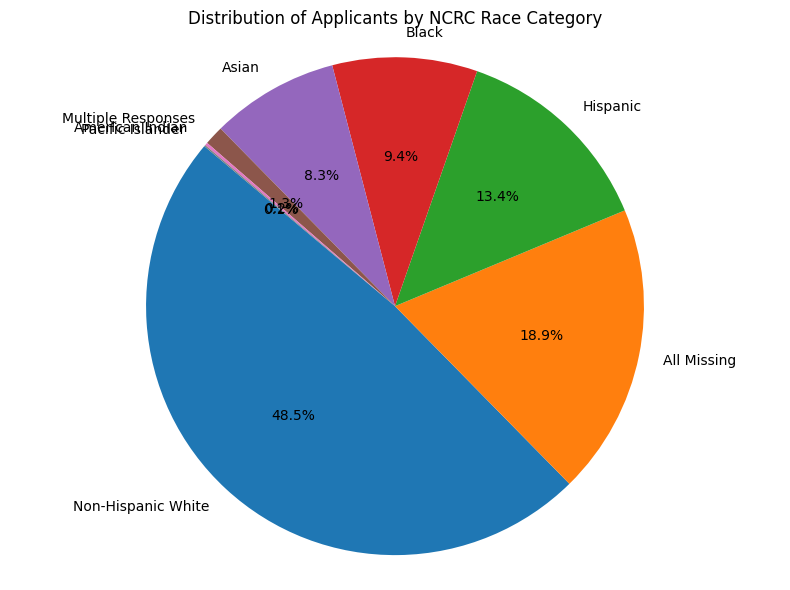

In [58]:
import matplotlib.pyplot as plt

# 统计每个种族的数量
race_counts = df_cook['ncrc_race_category'].value_counts()

# 画饼图
plt.figure(figsize=(8, 6))
plt.pie(race_counts, labels=race_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Applicants by NCRC Race Category')
plt.axis('equal')  
plt.tight_layout()
plt.show()


In [59]:
# 创建种族及其比例的表格
race_percentages = (race_counts / race_counts.sum() * 100).round(1).reset_index()
race_percentages.columns = ['Race Category', 'Percentage']

from IPython.display import display

display(race_percentages)



,Race Category,Percentage
0,Non-Hispanic White,48.5
1,All Missing,18.9
2,Hispanic,13.4
3,Black,9.4
4,Asian,8.3
5,Multiple Responses,1.3
6,American Indian,0.2
7,Pacific Islander,0.1


In [60]:
df_cook[df_cook['ncrc_race_category'] == 'Multiple Responses'][
    ['calculated_race', 'calculated_ethnicity']
].drop_duplicates()



,calculated_race,calculated_ethnicity
379,6.0,2.0
108138,7.0,2.0
139123,NaN,2.0
267005,6.0,NaN


In [61]:
# def simplify_race(code):
#    if pd.isna(code):
#        return "Unknown"
#    if code in [1, 2, 3, 4, 5]:
#        return str(int(code))  # keep simple races
#    if code in [6, 7]:
#        return "Multiple"
#    if code >= 21:
#        return "Other/Multiple"
#    return "Unknown"  # fallback

# df_cook['calculated_race1'] = df_cook['calculated_race'].apply(simplify_race)
# df_cook['calculated_co_race1'] = df_cook['calculated_co_race'].apply(simplify_race)

# df_cook.drop(['calculated_race','calculated_co_race'], axis=1, inplace=True)

# race_context_map = {
#    '1': 'American Indian or Alaska Native',
#    '2': 'Asian',
#    '3': 'Black or African American',
#    '4': 'Native Hawaiian or Pacific Islander',
#    '5': 'White',
#    'Multiple': 'Two or More Minority Races',
#    'Other/Multiple': 'Other or Free-form Race Entry',
#    'Unknown': 'Unknown or Not Provided'
#}



# Apply the mapping to create contextual columns
# df_cook['calculated_race1'] = df_cook['calculated_race1'].map(race_context_map)
# df_cook['calculated_co_race1'] = df_cook['calculated_co_race1'].map(race_context_map)

# Clean race variable
# Define a mapping to group race categories
# def clean_race(race):
#    if race in ['White', 'Black or African American', 'Asian']:
#        return race
#    elif race in ['American Indian or Alaska Native',
#                  'Native Hawaiian or Other Pacific Islander',
#                  '2 or more minority races']:
#        return 'Other Minority'
#    else:
#        return 'Unknown or Mixed'

# df_cook['calculated_race2'] = df_cook['calculated_race1'].apply(clean_race)

# Optionally drop "Unknown or Mixed" from analysis
# df_cook = df_cook[df_cook['calculated_race2'] != 'Unknown or Mixed']


def simplify_ethnicity(code):
    if pd.isna(code):
        return "Unknown/Not Applicable"
    if code == 1:
        return "Hispanic/Latino"
    elif code == 2:
        return "Not Hispanic/Latino"
    elif code in [3, 4]:
        return "Unknown/Not Applicable"
    elif code >= 11:
        return "Other/Multiple Ethnicity"
    return "Unknown/Not Applicable"

df_cook['calculated_ethnicity1'] = df_cook['calculated_ethnicity'].apply(simplify_ethnicity)
df_cook['calculated_co_ethnicity1'] = df_cook['calculated_co_ethnicity'].apply(simplify_ethnicity)

df_cook.drop(['calculated_ethnicity','calculated_co_ethnicity'], axis=1, inplace=True)

In [63]:
def show_top_unique_by_batch(df, batch_num=0, batch_size=10, top_n=50):
    """
    Display top N unique values for a batch of columns in a DataFrame, formatted like requested.

    Parameters:
    - df: DataFrame
    - batch_num: Which batch of columns to display (0 = first 10, 1 = next 10, etc.)
    - batch_size: Number of columns per batch
    - top_n: Number of top unique values to display per column
    """
    columns = df.columns.tolist()
    batches = [columns[i:i + batch_size] for i in range(0, len(columns), batch_size)]

    if batch_num >= len(batches):
        print(f"⚠️ Batch number {batch_num} is out of range.")
        return

    selected_cols = batches[batch_num]

    for col in selected_cols:
        print("=" * 40)
        print(f"{col} (dtype: {df[col].dtype})")
        try:
            values = df[col].dropna().astype(str).unique()[:top_n]
            print(values.tolist())
        except Exception as e:
            print(f"Error extracting values from '{col}': {e}")

# Example: Show the first batch of 10-20 columns
show_top_unique_by_batch(df_cook, batch_num=5)


applicant_age_numeric (dtype: float64)
[]
co_applicant_age_numeric (dtype: float64)
[]
num_denial_reasons (dtype: int64)
['1', '2', '3', '4']
ncrc_race_category (dtype: object)
['All Missing', 'Hispanic', 'Black', 'Non-Hispanic White', 'Asian', 'Multiple Responses', 'Pacific Islander', 'American Indian']


In [64]:
df_cook_clean=df_cook.copy(deep=True)

In [65]:
missing_info = df_cook_clean.isnull().sum() / df_cook_clean.shape[0]
missing_info = missing_info.sort_values(ascending=False)
print(missing_info)

co_applicant_age_numeric             1.000000
applicant_age_numeric                1.000000
applicant_age                        0.912311
adjusted_apy                         0.471689
rate_spread                          0.471473
total_loan_costs                     0.405436
origination_charges                  0.403537
debt_to_income_ratio_cleaned         0.373728
monthly_P&I_payment                  0.306644
interest_rate                        0.304585
monthly_interest                     0.304585
apy                                  0.304585
debt_to_income_ratio                 0.015535
loan_term                            0.008232
conforming_loan_limit                0.005954
census_tract                         0.000337
calculated_ethnicity                 0.000219
calculated_co_ethnicity              0.000074
calculated_race                      0.000071
calculated_co_race                   0.000024
property_value                       0.000021
tract_to_msa_income_percentage    

In [66]:
print(df_cook_clean.columns.tolist())


['activity_year', 'lei', 'census_tract', 'conforming_loan_limit', 'derived_loan_product_type', 'action_taken', 'purchaser_type', 'preapproval', 'loan_type', 'loan_purpose', 'lien_status', 'loan_amount', 'combined_loan_to_value_ratio', 'interest_rate', 'rate_spread', 'hoepa_status', 'total_loan_costs', 'origination_charges', 'loan_term', 'property_value', 'construction_method', 'occupancy_type', 'total_units', 'income', 'debt_to_income_ratio', 'applicant_sex', 'co_applicant_sex', 'applicant_age', 'co_applicant_age', 'submission_of_application', 'aus_1', 'denial_reason_1', 'tract_population', 'tract_minority_population_percent', 'tract_to_msa_income_percentage', 'tract_owner_occupied_units', 'tract_one_to_four_family_homes', 'tract_median_age_of_housing_units', 'calculated_ethnicity', 'calculated_race', 'calculated_co_ethnicity', 'calculated_co_race', 'total_charges_to_borrower', 'apy', 'monthly_interest', 'monthly_P&I_payment', 'adjusted_apy', 'no_co_applicant', 'debt_to_income_ratio_mi

In [67]:
df_cook_clean['action_taken'].value_counts(normalize=True).round(3)

action_taken
Loan originated                                  0.553
Application withdrawn by applicant               0.146
Purchased loan                                   0.125
Application denied                               0.110
File closed for incompleteness                   0.047
Application approved but not accepted            0.019
Preapproval request approved but not accepted    0.000
Preapproval request denied                       0.000
Name: proportion, dtype: float64

# 1. Racial Disparity?

In [69]:
# 贷款是否通过：构造 approval 列
df_cook_clean['approved'] = df_cook_clean['action_taken'].isin(["Loan originated","Application approved but not accepted"])


# rate_spread 已存在，可直接使用（注意处理缺失值）
# df_cook_clean = df_cook_clean[~df_cook_clean['rate_spread'].isna()]


In [70]:
print(df_cook_clean['action_taken'].unique())


['Purchased loan' 'Application denied'
 'Application withdrawn by applicant' 'Loan originated'
 'Application approved but not accepted' 'File closed for incompleteness'
 'Preapproval request approved but not accepted'
 'Preapproval request denied']


In [71]:
print(df_cook_clean['approved'].sum())


193329


##  1.1 Approval Rate by Race/Ethnicity

C:\Users\admin\AppData\Local\Temp\ipykernel_10344\1419170343.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(


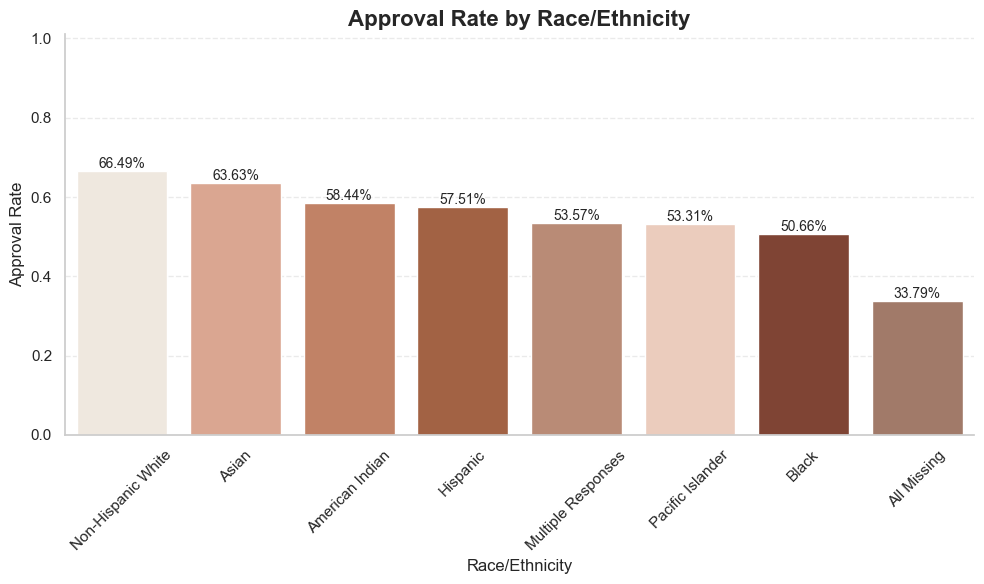

In [73]:
import matplotlib.pyplot as plt
import seaborn as sns

race_categories = [
    "Non-Hispanic White",
    "Black",
    "Asian",
    "Hispanic",
    "American Indian",
    "Pacific Islander",
    "Multiple Responses",
    "All Missing"
]

race_palette = {
    "Non-Hispanic White": "#F2E8DC",
    "Black": "#8C3D27",
    "Asian": "#E6A185",
    "Hispanic": "#B25D34",
    "American Indian": "#D07C57",
    "Pacific Islander": "#F2C9B6",
    "Multiple Responses": "#C4876B",
    "All Missing": "#AA7760"
}

# 分组 + 计算通过率
approval_rate = df_cook_clean.groupby('ncrc_race_category')['approved'].mean().reset_index()
approval_rate.columns = ['Race/Ethnicity', 'Approval Rate']
approval_rate = approval_rate.sort_values('Approval Rate', ascending=False)

# 图表设置
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")

bars = sns.barplot(
    data=approval_rate,
    x='Race/Ethnicity',
    y='Approval Rate',
    palette=race_palette
)

# 添加数据标签
for bar in bars.patches:
    height = bar.get_height()
    bars.annotate(f"{height:.2%}",
                  (bar.get_x() + bar.get_width() / 2, height),
                  ha='center', va='bottom', fontsize=10)

# 图形优化：从 0.8 开始，去掉上边框
plt.ylim(0, 1.01)
plt.title('Approval Rate by Race/Ethnicity', fontsize=16, weight='bold')
plt.ylabel('Approval Rate')
plt.xlabel('Race/Ethnicity')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.4)

# 去掉顶部和右侧边框
sns.despine(top=True, right=True)

plt.tight_layout()
plt.show()


### 1.2 Rate_spread & Race box-plot

In [75]:
df_cook_clean['rate_spread'].max()

100.0

In [76]:
# 上下1%分位点
lower = df_cook_clean['rate_spread'].quantile(0.01)
upper = df_cook_clean['rate_spread'].quantile(0.99)

# 去除极值
df_no_outlier = df_cook_clean[
    (df_cook_clean['rate_spread'] >= lower) &
    (df_cook_clean['rate_spread'] <= upper)
]


C:\Users\admin\AppData\Local\Temp\ipykernel_10344\2446951116.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_no_outlier, x='ncrc_race_category', y='rate_spread', palette=race_palette)


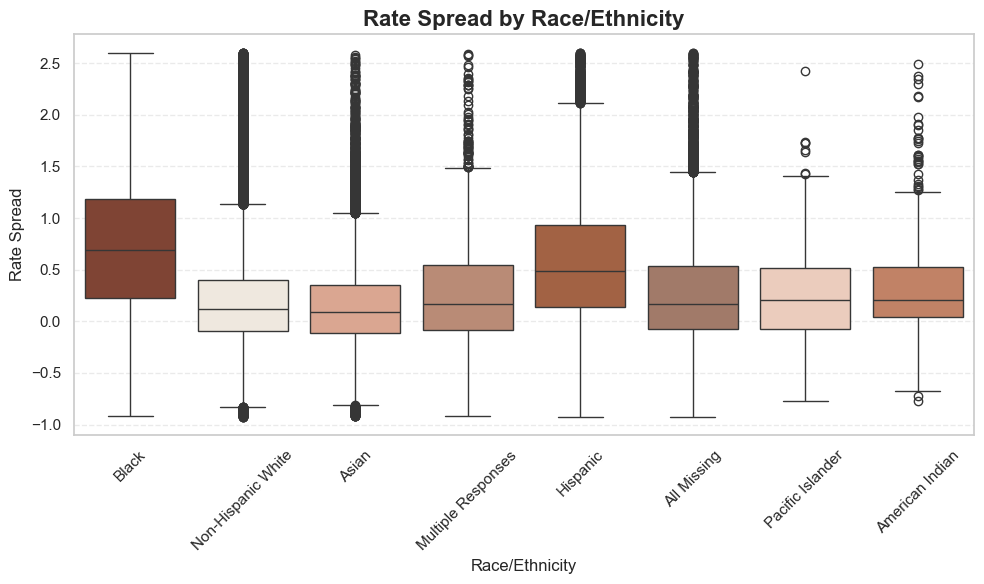

In [77]:

# 色调统一：砖红系（最多5类种族）


plt.figure(figsize=(10, 6))
sns.boxplot(data=df_no_outlier, x='ncrc_race_category', y='rate_spread', palette=race_palette)
plt.title('Rate Spread by Race/Ethnicity', fontsize=16, weight='bold')
plt.xlabel('Race/Ethnicity')
plt.ylabel('Rate Spread')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


# 2. Why Disparity?

# Data visualization

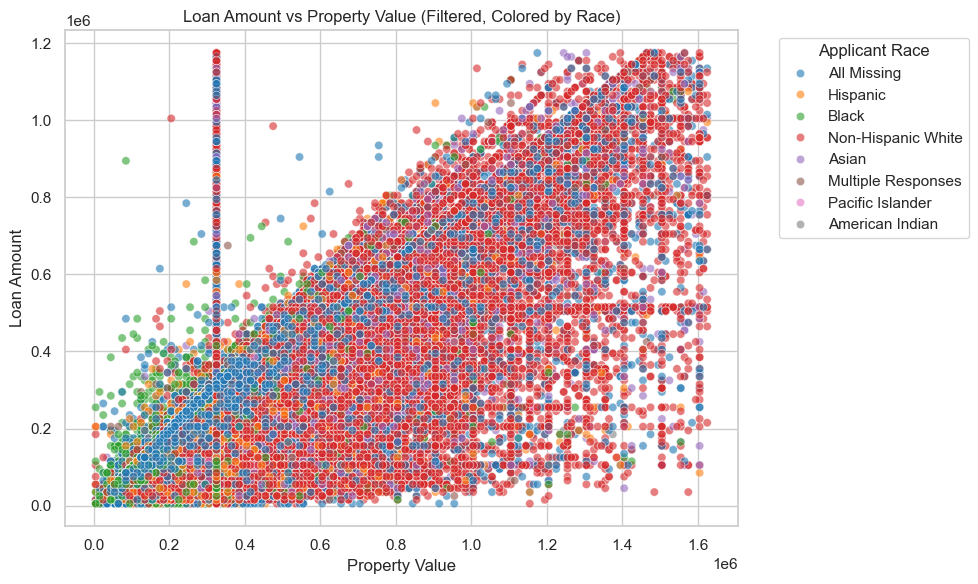

In [80]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set global aesthetics
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (10, 6)

# 1. Loan Amount vs Property Value with hue
# Filter out top 1% outliers
q99_loan = df_cook['loan_amount'].quantile(0.99)
q99_value = df_cook['property_value'].quantile(0.99)

df_plot1 = df_cook[
    (df_cook['loan_amount'] <= q99_loan) &
    (df_cook['property_value'] <= q99_value)
].dropna(subset=['loan_amount', 'property_value', 'ncrc_race_category'])

df_plot1=df_plot1[df_plot1.property_value!=315000]
# Scatterplot with hue
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df_plot1,
    x="property_value",
    y="loan_amount",
    hue="ncrc_race_category",
    palette="tab10",
    alpha=0.6
)
plt.title("Loan Amount vs Property Value (Filtered, Colored by Race)")
plt.xlabel("Property Value")
plt.ylabel("Loan Amount")
plt.legend(title="Applicant Race", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


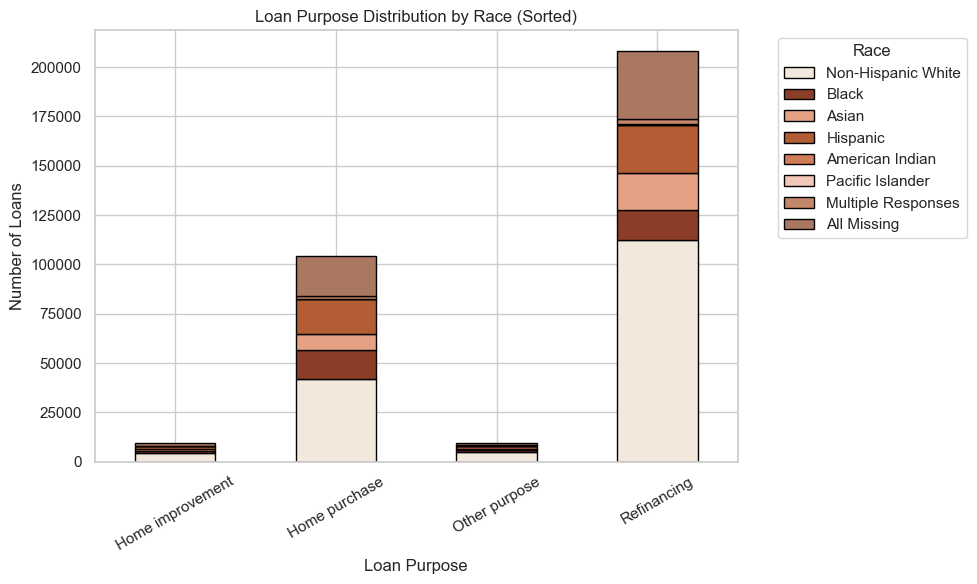

In [268]:
# Step 1: Create a crosstab of loan purpose by race category
purpose_race_ct = pd.crosstab(df_cook_clean['loan_purpose'], df_cook_clean['ncrc_race_category'])

# Step 2: Remove rows labeled as "Not applicable" or "NA"
purpose_race_ct = purpose_race_ct[~purpose_race_ct.index.astype(str).str.lower().isin(["not applicable", "na"])]

# Step 3: Define race order based on predefined palette (for consistent coloring)
race_order = [race for race in race_palette.keys() if race in purpose_race_ct.columns]
purpose_race_ct_sorted = purpose_race_ct[race_order]  # Reorder columns to match race_palette

# Step 4: Generate color list based on race order
colors = [race_palette[race] for race in race_order]

# Step 5: Plot a stacked bar chart with consistent race colors
purpose_race_ct_sorted.plot(
    kind='bar',
    stacked=True,
    figsize=(10, 6),
    color=colors,
    edgecolor='black'
)

# Step 6: Chart formatting
plt.title("Loan Purpose Distribution by Race (Sorted)")
plt.xlabel("Loan Purpose")
plt.ylabel("Number of Loans")
plt.xticks(rotation=30)
plt.legend(title="Race", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout_


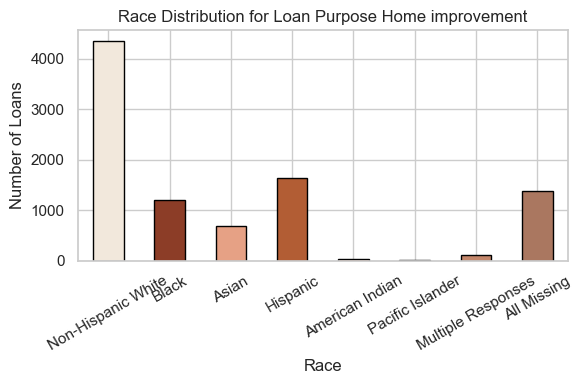

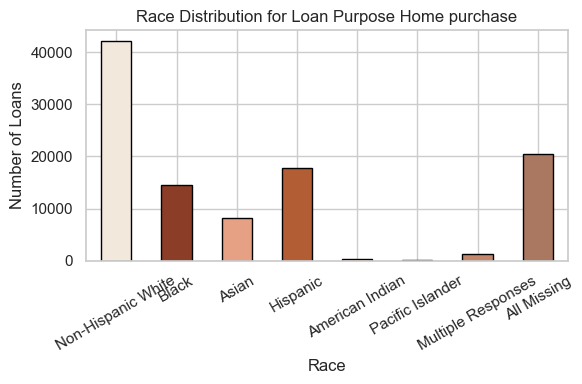

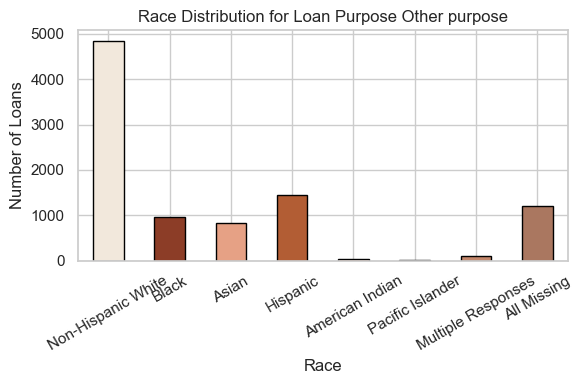

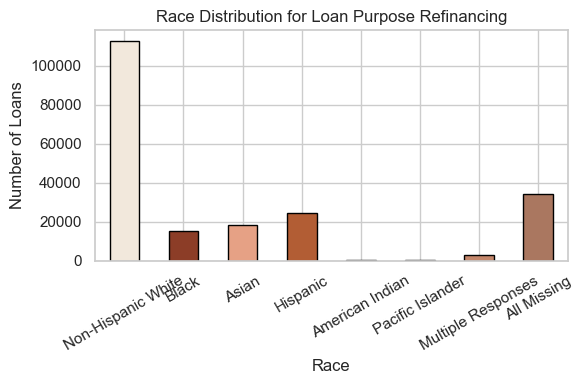

In [270]:
# 每个贷款用途分别画图
df_filtered = df_cook_clean[df_cook_clean['loan_purpose'].astype(str).str.lower() != 'not applicable']

for purpose in purpose_race_ct_sorted.index:
    data = purpose_race_ct_sorted.loc[purpose]
    data.plot(
        kind='bar',
        figsize=(6, 4),
        color=colors,
        edgecolor='black'
    )
    plt.title(f"Race Distribution for Loan Purpose {purpose}")
    plt.xlabel("Race")
    plt.ylabel("Number of Loans")
    plt.xticks(rotation=30)
    plt.tight_layout()
    plt.show()


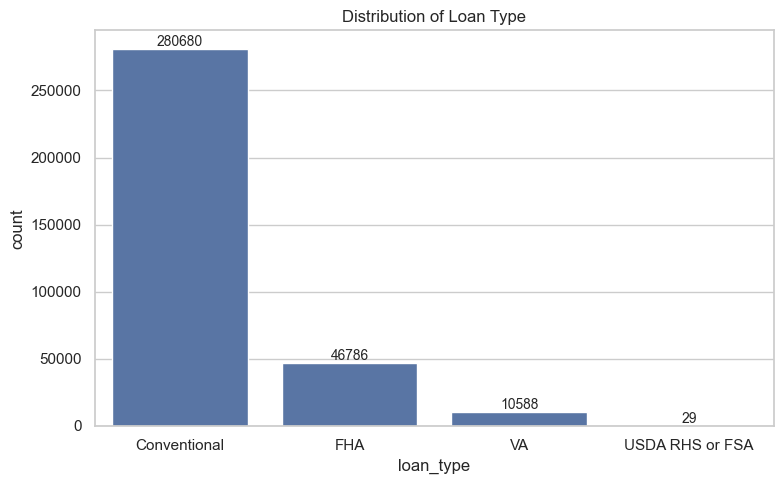

In [124]:
plt.figure(figsize=(8, 5))
ax = sns.countplot(data=df_cook_clean, x="loan_type")
plt.title("Distribution of Loan Type")

# 添加数值标签
for p in ax.patches:
    count = int(p.get_height())
    ax.annotate(str(count), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


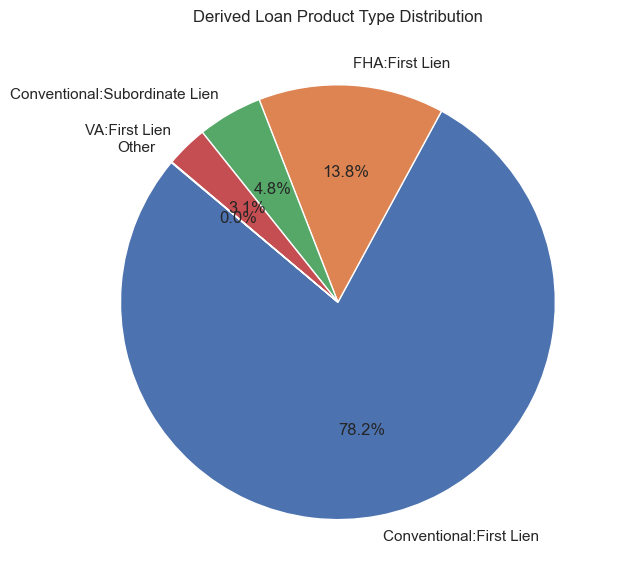

In [126]:
import matplotlib.pyplot as plt

# Step 1: Get value counts
value_counts = df_cook_clean['derived_loan_product_type'].value_counts()

# Step 2: Filter for categories with more than 1% share
threshold = 0.01 * value_counts.sum()
major_categories = value_counts[value_counts > threshold]
other_sum = value_counts[value_counts <= threshold].sum()

# Step 3: Combine small categories into "Other"
if other_sum > 0:
    major_categories["Other"] = other_sum

# Step 4: Plot
major_categories.plot(kind='pie', autopct='%1.1f%%', startangle=140)
plt.title("Derived Loan Product Type Distribution")
plt.ylabel("")  # hide y-axis label
plt.tight_layout()
plt.show()


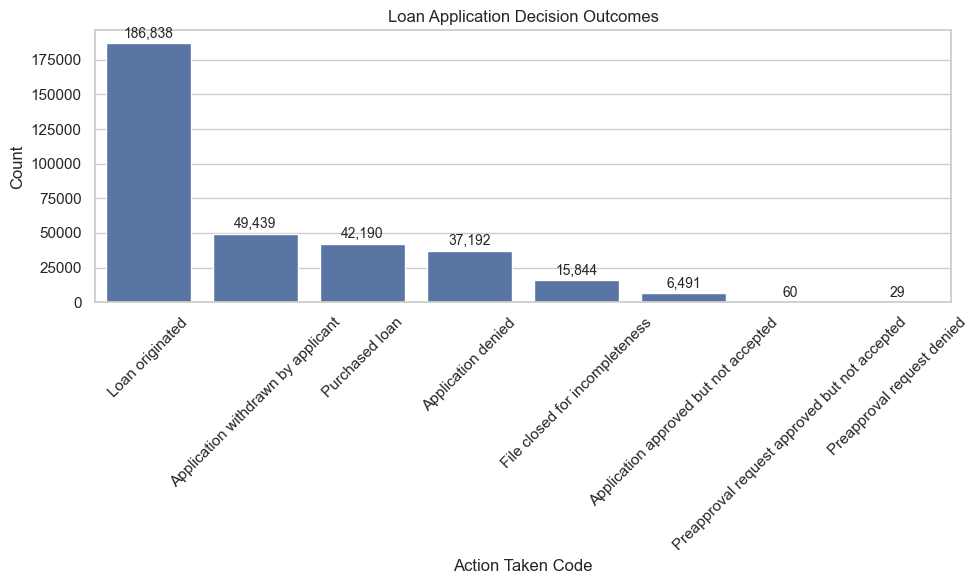

In [127]:
# 3. Loan Application Outcome
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: 直接按 action_taken 数值统计频数
action_counts = df_cook_clean['action_taken'].value_counts().sort_values(ascending=False)

# Step 2: 绘制柱状图
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=action_counts.index.astype(str), y=action_counts.values)

# Step 3: 添加数值标签在柱子上方
for i, count in enumerate(action_counts.values):
    ax.text(i, count + max(action_counts.values) * 0.01, f'{count:,}', 
            ha='center', va='bottom', fontsize=10)

# Step 4: 美化图表
plt.title("Loan Application Decision Outcomes")
plt.ylabel("Count")
plt.xlabel("Action Taken Code")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()




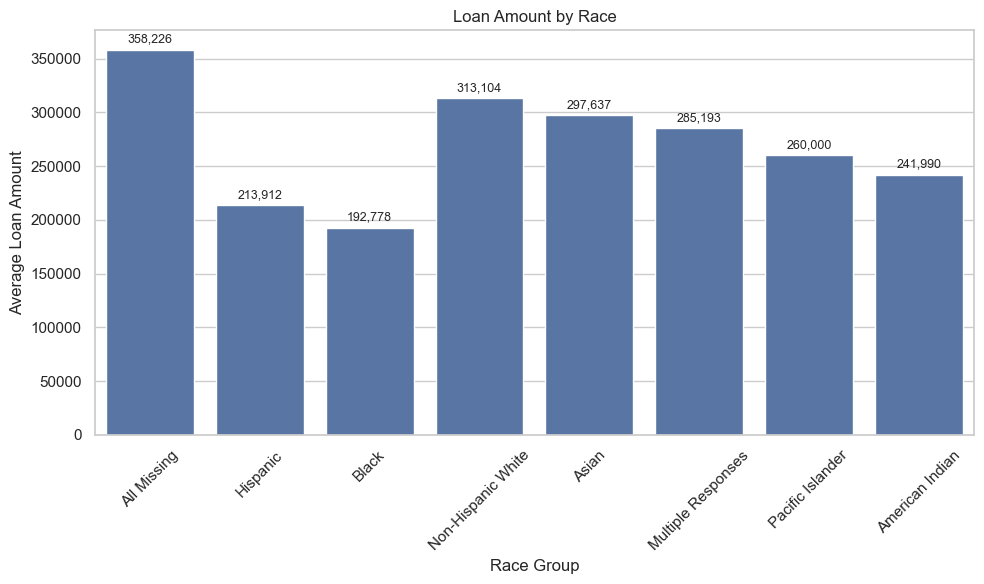

In [186]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
ax = sns.barplot(data=df_cook_clean, x="ncrc_race_category", y="loan_amount", errorbar=None)

# 在柱子上标记平均值

for p in ax.patches:
    val = p.get_height()
    ax.annotate(f'{val:,.0f}', 
                (p.get_x() + p.get_width() / 2., val), 
                ha='center', va='bottom', fontsize=9, xytext=(0, 3),
                textcoords='offset points')

plt.title("Loan Amount by Race")
plt.ylabel("Average Loan Amount")
plt.xlabel("Race Group")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


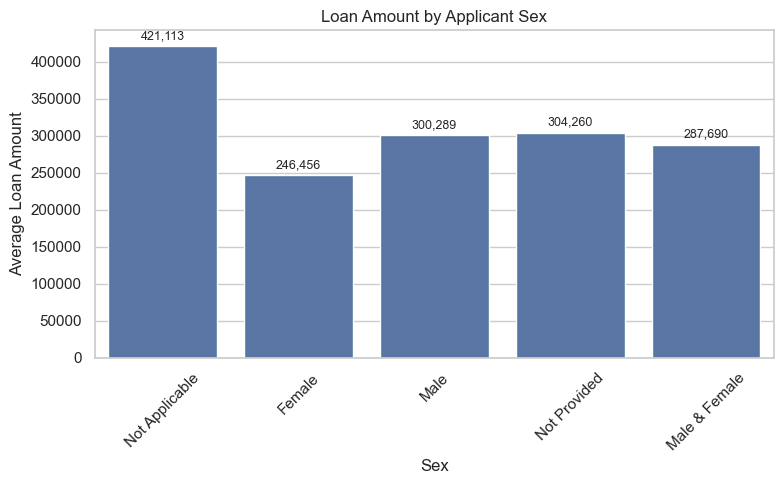

In [188]:
# 4. Race and Gender Disparities
plt.figure(figsize=(8, 5))
ax = sns.barplot(data=df_cook_clean, x="applicant_sex", y="loan_amount", errorbar=None)

# 在柱子上标记平均值
for p in ax.patches:
    val = p.get_height()
    ax.annotate(f'{val:,.0f}', 
                (p.get_x() + p.get_width() / 2., val), 
                ha='center', va='bottom', fontsize=9, xytext=(0, 3),
                textcoords='offset points')

plt.title("Loan Amount by Applicant Sex")
plt.ylabel("Average Loan Amount")
plt.xlabel("Sex")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


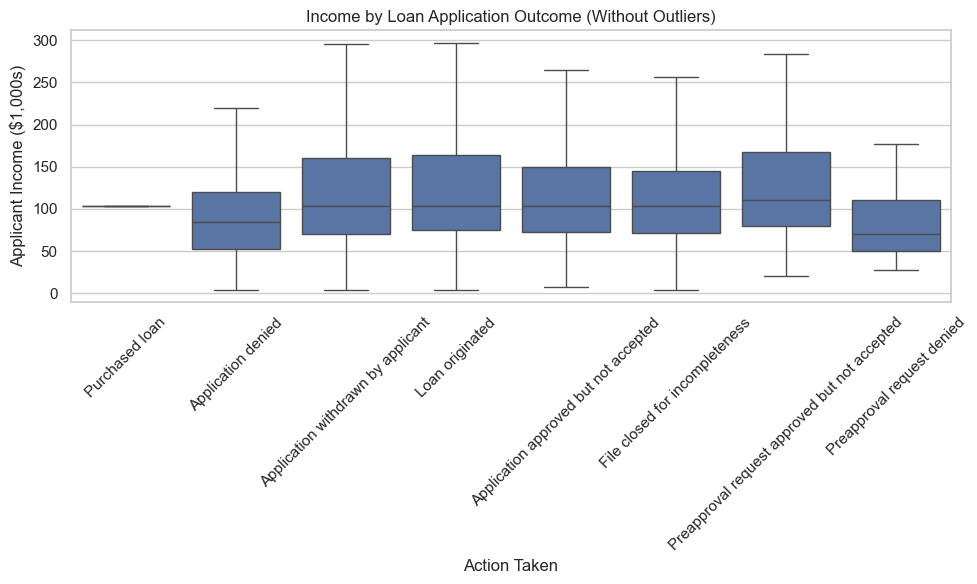

In [190]:
# 6. Income vs Approval Outcome
import seaborn as sns
import matplotlib.pyplot as plt

import pandas as pd

# Step 1: Drop rows with missing values
df_income_plot = df_cook_clean.dropna(subset=['income', 'action_taken'])

# Step 2: Remove outliers using percentile thresholds (optional but recommended)
q_low, q_high = df_income_plot['income'].quantile([0.01, 0.99])

df_income_plot = df_income_plot[
    (df_income_plot['income'] >= q_low) & 
    (df_income_plot['income'] <= q_high)
]

plt.figure(figsize=(10, 6))
sns.boxplot(data=df_income_plot, x="action_taken", y="income", showfliers=False)

plt.title("Income by Loan Application Outcome (Without Outliers)")
plt.xlabel("Action Taken")
plt.ylabel("Applicant Income ($1,000s)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



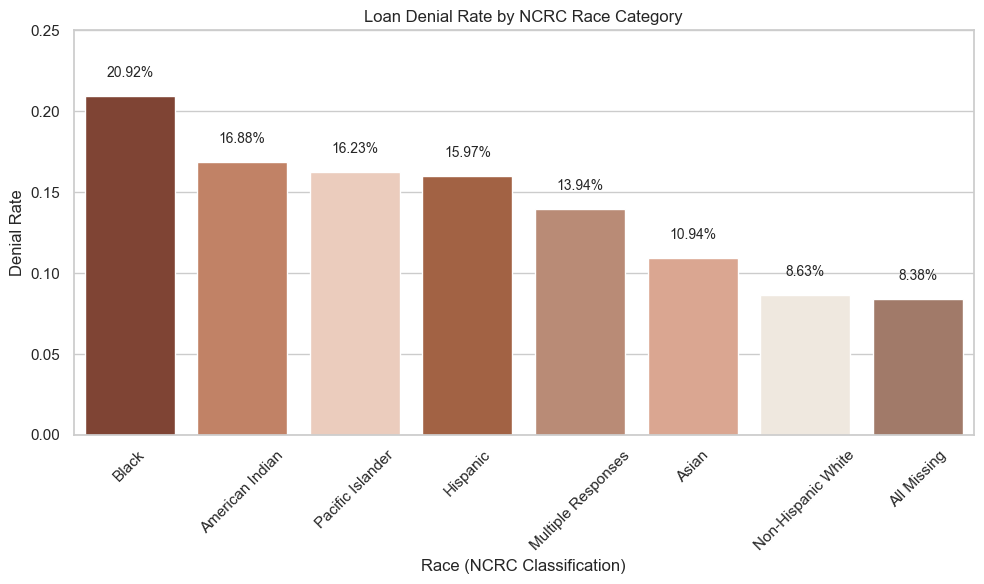

In [192]:
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Calculate denial rates by NCRC race category
denial_df = (
    df_cook_clean.groupby("ncrc_race_category")
    .apply(lambda g: (g["action_taken"] == "Application denied").sum() / len(g))  # 3 = Application Denied
    .reset_index(name="denial_rate")
)

# Step 2: Sort by denial rate
denial_df_sorted = denial_df.sort_values(by="denial_rate", ascending=False).reset_index(drop=True)

custom_palette = [
    "#B25D34", "#D07C57", "#E6A185", "#F2C9B6", "#8C3D27", "#D8A07B"
]
# Step 3: Plot
plt.figure(figsize=(10, 6))
ax = sns.barplot(
    data=denial_df_sorted,
    x="ncrc_race_category",
    y="denial_rate",
    hue="ncrc_race_category",
    palette=race_palette ,
    dodge=False,
    legend=False
)

# Step 4: Add labels above bars
for i, row in denial_df_sorted.iterrows():
    ax.text(i, row["denial_rate"] + 0.01, f'{row["denial_rate"]:.2%}',
            ha='center', va='bottom', fontsize=10)

# Final formatting
plt.title("Loan Denial Rate by NCRC Race Category")
plt.ylabel("Denial Rate")
plt.xlabel("Race (NCRC Classification)")
plt.ylim(0, 0.25)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


C:\Users\admin\AppData\Local\Temp\ipykernel_10344\2945726030.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_cook_clean,


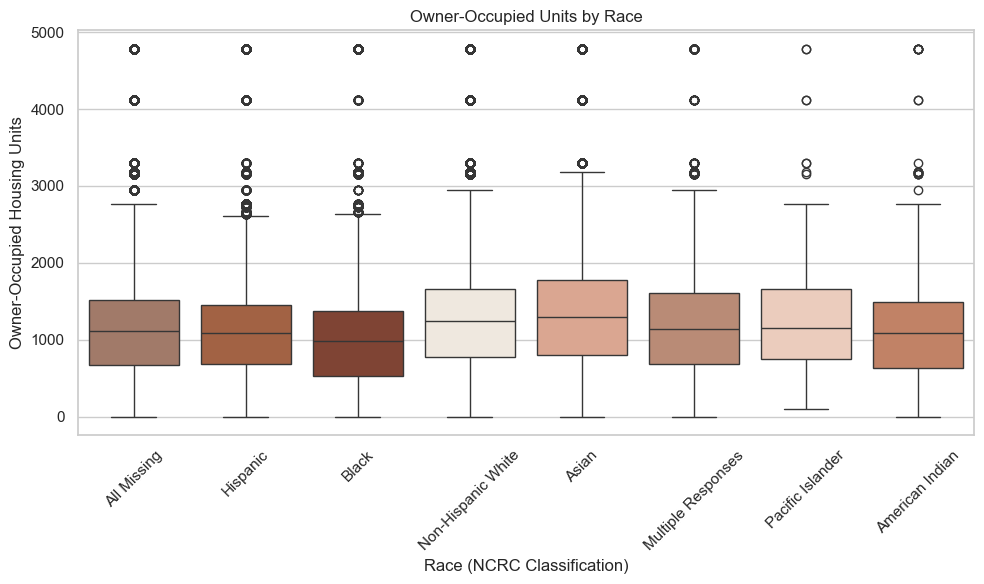

In [196]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot 1: Owner-Occupied Units by Race
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_cook_clean, 
            x="ncrc_race_category", 
            y="tract_owner_occupied_units", 
            palette=race_palette)
plt.title("Owner-Occupied Units by Race")
plt.xlabel("Race (NCRC Classification)")
plt.ylabel("Owner-Occupied Housing Units")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

C:\Users\admin\AppData\Local\Temp\ipykernel_10344\1912154676.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_cook_clean,


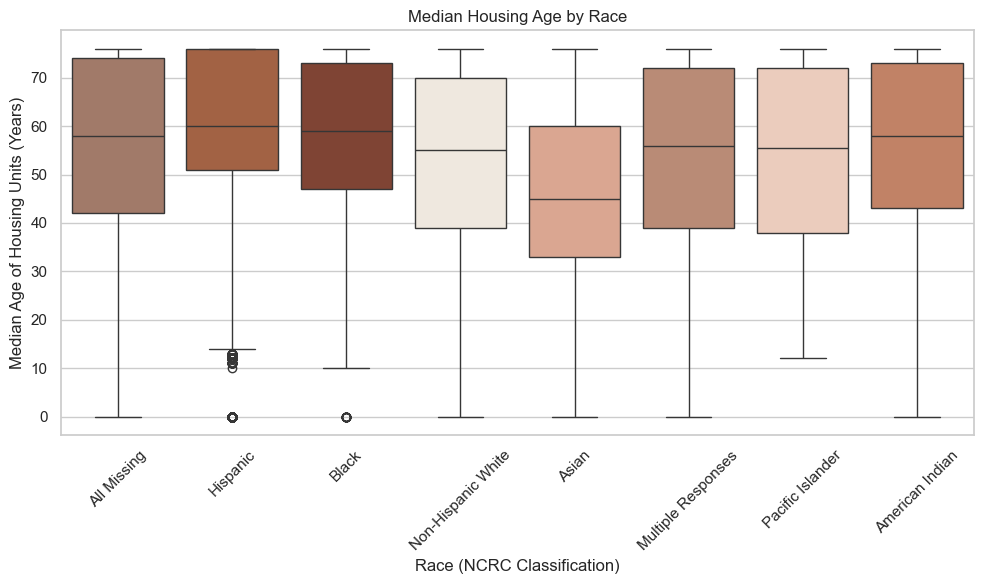

In [197]:
# Plot 2: Median Age of Housing Units by Race
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_cook_clean, 
            x="ncrc_race_category", 
            y="tract_median_age_of_housing_units", 
            palette=race_palette)
plt.title("Median Housing Age by Race")
plt.xlabel("Race (NCRC Classification)")
plt.ylabel("Median Age of Housing Units (Years)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


C:\Users\admin\AppData\Local\Temp\ipykernel_10344\4031616357.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(data=df_cook_clean, x="ncrc_race_category", y="tract_owner_occupied_units", ci='sd', palette=race_palette)
C:\Users\admin\AppData\Local\Temp\ipykernel_10344\4031616357.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_cook_clean, x="ncrc_race_category", y="tract_owner_occupied_units", ci='sd', palette=race_palette)


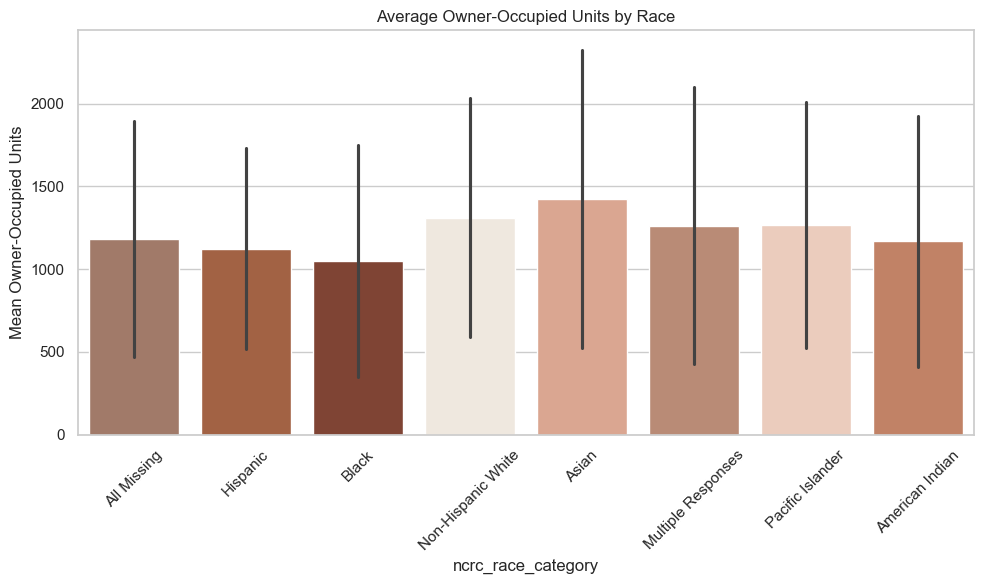

In [198]:
# Barplot with error bars (std)
plt.figure(figsize=(10, 6))
sns.barplot(data=df_cook_clean, x="ncrc_race_category", y="tract_owner_occupied_units", ci='sd', palette=race_palette)
plt.title("Average Owner-Occupied Units by Race")
plt.xticks(rotation=45)
plt.ylabel("Mean Owner-Occupied Units")
plt.tight_layout()
plt.show()


## Income & Debt_to_income_ratio

In [200]:
grouped = df_cook_clean.groupby(['debt_to_income_ratio_cleaned', 'ncrc_race_category'])['rate_spread'].mean().reset_index()



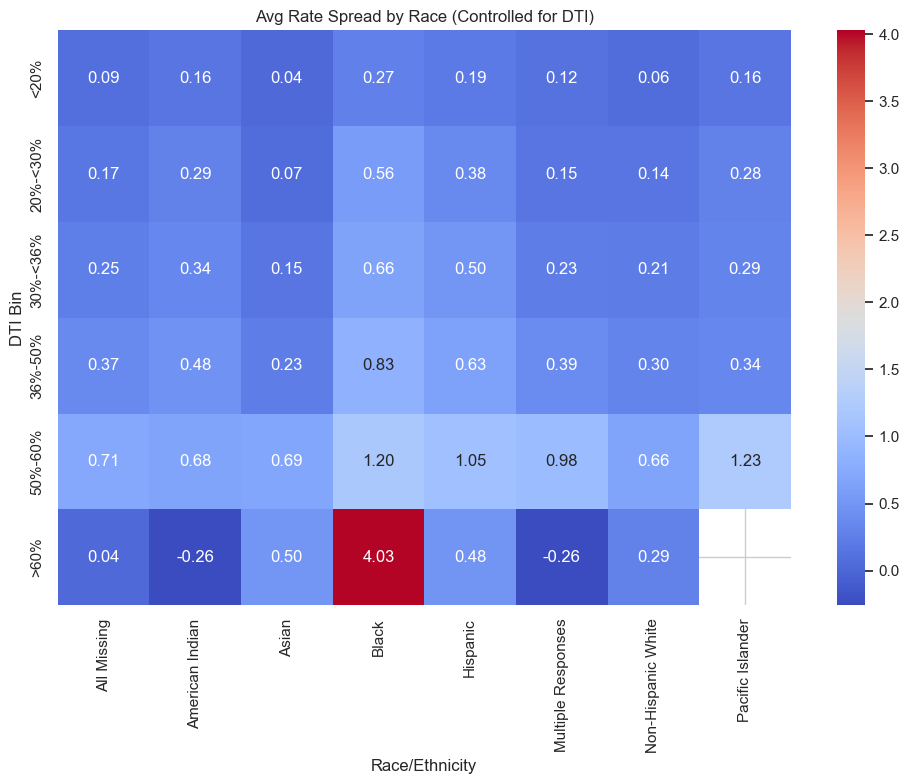

In [201]:


# 设定自定义 DTI 排序顺序
dti_order = ['<20%', '20%-<30%', '30%-<36%', '36%-50%', '50%-60%', '>60%']

# 将 DTI 字段设置为有序类别
grouped['debt_to_income_ratio_cleaned'] = pd.Categorical(
    grouped['debt_to_income_ratio_cleaned'],
    categories=dti_order,
    ordered=True
)

# 创建 pivot table
pivot = grouped.pivot(index='debt_to_income_ratio_cleaned', columns='ncrc_race_category', values='rate_spread')

# 画图
plt.figure(figsize=(10, 8))
sns.heatmap(pivot, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Avg Rate Spread by Race (Controlled for DTI)")
plt.xlabel("Race/Ethnicity")
plt.ylabel("DTI Bin")
plt.tight_layout()
plt.show()


C:\Users\admin\AppData\Local\Temp\ipykernel_10344\3693998569.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  g = sns.catplot(
C:\Users\admin\AppData\Local\Temp\ipykernel_10344\3693998569.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


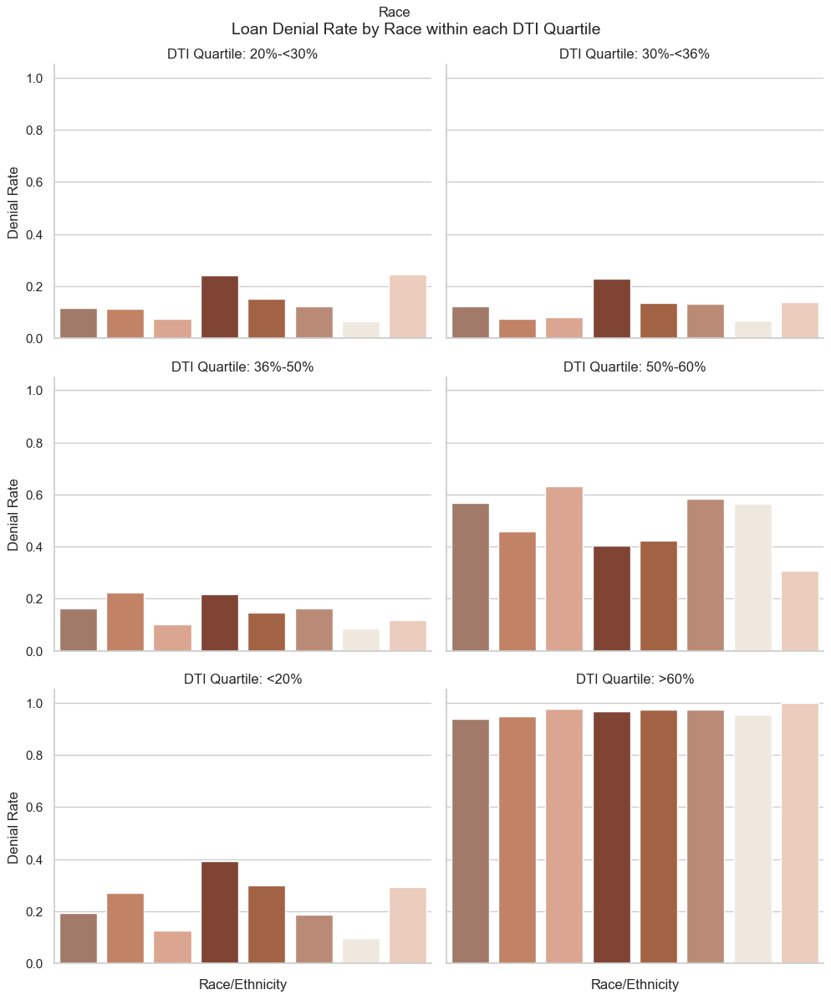

In [202]:

# Step 1: 先计算每个 DTI 档位中，不同种族的拒绝率
denial_df = (
    df_cook_clean
    .groupby(['debt_to_income_ratio_cleaned', 'ncrc_race_category'])
    .apply(lambda g: (g['action_taken'] == "Application denied").sum() / len(g))
    .reset_index(name='denial_rate')
)

# Step 2: 使用 catplot 按 DTI 档画每个种族的拒绝率
g = sns.catplot(
    data=denial_df, kind='bar',
    x='ncrc_race_category', y='denial_rate',
    col='debt_to_income_ratio_cleaned', col_wrap=2,
    height=4, aspect=1.2,
    palette=race_palette
)

# Step 3: 格式设置
g.set_titles("DTI Quartile: {col_name}")
g.set_axis_labels("Race/Ethnicity", "Denial Rate")
g.fig.subplots_adjust(top=0.88)
g.fig.suptitle("Loan Denial Rate by Race within each DTI Quartile", fontsize=14)
for ax in g.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    
# ✅ 添加 legend
g.add_legend(title="Race")
g._legend.set_bbox_to_anchor((0.5, 0.98))
g._legend.set_frame_on(False)
g._legend.set_title("Race")  


plt.tight_layout()
plt.show()


## ANOVA Test to Demonstrate Statistical Significance of Differences


In [204]:
from scipy.stats import f_oneway

# 按 DTI 档逐个做 ANOVA
for dti_level in df_cook_clean['debt_to_income_ratio_cleaned'].unique():
    subset = df_cook_clean[df_cook_clean['debt_to_income_ratio_cleaned'] == dti_level]
    
    # 构造一个包含各个种族 rate_spread 的列表
    groups = [
        subset[subset['ncrc_race_category'] == race]['rate_spread'].dropna()
        for race in subset['ncrc_race_category'].unique()
    ]
    
    # 只在有至少两个种族时再进行 ANOVA
    if len(groups) >= 2:
        stat, pval = f_oneway(*groups)
        print(f"DTI Quartile {dti_level} ➤ F = {stat:.3f}, p = {pval:.4f}")


DTI Quartile 36%-50% ➤ F = 700.942, p = 0.0000
DTI Quartile 50%-60% ➤ F = 68.679, p = 0.0000
DTI Quartile 20%-<30% ➤ F = 229.648, p = 0.0000
DTI Quartile 30%-<36% ➤ F = 207.960, p = 0.0000
DTI Quartile <20% ➤ F = 19.990, p = 0.0000
DTI Quartile >60% ➤ F = nan, p = nan


C:\Users\admin\anaconda3\Lib\site-packages\scipy\stats\_stats_py.py:4133: DegenerateDataWarning: at least one input has length 0
  warnings.warn(stats.DegenerateDataWarning('at least one input '


In [205]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import pandas as pd

# 存储所有结果
all_results = []

# 遍历每个 DTI 档位
for dti_level in df_cook_clean['debt_to_income_ratio_cleaned'].dropna().unique():
    subset = df_cook_clean[df_cook_clean['debt_to_income_ratio_cleaned'] == dti_level]
    
    # 移除缺失值
    subset = subset.dropna(subset=['rate_spread', 'ncrc_race_category'])
    
    # 检查是否至少有两组以上种族
    if subset['ncrc_race_category'].nunique() >= 2:
        
        tukey = pairwise_tukeyhsd(
            endog=subset['rate_spread'],
            groups=subset['ncrc_race_category'],
            alpha=0.05
        )
        
        # 转为DataFrame更好看
        tukey_df = pd.DataFrame(data=tukey._results_table.data[1:], columns=tukey._results_table.data[0])
        tukey_df['DTI Group'] = dti_level
        
        all_results.append(tukey_df)

# 合并所有组的结果
final_results = pd.concat(all_results, ignore_index=True)

# 只显示显著差异的（p < 0.05）
significant_results = final_results[final_results['p-adj'] < 0.05]

display(significant_results)




,group1,group2,meandiff,p-adj,lower,upper,reject,DTI Group
1,All Missing,Asian,-0.1469,0.0000,-0.1848,-0.1089,True,36%-50%
2,All Missing,Black,0.4556,0.0000,0.4176,0.4935,True,36%-50%
3,All Missing,Hispanic,0.2577,0.0000,0.2241,0.2913,True,36%-50%
5,All Missing,Non-Hispanic White,-0.0791,0.0000,-0.1086,-0.0496,True,36%-50%
7,American Indian,Asian,-0.2486,0.0035,-0.4466,-0.0507,True,36%-50%
8,American Indian,Black,0.3538,0.0000,0.1558,0.5517,True,36%-50%
13,Asian,Black,0.6024,0.0000,0.5651,0.6397,True,36%-50%
14,Asian,Hispanic,0.4046,0.0000,0.3716,0.4375,True,36%-50%
15,Asian,Multiple Responses,0.1628,0.0000,0.0790,0.2466,True,36%-50%
16,Asian,Non-Hispanic White,0.0678,0.0000,0.0391,0.0964,True,36%-50%


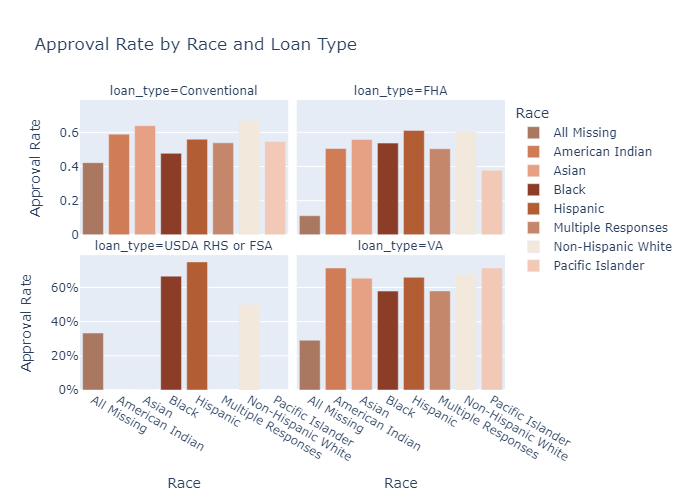

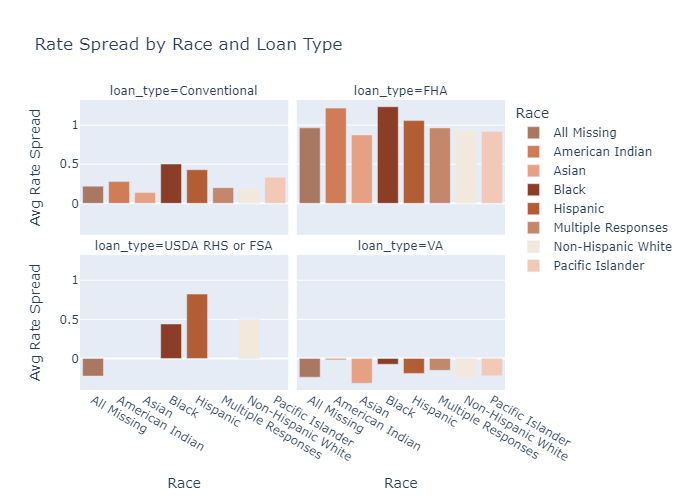

In [206]:
import pandas as pd
import plotly.express as px

race_palette_plotly = {
    "Non-Hispanic White": "#F2E8DC",
    "Black": "#8C3D27",
    "Asian": "#E6A185",
    "Hispanic": "#B25D34",
    "American Indian": "#D07C57",
    "Pacific Islander": "#F2C9B6",
    "Multiple Responses": "#C4876B",
    "All Missing": "#AA7760"
}


# 使用已有的 df_cook_clean
df = df_cook_clean.copy()

# 清洗数据
df = df[
    df['ncrc_race_category'].notna() &
    df['loan_type'].notna() &
    df['approved'].isin([True, False])
].copy()

# 确保 rate_spread 是数值型
df['rate_spread'] = pd.to_numeric(df['rate_spread'], errors='coerce')

# 分组统计
summary_df = (
    df.groupby(['loan_type', 'ncrc_race_category'])
    .agg(
        approval_rate=('approved', 'mean'),
        avg_rate_spread=('rate_spread', 'mean'),
        num_loans=('approved', 'count')
    )
    .reset_index()
)

# ✅ 图1：批准率
fig1 = px.bar(
    summary_df,
    x='ncrc_race_category',
    y='approval_rate',
    color='ncrc_race_category',
    color_discrete_map=race_palette_plotly, 
    facet_col='loan_type',
    facet_col_wrap=2,
    labels={'ncrc_race_category': 'Race', 'approval_rate': 'Approval Rate'},
    title="Approval Rate by Race and Loan Type",
    height=500
)
fig1.update_layout(yaxis_tickformat=".0%")
fig1.show()

# ✅ 图2：平均利差
fig2 = px.bar(
    summary_df,
    x='ncrc_race_category',
    y='avg_rate_spread',
    color='ncrc_race_category',
    color_discrete_map=race_palette_plotly,  
    facet_col='loan_type',
    facet_col_wrap=2,
    labels={'ncrc_race_category': 'Race', 'avg_rate_spread': 'Avg Rate Spread'},
    title="Rate Spread by Race and Loan Type",
    height=500
)
fig2.show()


In [207]:
# Ensure the 'denied' column exists (True if the application was denied)
df_cook_clean['denied'] = df_cook_clean['action_taken'] == "Application denied"

# Remove rows with missing race information
df_approval = df_cook_clean[df_cook_clean['ncrc_race_category'].notna()]

# Group by DTI bin and race to calculate denial rate
approval_rate_grouped = (
    df_approval
    .groupby(['debt_to_income_ratio_cleaned', 'ncrc_race_category'])['denied']
    .mean()
    .reset_index()
)

# Rename columns for clarity
approval_rate_grouped.columns = ['DTI Bin', 'Race/Ethnicity', 'Denial Rate']


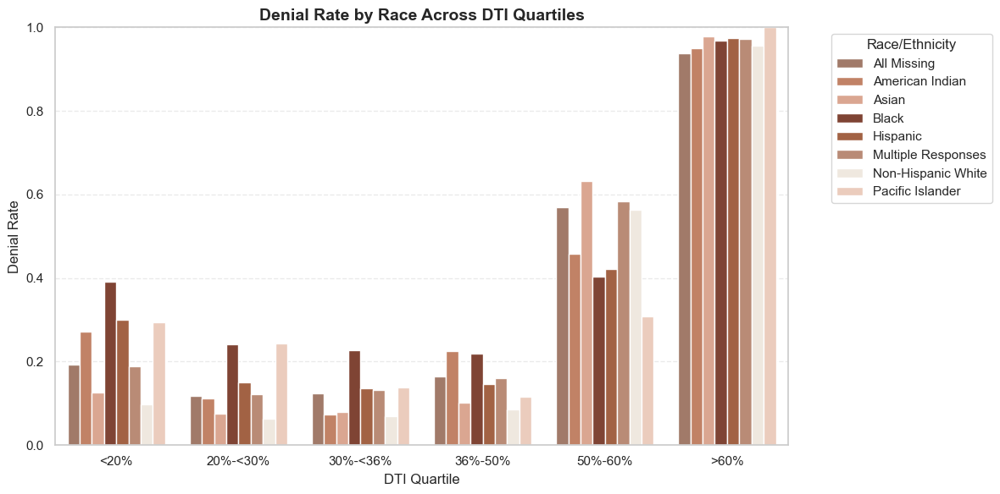

In [208]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.barplot(
    data=approval_rate_grouped,
    x='DTI Bin', y='Denial Rate', hue='Race/Ethnicity',
    palette=race_palette,
    order=['<20%', '20%-<30%', '30%-<36%','36%-50%','50%-60%','>60%'] 
)

plt.title("Denial Rate by Race Across DTI Quartiles", fontsize=14, weight='bold')
plt.ylim(0, 1)
plt.ylabel("Denial Rate")
plt.xlabel("DTI Quartile")
plt.legend(title="Race/Ethnicity", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()



## AUS

In [210]:
df_cook_clean['denied'] = df_cook_clean['action_taken'] == "Application denied"


In [211]:
grouped = df_cook_clean.groupby(['aus_1', 'ncrc_race_category'])['denied'].mean().reset_index()


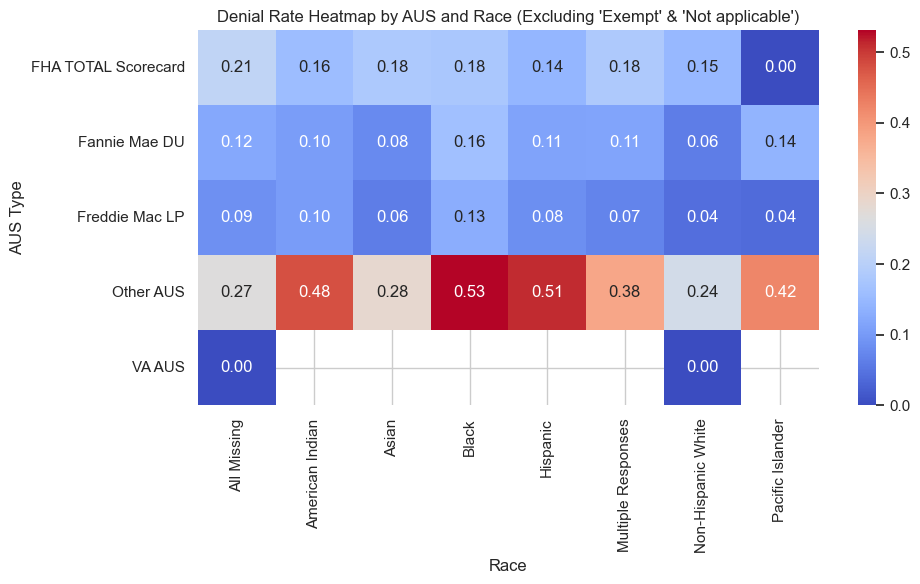

In [212]:
import seaborn as sns
import matplotlib.pyplot as plt

# filter Exempt & Not applicable
filtered_grouped = grouped[~grouped['aus_1'].isin(['Exempt', 'Not applicable'])]

#  pivot table
pivot_table = filtered_grouped.pivot(index='aus_1', columns='ncrc_race_category', values='denied')


plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Denial Rate Heatmap by AUS and Race (Excluding 'Exempt' & 'Not applicable')")
plt.xlabel("Race")
plt.ylabel("AUS Type")
plt.tight_layout()
plt.show()




## control for AUS & DTI

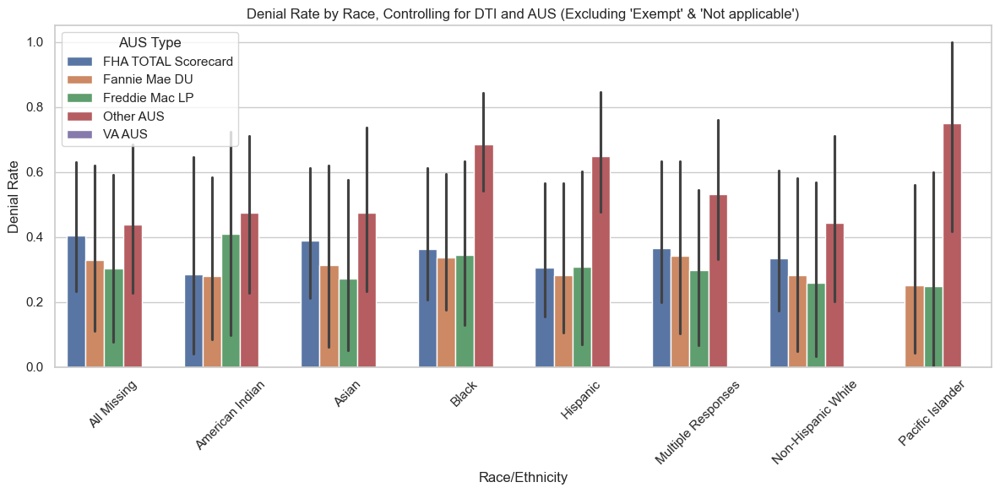

In [214]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filter: Remove missing values and exclude AUS types 'Exempt' and 'Not applicable'
df_filtered = df_cook_clean.dropna(subset=['ncrc_race_category', 'debt_to_income_ratio_cleaned', 'aus_1', 'denied'])
df_filtered = df_filtered[~df_filtered['aus_1'].isin(['Exempt', 'Not applicable'])]

# Group by race, DTI bin, and AUS type to calculate denial rate
approval_summary = (
    df_filtered
    .groupby(['ncrc_race_category', 'debt_to_income_ratio_cleaned', 'aus_1'])['denied']
    .mean()
    .reset_index(name='denial_rate')
)

# Visualize denial rates
plt.figure(figsize=(12, 6))
sns.barplot(
    data=approval_summary,
    x='ncrc_race_category',
    y='denial_rate',
    hue='aus_1'
)
plt.title("Denial Rate by Race, Controlling for DTI and AUS (Excluding 'Exempt' & 'Not applicable')")
plt.ylabel("Denial Rate")
plt.xlabel("Race/Ethnicity")
plt.xticks(rotation=45)
plt.legend(title="AUS Type")
plt.tight_layout()
plt.show()


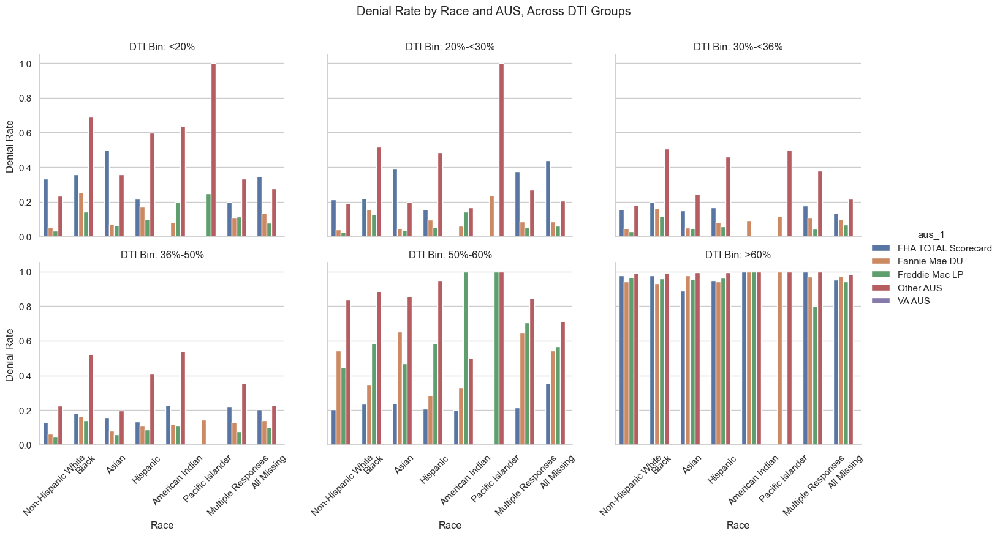

In [272]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.api.types import CategoricalDtype

# Define custom order for DTI bins
dti_order = [
    '<20%',
    '20%-<30%',
    '30%-<36%',
    '36%-50%',
    '50%-60%',
    '>60%'
]

# Set the DTI column to ordered categorical type
dti_dtype = CategoricalDtype(categories=dti_order, ordered=True)
approval_summary['debt_to_income_ratio_cleaned'] = approval_summary['debt_to_income_ratio_cleaned'].astype(dti_dtype)

# 1. Data filtering: exclude missing values and invalid AUS types
df_filtered = df_cook_clean.dropna(subset=[
    'ncrc_race_category', 'debt_to_income_ratio_cleaned', 'aus_1', 'denied'
])
df_filtered = df_filtered[~df_filtered['aus_1'].isin(['Exempt', 'Not applicable'])]

# 2. Group by race, AUS, and DTI to calculate denial rate
approval_summary = (
    df_filtered
    .groupby(['ncrc_race_category', 'aus_1', 'debt_to_income_ratio_cleaned'])['denied']
    .mean()
    .reset_index(name='denial_rate')
)

# 3. Create a faceted barplot with up to 3 plots per row (one for each DTI bin)
g = sns.catplot(
    data=approval_summary,
    x='ncrc_race_category',
    y='denial_rate',
    hue='aus_1',
    col='debt_to_income_ratio_cleaned',
    col_order=dti_order,              # 👈 Enforce DTI bin order
    kind='bar',
    col_wrap=3,
    height=4,
    aspect=1.2,
    order=race_order                  # Maintain consistent race color/position order
)

# 4. Add main title and set each subplot title
g.fig.subplots_adjust(top=0.88)
g.fig.suptitle("Denial Rate by Race and AUS, Across DTI Groups")
g.set_titles("DTI Bin: {col_name}")
g.set_axis_labels("Race", "Denial Rate")

# 5. Rotate x-axis labels for better readability
for ax in g.axes.flatten():
    ax.tick_params(axis='x', labelrotation=45)

# 6. Show the plot
plt.show()


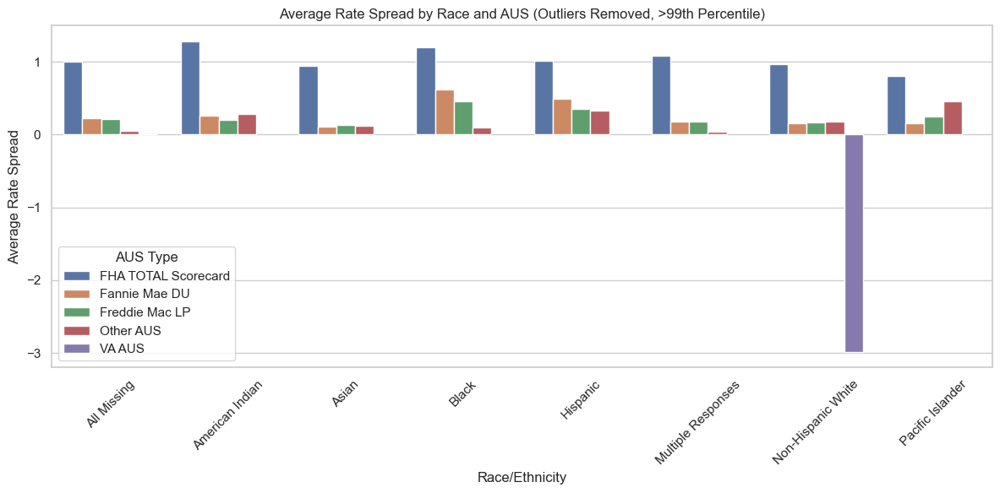

In [274]:
# 1. Filter out missing values and exclude invalid AUS entries
df_filtered = df_cook_clean.dropna(subset=['ncrc_race_category', 'debt_to_income_ratio_cleaned', 'aus_1', 'rate_spread'])
df_filtered = df_filtered[~df_filtered['aus_1'].isin(['Exempt', 'Not applicable'])]

# 2. Remove top 1% outliers in rate_spread
q99 = df_filtered['rate_spread'].quantile(0.99)
df_filtered = df_filtered[df_filtered['rate_spread'] <= q99]

# 3. Group by race and AUS to calculate the mean rate spread
rate_spread_summary = (
    df_filtered
    .groupby(['ncrc_race_category', 'aus_1'])['rate_spread']
    .mean()
    .reset_index(name='avg_rate_spread')
)

# 4. Visualization: You can add DTI filters here for deeper segmented analysis if needed
plt.figure(figsize=(12, 6))
sns.barplot(
    data=rate_spread_summary,
    x='ncrc_race_category',
    y='avg_rate_spread',
    hue='aus_1'
)
plt.title("Average Rate Spread by Race and AUS (Outliers Removed, >99th Percentile)")
plt.ylabel("Average Rate Spread")
plt.xlabel("Race/Ethnicity")
plt.xticks(rotation=45)
plt.legend(title="AUS Type")
plt.tight_layout()
plt.show()


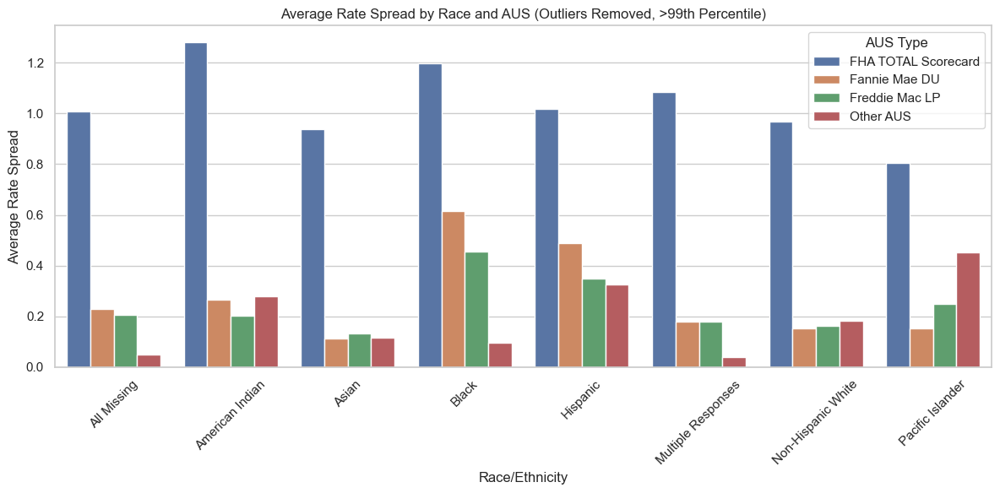

In [276]:


# 1. Filter out missing values and exclude invalid AUS types
df_filtered = df_cook_clean.dropna(subset=['ncrc_race_category', 'debt_to_income_ratio_cleaned', 'aus_1', 'rate_spread'])
df_filtered = df_filtered[~df_filtered['aus_1'].isin(['Exempt', 'Not applicable', 'VA AUS'])]

# 2. Remove top 1% outliers in rate_spread
q99 = df_filtered['rate_spread'].quantile(0.99)
df_filtered = df_filtered[df_filtered['rate_spread'] <= q99]

# 3. Group by race and AUS to calculate average rate spread
rate_spread_summary = (
    df_filtered
    .groupby(['ncrc_race_category', 'aus_1'])['rate_spread']
    .mean()
    .reset_index(name='avg_rate_spread')
)

# 4. Visualization: Further segmentation by DTI can be added if needed
plt.figure(figsize=(12, 6))
sns.barplot(
    data=rate_spread_summary,
    x='ncrc_race_category',
    y='avg_rate_spread',
    hue='aus_1'
)
plt.title("Average Rate Spread by Race and AUS (Outliers Removed, >99th Percentile)")
plt.ylabel("Average Rate Spread")
plt.xlabel("Race/Ethnicity")
plt.xticks(rotation=45)
plt.legend(title="AUS Type")
plt.tight_layout()
plt.show()


In [278]:
df_cook_clean.shape

(338083, 56)

## Lender

In [280]:
df_cook_clean.lei.value_counts()

lei
549300U3721PJGQZYY68    27603
7H6GLXDRUGQFU57RNE97    25053
KB1H1DSPRFMYMCUFXT09    20574
6BYL5QZYBDK8S7L73M02    14841
549300FGXN1K3HLB1R50    11952
549300AG64NHILB7ZP05     9271
549300VZVN841I2ILS84     7944
2WHM8VNJH63UN14OL754     7195
C398JSK21YCXWM603F55     6954
549300HW662MN1WU8550     6932
B4TYDEB6GKMZO031MB27     6379
549300LYRWPSYPK6S325     6283
549300FNXYY540N23N64     6135
QFROUN1UWUYU0DVIWD51     6003
5493001R92DY5DI1DI85     5332
549300J7XKT2BI5WX213     5222
549300MGPZBLQDIL7538     5091
549300LBCBNR1OT00651     4219
AD6GFRVSDT01YPT1CS68     4138
E57ODZWZ7FF32TWEFA76     4105
3Y4U8VZURTYWI1W2K376     4102
549300BRJZYHYKT4BJ84     3924
254900O723MCLR701H50     3572
KV8W1JTB8FZ821S5ED75     3464
549300KIOYNU323LVJ37     3391
549300SELI3XCH3UZW80     3354
549300AI4ZHB6MX23W09     3308
549300BX448ALT10FI43     3295
549300YIQ7S7Z8PIHE53     2940
ZF85QS7OXKPBG52R7N18     2501
RVDPPPGHCGZ40J4VQ731     2445
549300VJ7C5JB4W87F48     2219
54930001NSTOD85LT125     2133
SS1TRM

## Agent vs. Respondent Name
agency represents the regulatory level (macro perspective):
It indicates whether lenders under different regulators (e.g., HUD, FDIC, OCC) exhibit structural differences in behavior.

respondent_name refers to individual institutions (micro perspective):
Examples include Wells Fargo or Chase. The sample size for each may be smaller, and behavioral differences are likely more fragmented.

In [282]:
import pandas as pd

# Load panel file
panel_full = pd.read_csv(r"C:\Users\admin\Desktop\JHU\Spring 2\consulting project\2020_public_panel_csv.csv")

# Clean and normalize key fields
for col in ['lei', 'respondent_name', 'parent_name', 'topholder_name']:
    panel_full[col] = panel_full[col].astype(str).str.strip()

# Replace '-1', '', and 'nan' (as string) with pd.NA
for col in ['parent_name', 'topholder_name']:
    panel_full[col] = panel_full[col].replace(['-1', '', 'nan', 'NaN', 'None'], pd.NA)

# Fill missing parent/topholder with respondent_name
panel_full['parent_name'] = panel_full['parent_name'].fillna(panel_full['respondent_name'])
panel_full['topholder_name'] = panel_full['topholder_name'].fillna(panel_full['respondent_name'])

# Extract required columns
institution_df = panel_full[['lei', 'respondent_name', 'agency_code', 'respondent_state', 'parent_name', 'topholder_name']]

# Clean LEI in main data
df_cook_clean['lei'] = df_cook_clean['lei'].astype(str).str.strip()

# Merge into main dataset
df_cook_named = df_cook_clean.merge(institution_df, on='lei', how='left')

# Preview result
print(df_cook_named[['lei', 'respondent_name', 'agency_code', 'respondent_state', 'parent_name', 'topholder_name']].dropna().head())

                    lei          respondent_name  agency_code  \
0  549300LBCBNR1OT00651  NATIONSTAR MORTGAGE LLC            7   
1  549300LBCBNR1OT00651  NATIONSTAR MORTGAGE LLC            7   
2  549300LBCBNR1OT00651  NATIONSTAR MORTGAGE LLC            7   
3  549300LBCBNR1OT00651  NATIONSTAR MORTGAGE LLC            7   
4  549300LBCBNR1OT00651  NATIONSTAR MORTGAGE LLC            7   

  respondent_state              parent_name           topholder_name  
0               DE  NATIONSTAR MORTGAGE LLC  NATIONSTAR MORTGAGE LLC  
1               DE  NATIONSTAR MORTGAGE LLC  NATIONSTAR MORTGAGE LLC  
2               DE  NATIONSTAR MORTGAGE LLC  NATIONSTAR MORTGAGE LLC  
3               DE  NATIONSTAR MORTGAGE LLC  NATIONSTAR MORTGAGE LLC  
4               DE  NATIONSTAR MORTGAGE LLC  NATIONSTAR MORTGAGE LLC  


In [284]:
df_cook_named.agency_code.value_counts()

agency_code
7    179818
9    112525
1     20406
3     13579
5      8457
2      3298
Name: count, dtype: int64

In [285]:
# Define mapping from agency_code to readable labels
agency_map = {
    1: 'OCC (National Banks)',
    2: 'FRB (Fed Member Banks)',
    3: 'FDIC (Non-member State Banks)',
    5: 'NCUA (Credit Unions)',
    7: 'HUD (Non-bank Mortgage Lenders)',
    9: 'CFPB (Large Non-bank Financial Companies)'
}

# Map readable labels to the dataset
df_cook_named['agency_label'] = df_cook_named['agency_code'].map(agency_map)

# Filter out rows with missing rate_spread or action_taken values
df_filtered = df_cook_named.dropna(subset=['action_taken', 'agency_label']).copy() #'rate_spread', 

# Define which action_taken values count as loan approvals
approved_actions = ['Loan originated']

# Create binary column for approval (1 = approved, 0 = not approved)
df_filtered.loc[:, 'approved'] = df_filtered['action_taken'].isin(approved_actions)




def calc_approval_rate(g):
    return (g["action_taken"] == 'Loan originated').sum() / len(g)

agency_summary = (
    df_filtered.groupby('agency_label')
    .apply(lambda g: pd.Series({
        'avg_rate_spread': g['rate_spread'].mean(),
        'approval_rate': calc_approval_rate(g),
        'num_loans': g['lei'].count()
    }))
    .sort_values(by='num_loans', ascending=False)
)

# Format approval rate as percentage string and round rate spread
agency_summary['approval_rate'] = agency_summary['approval_rate'].apply(lambda x: f"{x:.1%}")
agency_summary['avg_rate_spread'] = agency_summary['avg_rate_spread'].round(2)

agency_summary.head(100)

,avg_rate_spread,approval_rate,num_loans
agency_label,,,
HUD (Non-bank Mortgage Lenders),0.33,61.4%,179818.0
CFPB (Large Non-bank Financial Companies),0.24,41.7%,112525.0
OCC (National Banks),0.33,63.8%,20406.0
FDIC (Non-member State Banks),0.19,66.5%,13579.0
NCUA (Credit Unions),0.47,61.0%,8457.0
FRB (Fed Member Banks),0.24,67.1%,3298.0


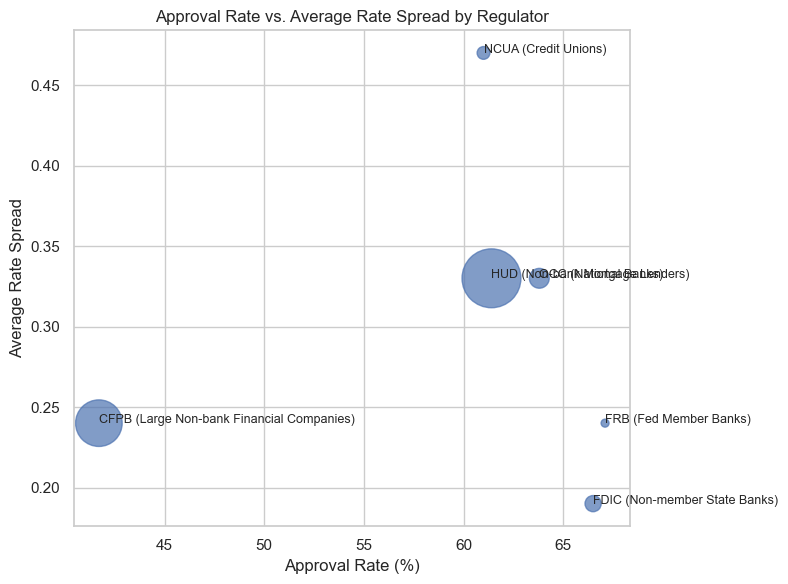

In [286]:
import matplotlib.pyplot as plt

# Step 1: Convert approval_rate back to numeric (from percentage string)
agency_summary['approval_rate_num'] = agency_summary['approval_rate'].str.rstrip('%').astype(float)

# Step 2: Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(agency_summary['approval_rate_num'], agency_summary['avg_rate_spread'], s=agency_summary['num_loans'] / 100, alpha=0.7)

# Add annotations for each agency
for i, label in enumerate(agency_summary.index):
    plt.annotate(label, (agency_summary['approval_rate_num'].iloc[i], agency_summary['avg_rate_spread'].iloc[i]), fontsize=9)

# Add labels and title
plt.xlabel("Approval Rate (%)")
plt.ylabel("Average Rate Spread")
plt.title("Approval Rate vs. Average Rate Spread by Regulator")
plt.grid(True)
plt.tight_layout()
plt.show()

### "Non-bank lenders regulated by HUD dominate the market and approve loans at high rates, but they also tend to charge higher rate spreads than banks regulated by the Fed or FDIC, which offer lower-cost loans but may serve fewer borrowers."

### View the performance of the top N lenders under each regulatory agency.

In [289]:
import pandas as pd

TOP_N = 5

# Step 1: Filter and copy to avoid SettingWithCopyWarning
df_filtered = df_cook_named.dropna(subset=[ 'action_taken', 'agency_label', 'respondent_name']).copy() # 'rate_spread',

# Step 2: Flag approvals
df_filtered['is_approved'] = df_filtered['action_taken'] == 'Loan originated'

# Step 3: Group by agency and respondent
grouped = (
    df_filtered.groupby(['agency_label', 'respondent_name'])
    .agg(
        avg_rate_spread=('rate_spread', 'mean'),
        approval_rate=('is_approved', 'mean'),
        num_loans=('lei', 'count')
    )
    .reset_index()
)

# Step 4: Get top N lenders per agency
top_lenders_within_agency = (
    grouped.sort_values(['agency_label', 'num_loans'], ascending=[True, False])
    .groupby('agency_label')
    .head(TOP_N)
)

# Step 5: Format output
top_lenders_within_agency['avg_rate_spread'] = top_lenders_within_agency['avg_rate_spread'].round(2)
top_lenders_within_agency['approval_rate'] = top_lenders_within_agency['approval_rate'].apply(lambda x: f"{x:.1%}")

# Display
top_lenders_within_agency.head(10000)

,agency_label,respondent_name,avg_rate_spread,approval_rate,num_loans
35,CFPB (Large Non-bank Financial Companies),"JPMorgan Chase Bank, National Association",0.11,55.3%,25053
70,CFPB (Large Non-bank Financial Companies),"Wells Fargo Bank, National Association",0.20,20.6%,20574
66,CFPB (Large Non-bank Financial Companies),U.S. Bank National Association,0.32,28.1%,14841
62,CFPB (Large Non-bank Financial Companies),The Huntington National Bank,0.18,73.4%,7195
7,CFPB (Large Non-bank Financial Companies),"Bank of America, National Association",0.16,51.7%,6379
126,FDIC (Non-member State Banks),First American Bank,0.27,55.3%,2092
163,FDIC (Non-member State Banks),INLAND BANK & TRUST,0.08,81.4%,1256
151,FDIC (Non-member State Banks),Gold Coast Bank,NaN,93.0%,631
199,FDIC (Non-member State Banks),Northpointe Bank,0.04,39.0%,629
190,FDIC (Non-member State Banks),Midwest Community Bank,0.09,55.9%,535


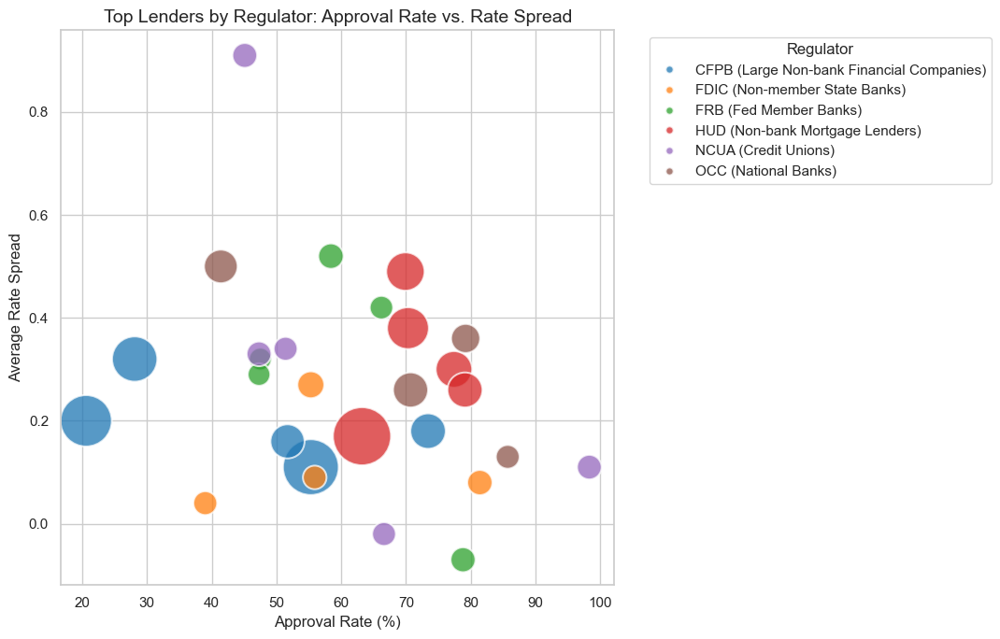

In [290]:
import matplotlib.pyplot as plt
import seaborn as sns

# Convert approval rate to numeric
top_lenders_within_agency['approval_rate_num'] = top_lenders_within_agency['approval_rate'].str.rstrip('%').astype(float)

# Create the figure
plt.figure(figsize=(11, 7))
sns.set(style="whitegrid")

# Draw scatter plot with stronger colors and larger bubbles
scatter = sns.scatterplot(
    data=top_lenders_within_agency,
    x='approval_rate_num',
    y='avg_rate_spread',
    hue='agency_label',
    size='num_loans',
    sizes=(300, 2000),  # larger bubbles
    palette='tab10',
    alpha=0.75,
    legend='brief'
)

# Remove bubble size legend (keep only hue legend)
handles, labels = scatter.get_legend_handles_labels()
hue_labels = top_lenders_within_agency['agency_label'].unique().tolist()
hue_handles = handles[1:len(hue_labels)+1]  # skip "size" legend
hue_texts = labels[1:len(hue_labels)+1]
scatter.legend(hue_handles, hue_texts, title="Regulator", bbox_to_anchor=(1.05, 1), loc='upper left')

# Axis and title formatting
plt.xlabel("Approval Rate (%)")
plt.ylabel("Average Rate Spread")
plt.title("Top Lenders by Regulator: Approval Rate vs. Rate Spread", fontsize=14)
plt.tight_layout()
plt.show()

In [291]:
# Ensure required columns are present and not missing, then make a copy
df_filtered = df_cook_named.dropna(subset=['action_taken', 'agency_label', 'ncrc_race_category']).copy() # 'rate_spread',

# Define which actions are considered loan approvals
approved_actions = ['Loan originated']

# Create a binary column indicating whether the loan was approved
df_filtered['is_approved'] = df_filtered['action_taken'].isin(approved_actions)

# Group by both agency type and applicant race to calculate:
# - average rate spread
# - approval rate (percentage of approved applications)
# - total number of loans in each group
agency_race_summary = (
    df_filtered.groupby(['agency_label', 'ncrc_race_category'])
    .agg(
        avg_rate_spread=('rate_spread', 'mean'),
        approval_rate=('is_approved', 'mean'),
        num_loans=('lei', 'count')
    )
    .reset_index()
)

# Format the output for readability
agency_race_summary['approval_rate'] = agency_race_summary['approval_rate'].apply(lambda x: f"{x:.1%}")
agency_race_summary['avg_rate_spread'] = agency_race_summary['avg_rate_spread'].round(2)

# Display the first few rows of the result
agency_race_summary.head(10000)

,agency_label,ncrc_race_category,avg_rate_spread,approval_rate,num_loans
0,CFPB (Large Non-bank Financial Companies),All Missing,0.17,20.4%,25955
1,CFPB (Large Non-bank Financial Companies),American Indian,0.43,41.8%,170
2,CFPB (Large Non-bank Financial Companies),Asian,0.13,51.8%,9370
3,CFPB (Large Non-bank Financial Companies),Black,0.55,35.4%,8035
4,CFPB (Large Non-bank Financial Companies),Hispanic,0.46,39.2%,12819
5,CFPB (Large Non-bank Financial Companies),Multiple Responses,0.20,45.0%,1221
6,CFPB (Large Non-bank Financial Companies),Non-Hispanic White,0.20,51.6%,54855
7,CFPB (Large Non-bank Financial Companies),Pacific Islander,0.24,41.0%,100
8,FDIC (Non-member State Banks),All Missing,0.07,61.6%,2302
9,FDIC (Non-member State Banks),American Indian,1.01,80.0%,15


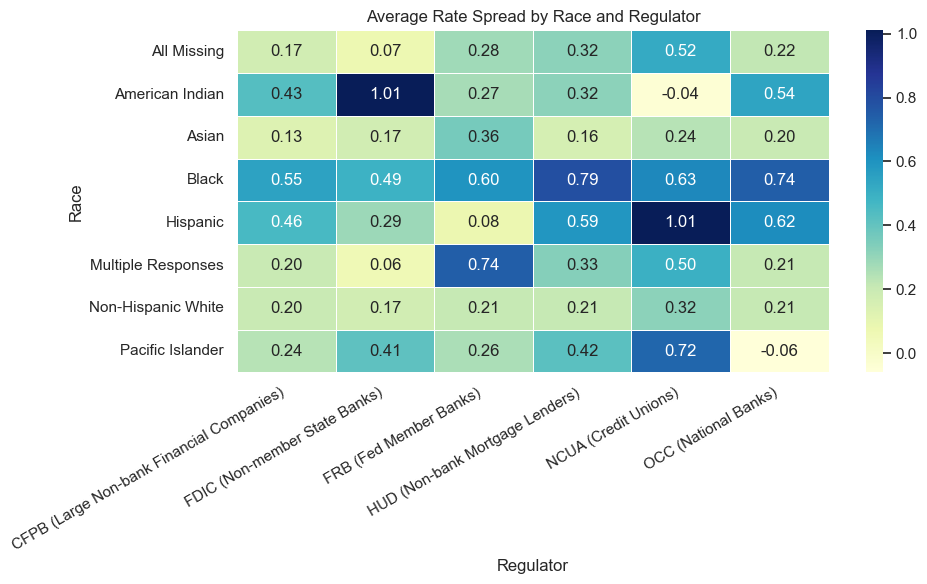

In [292]:
import matplotlib.pyplot as plt
import seaborn as sns

# === Step 1: Prepare Rate Spread Data ===
# Drop rows with missing rate_spread, agency_label, or race
df_rs = df_cook_named.dropna(subset=['rate_spread', 'agency_label', 'ncrc_race_category'])

# Group by race and agency, calculate mean rate spread, and pivot to wide format
rate_spread_data = (
    df_rs.groupby(['ncrc_race_category', 'agency_label'])['rate_spread']
    .mean()
    .reset_index()
    .round(2)
    .pivot(index='ncrc_race_category', columns='agency_label', values='rate_spread')
)

# === Step 2: Prepare Approval Rate Data ===
# Drop rows with missing values and define approval status
df_appr = df_cook_named.dropna(subset=['action_taken', 'agency_label', 'ncrc_race_category']).copy()
df_appr['is_approved'] = df_appr['action_taken'] == 'Loan originated'

# Group by race and agency, calculate approval rate, and pivot
approval_data = (
    df_appr.groupby(['ncrc_race_category', 'agency_label'])['is_approved']
    .mean()
    .reset_index()
    .pivot(index='ncrc_race_category', columns='agency_label', values='is_approved')
)

# === Step 3a: Plot Rate Spread Heatmap ===
plt.figure(figsize=(10, 6))
sns.heatmap(rate_spread_data, annot=True, fmt=".2f", cmap="YlGnBu", linewidths=0.5)
plt.title("Average Rate Spread by Race and Regulator")
plt.xlabel("Regulator")
plt.ylabel("Race")
plt.xticks(rotation=30, ha='right')  # Rotate x labels to prevent overlap
plt.tight_layout()
# plt.savefig("rate_spread_heatmap.png", dpi=300)
plt.show()


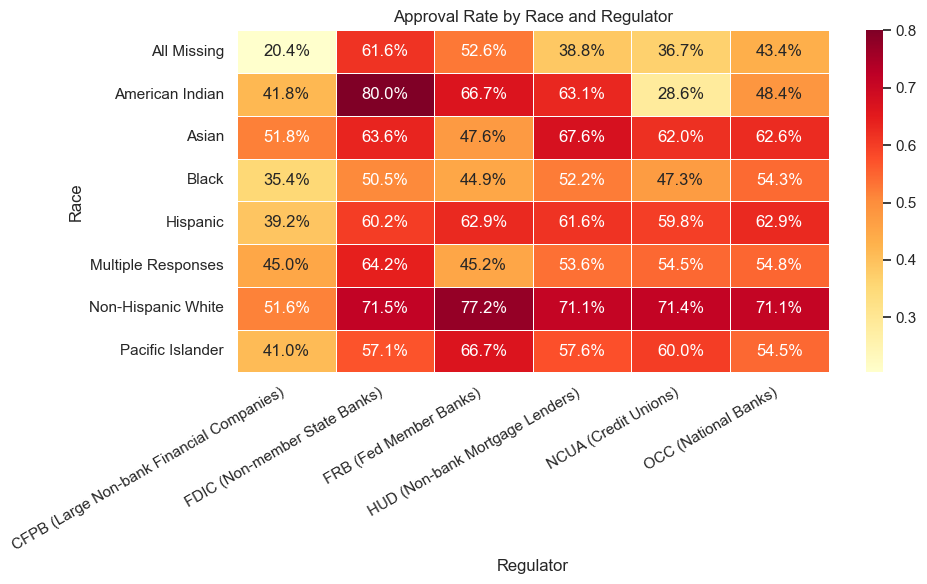

In [293]:
# === Step 3b: Plot Approval Rate Heatmap ===
plt.figure(figsize=(10, 6))
sns.heatmap(approval_data, annot=True, fmt=".1%", cmap="YlOrRd", linewidths=0.5)
plt.title("Approval Rate by Race and Regulator")
plt.xlabel("Regulator")
plt.ylabel("Race")
plt.xticks(rotation=30, ha='right')  # Avoid label overlap
plt.tight_layout()
# plt.savefig("approval_rate_heatmap.png", dpi=300)
plt.show()

###  Step 1: Quantify Bias (Standard Deviation across races within agency)

In [295]:
# Group by race and agency, compute mean rate_spread and approval rate
grouped = df_cook_named.dropna(subset=['rate_spread', 'action_taken', 'agency_label', 'ncrc_race_category']).copy()

# Safely create new column
grouped['is_approved'] = grouped['action_taken'] == 'Loan originated'

# Rate Spread bias per agency
rate_spread_std = (
    grouped.groupby(['agency_label', 'ncrc_race_category'])['rate_spread']
    .mean()
    .groupby('agency_label')
    .std()
    .reset_index(name='rate_spread_std')
)

# Approval rate bias per agency
approval_rate_std = (
    grouped.groupby(['agency_label', 'ncrc_race_category'])['is_approved']
    .mean()
    .groupby('agency_label')
    .std()
    .reset_index(name='approval_rate_std')
)

# Merge into one summary
bias_summary = rate_spread_std.merge(approval_rate_std, on='agency_label')
print(bias_summary.sort_values('rate_spread_std', ascending=False))

                                agency_label  rate_spread_std  \
4                       NCUA (Credit Unions)         0.320353   
1              FDIC (Non-member State Banks)         0.311269   
5                       OCC (National Banks)         0.269419   
2                     FRB (Fed Member Banks)         0.216965   
3            HUD (Non-bank Mortgage Lenders)         0.206510   
0  CFPB (Large Non-bank Financial Companies)         0.157555   

   approval_rate_std  
4           0.057636  
1           0.014388  
5           0.034311  
2           0.023393  
3           0.008524  
0           0.013021  


####　1: Standard Deviation of Rate Spread by Agency (Barplot)


C:\Users\admin\AppData\Local\Temp\ipykernel_10344\89069720.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




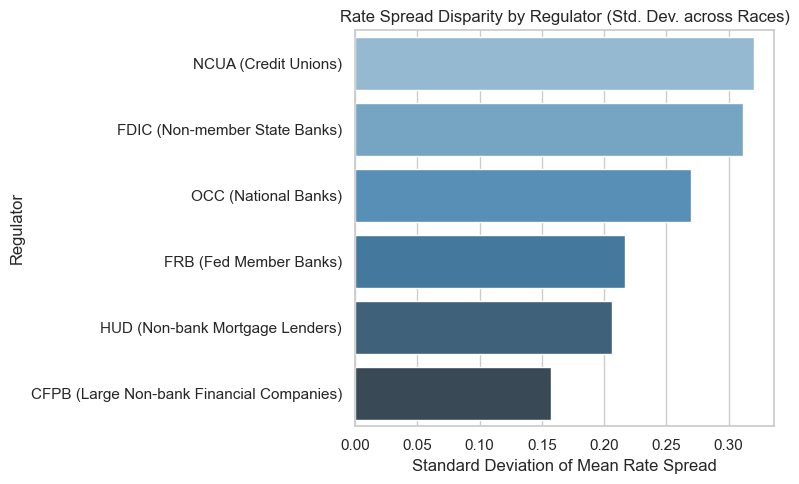

In [297]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot standard deviation of rate spread by agency
plt.figure(figsize=(8, 5))
sns.barplot(data=rate_spread_std.sort_values('rate_spread_std', ascending=False),
            x='rate_spread_std', y='agency_label', palette='Blues_d')

plt.title('Rate Spread Disparity by Regulator (Std. Dev. across Races)')
plt.xlabel('Standard Deviation of Mean Rate Spread')
plt.ylabel('Regulator')
plt.tight_layout()
plt.show()


###  Step 2: Identify Top 5 Institutions per Agency with Largest Race Gap in Rate Spread

In [299]:
# Calculate race-level average rate_spread per respondent
rate_gap_df = (
    grouped.groupby(['agency_label', 'respondent_name', 'topholder_name', 'ncrc_race_category'])['rate_spread']
    .mean()
    .reset_index()
)

# Pivot to compare across races
rate_gap_pivot = rate_gap_df.pivot_table(index=['agency_label', 'respondent_name', 'topholder_name'],
                                         columns='ncrc_race_category',
                                         values='rate_spread')

# Example: max range between racial groups
rate_gap_pivot['rate_spread_gap'] = rate_gap_pivot.max(axis=1) - rate_gap_pivot.min(axis=1)

# Top 5 biased lenders by agency
top_rate_spread_bias = (
    rate_gap_pivot
    .reset_index()
    .sort_values(['agency_label', 'rate_spread_gap'], ascending=[True, False])
    .groupby('agency_label')
    .head(5)
)

print(top_rate_spread_bias[['agency_label', 'respondent_name', 'topholder_name', 'rate_spread_gap']])


ncrc_race_category                               agency_label  \
18                  CFPB (Large Non-bank Financial Companies)   
27                  CFPB (Large Non-bank Financial Companies)   
14                  CFPB (Large Non-bank Financial Companies)   
49                  CFPB (Large Non-bank Financial Companies)   
10                  CFPB (Large Non-bank Financial Companies)   
80                              FDIC (Non-member State Banks)   
91                              FDIC (Non-member State Banks)   
76                              FDIC (Non-member State Banks)   
112                             FDIC (Non-member State Banks)   
99                              FDIC (Non-member State Banks)   
164                                    FRB (Fed Member Banks)   
170                                    FRB (Fed Member Banks)   
159                                    FRB (Fed Member Banks)   
171                                    FRB (Fed Member Banks)   
183                      

####　2: Standard Deviation of Approval Rate by Agency (Barplot)

C:\Users\admin\AppData\Local\Temp\ipykernel_10344\282832885.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




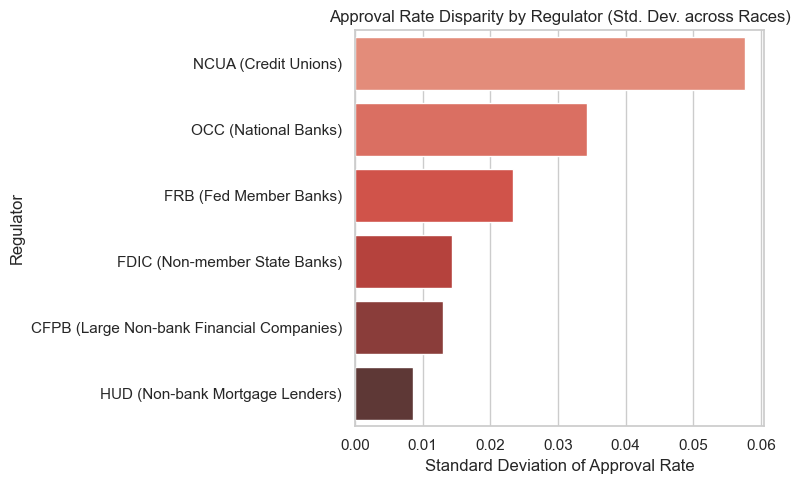

In [301]:
# Plot standard deviation of approval rate by agency
plt.figure(figsize=(8, 5))
sns.barplot(data=approval_rate_std.sort_values('approval_rate_std', ascending=False),
            x='approval_rate_std', y='agency_label', palette='Reds_d')

plt.title('Approval Rate Disparity by Regulator (Std. Dev. across Races)')
plt.xlabel('Standard Deviation of Approval Rate')
plt.ylabel('Regulator')
plt.tight_layout()
plt.show()


### Step 3: Identify Top 5 Institutions per Agency with Largest Approval Rate Gap

In [303]:
# Approval rate per group
approval_gap_df = (
    grouped.groupby(['agency_label', 'respondent_name', 'topholder_name', 'ncrc_race_category'])['is_approved']
    .mean()
    .reset_index()
)

# Pivot
approval_pivot = approval_gap_df.pivot_table(index=['agency_label', 'respondent_name', 'topholder_name'],
                                             columns='ncrc_race_category',
                                             values='is_approved')

# Range of approval rates
approval_pivot['approval_rate_gap'] = approval_pivot.max(axis=1) - approval_pivot.min(axis=1)

# Top 5 biased lenders by approval
top_approval_bias = (
    approval_pivot
    .reset_index()
    .sort_values(['agency_label', 'approval_rate_gap'], ascending=[True, False])
    .groupby('agency_label')
    .head(5)
)

print(top_approval_bias[['agency_label', 'respondent_name', 'topholder_name', 'approval_rate_gap']])


ncrc_race_category                               agency_label  \
45                  CFPB (Large Non-bank Financial Companies)   
47                  CFPB (Large Non-bank Financial Companies)   
55                  CFPB (Large Non-bank Financial Companies)   
52                  CFPB (Large Non-bank Financial Companies)   
54                  CFPB (Large Non-bank Financial Companies)   
136                             FDIC (Non-member State Banks)   
151                             FDIC (Non-member State Banks)   
134                             FDIC (Non-member State Banks)   
152                             FDIC (Non-member State Banks)   
80                              FDIC (Non-member State Banks)   
172                                    FRB (Fed Member Banks)   
163                                    FRB (Fed Member Banks)   
169                                    FRB (Fed Member Banks)   
175                                    FRB (Fed Member Banks)   
171                      

#### 3: Combined Summary Heatmap (Optional)

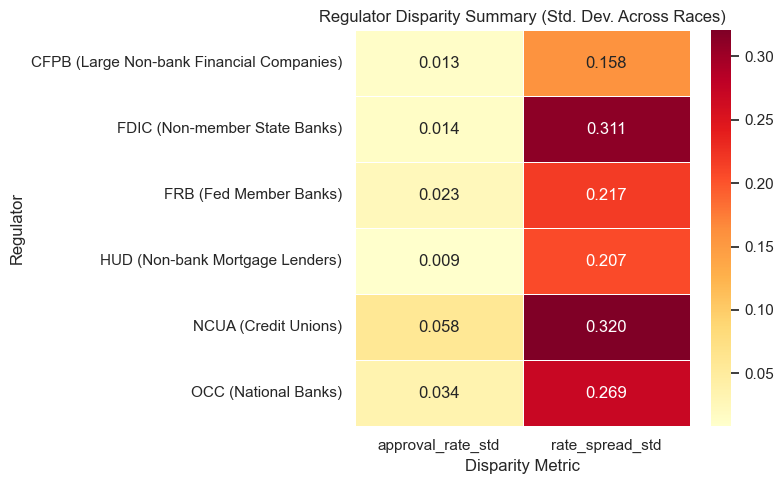

In [305]:
# Convert to long format for heatmap
bias_melted = bias_summary.melt(id_vars='agency_label', 
                                value_vars=['rate_spread_std', 'approval_rate_std'],
                                var_name='Metric', value_name='Std. Dev.')

# Heatmap for compact comparison
pivoted = bias_melted.pivot(index='agency_label', columns='Metric', values='Std. Dev.')

plt.figure(figsize=(8, 5))
sns.heatmap(pivoted, annot=True, fmt=".3f", cmap="YlOrRd", linewidths=0.5)
plt.title("Regulator Disparity Summary (Std. Dev. Across Races)")
plt.xlabel("Disparity Metric")
plt.ylabel("Regulator")
plt.tight_layout()
plt.show()


# Application denied reasons

In [307]:
# Only focus on denied cases
df_denied = df_cook_named[df_cook_named['action_taken'] == "Application denied"].copy()

# Exclude "Not applicable" and "Exempt"
excluded_reasons = ["Not applicable", "Exempt"]
df_denied = df_denied[~df_denied['denial_reason_1'].isin(excluded_reasons)]

# === Group by Race ===
race_reason = (
    df_denied.groupby(['ncrc_race_category', 'denial_reason_1'])
    .size()
    .reset_index(name='count')
)
race_reason['percent'] = race_reason.groupby('ncrc_race_category')['count'].transform(lambda x: x / x.sum())
race_reason['percent'] = (race_reason['percent'] * 100).round(1)

# Top 5 reasons by race
top_race_reasons = race_reason.sort_values(['ncrc_race_category', 'count'], ascending=[True, False])
top_race_reasons = top_race_reasons.groupby('ncrc_race_category').head(5)

# === Group by Agency ===
agency_reason = (
    df_denied.groupby(['agency_label', 'denial_reason_1'])
    .size()
    .reset_index(name='count')
)
agency_reason['percent'] = agency_reason.groupby('agency_label')['count'].transform(lambda x: x / x.sum())
agency_reason['percent'] = (agency_reason['percent'] * 100).round(1)

# Top 5 reasons by agency
top_agency_reasons = agency_reason.sort_values(['agency_label', 'count'], ascending=[True, False])
top_agency_reasons = top_agency_reasons.groupby('agency_label').head(5)

# Display
print("📊 Top 5 Denial Reasons by Race:")
display(top_race_reasons)

print("\n📊 Top 5 Denial Reasons by Agency:")
display(top_agency_reasons)

📊 Top 5 Denial Reasons by Race:


,ncrc_race_category,denial_reason_1,count,percent
3,All Missing,Debt-to-income ratio,1468,27.6
0,All Missing,Application incomplete,969,18.2
1,All Missing,Collateral,963,18.1
2,All Missing,Credit history,846,15.9
7,All Missing,Other,571,10.7
11,American Indian,Credit history,37,34.9
10,American Indian,Collateral,18,17.0
12,American Indian,Debt-to-income ratio,16,15.1
9,American Indian,Application incomplete,13,12.3
15,American Indian,Other,12,11.3



📊 Top 5 Denial Reasons by Agency:


,agency_label,denial_reason_1,count,percent
3,CFPB (Large Non-bank Financial Companies),Debt-to-income ratio,4953,29.4
2,CFPB (Large Non-bank Financial Companies),Credit history,4411,26.2
1,CFPB (Large Non-bank Financial Companies),Collateral,3310,19.6
6,CFPB (Large Non-bank Financial Companies),Other,1531,9.1
0,CFPB (Large Non-bank Financial Companies),Application incomplete,1432,8.5
11,FDIC (Non-member State Banks),Debt-to-income ratio,424,43.2
10,FDIC (Non-member State Banks),Credit history,234,23.9
9,FDIC (Non-member State Banks),Collateral,141,14.4
15,FDIC (Non-member State Banks),Other,69,7.0
8,FDIC (Non-member State Banks),Application incomplete,44,4.5


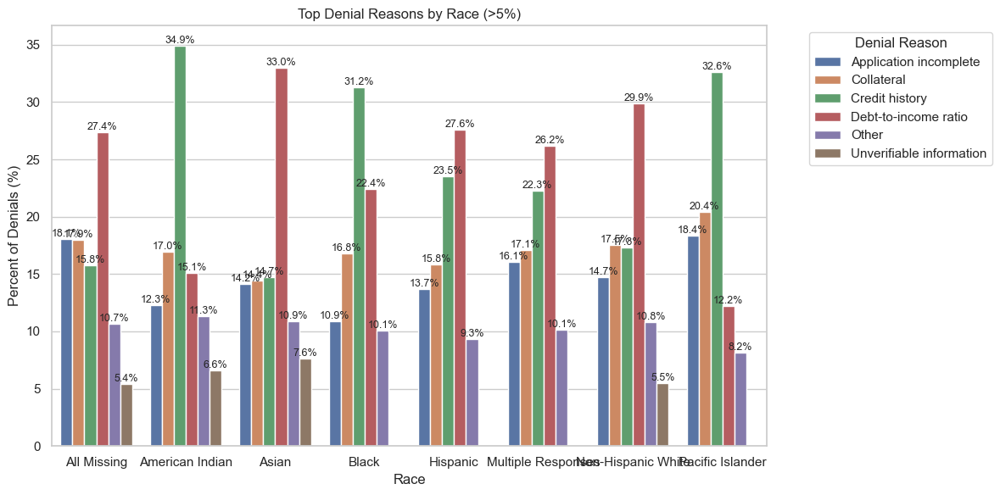

In [308]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Filter denied applications
df_denied = df_cook_named[df_cook_named['action_taken'] == 'Application denied'].copy()

# Step 2: Count denial reasons per race
race_reason_counts = df_denied.groupby(['ncrc_race_category', 'denial_reason_1']).size().rename('count').reset_index()

# Step 3: Calculate percentage within each race
total_by_race = race_reason_counts.groupby('ncrc_race_category')['count'].transform('sum')
race_reason_counts['percent'] = (race_reason_counts['count'] / total_by_race * 100).round(2)

# Step 4: Filter to only major reasons
race_reason_top = race_reason_counts[race_reason_counts['percent'] > 5]

# Step 5: Plot
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    data=race_reason_top,
    x='ncrc_race_category',
    y='percent',
    hue='denial_reason_1',
    dodge=True
)

# Step 6: Add value labels
for bar in ax.containers:
    ax.bar_label(bar, fmt='%.1f%%', label_type='edge', fontsize=9)

# Final touches
plt.title("Top Denial Reasons by Race (>5%)")
plt.ylabel("Percent of Denials (%)")
plt.xlabel("Race")
plt.legend(title="Denial Reason", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

C:\Users\admin\AppData\Local\Temp\ipykernel_10344\172825139.py:37: UserWarning:

FixedFormatter should only be used together with FixedLocator



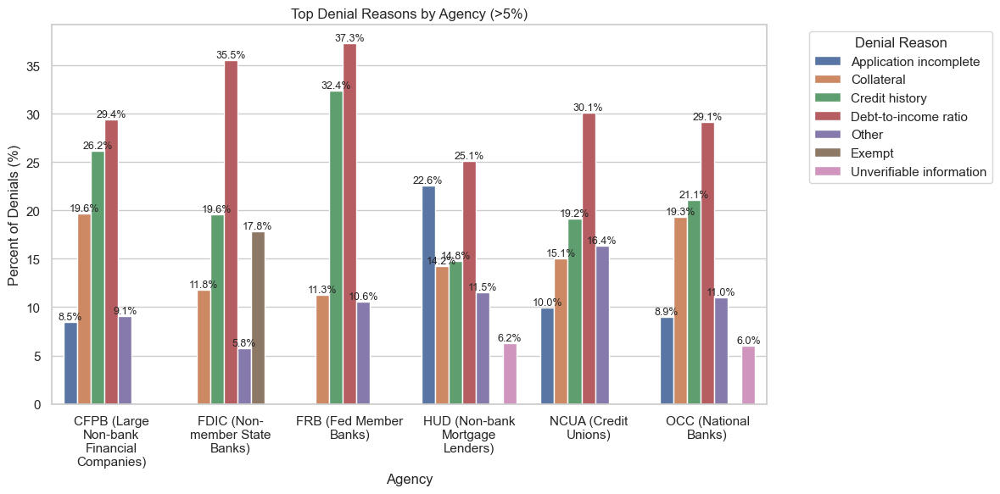

In [309]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Filter denied applications
df_denied = df_cook_named[df_cook_named['action_taken'] == 'Application denied'].copy()

# Step 2: Count denial reasons per agency
agency_reason_counts = df_denied.groupby(['agency_label', 'denial_reason_1']).size().rename('count').reset_index()

# Step 3: Calculate percentage within each agency
total_by_agency = agency_reason_counts.groupby('agency_label')['count'].transform('sum')
agency_reason_counts['percent'] = (agency_reason_counts['count'] / total_by_agency * 100).round(2)

# Step 4: Filter to only major reasons
agency_reason_top = agency_reason_counts[agency_reason_counts['percent'] > 5]


import textwrap

# After plotting
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    data=agency_reason_top,
    x='agency_label',
    y='percent',
    hue='denial_reason_1',
    dodge=True
)

# Step 6: Add value labels
for bar in ax.containers:
    ax.bar_label(bar, fmt='%.1f%%', label_type='edge', fontsize=9)

# Wrap x-axis labels
labels = [textwrap.fill(label.get_text(), width=15) for label in ax.get_xticklabels()]
ax.set_xticklabels(labels)

# Final touches
plt.title("Top Denial Reasons by Agency (>5%)")
plt.ylabel("Percent of Denials (%)")
plt.xlabel("Agency")
plt.legend(title="Denial Reason", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

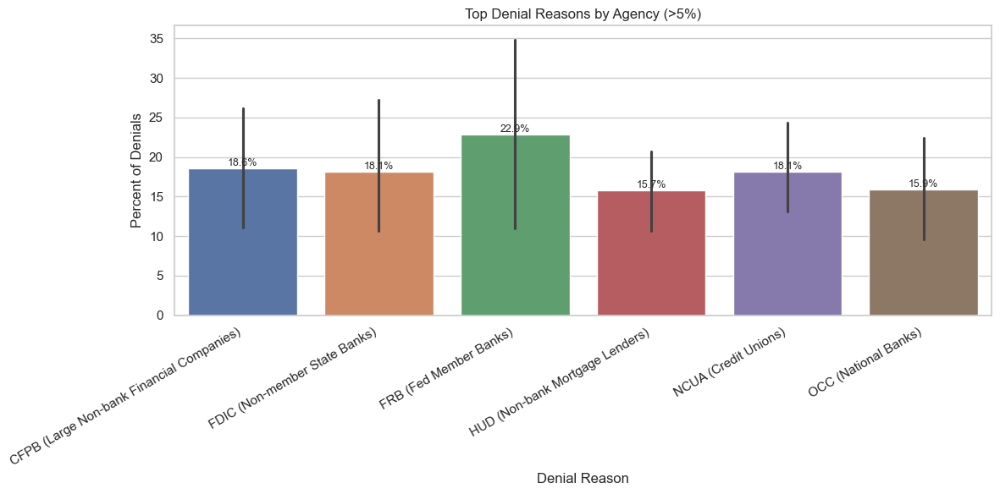

In [310]:
# === Calculate percentage breakdown of denial reasons by agency ===
agency_reason_series = (
    df_denied.groupby(['agency_label', 'denial_reason_1'])
    .size()
    .groupby(level=0)
    .apply(lambda x: 100 * x / x.sum())
)

# === Convert to DataFrame, rename columns to avoid index issues ===
agency_reason_pct = pd.DataFrame({
    'agency_label': agency_reason_series.index.get_level_values(0),
    'denial_reason_1': agency_reason_series.index.get_level_values(1),
    'percent': agency_reason_series.values
})

# === Keep only reasons that account for more than 5% ===
top_agency_reasons = agency_reason_pct[agency_reason_pct['percent'] > 5]

plt.figure(figsize=(12, 6))
ax = sns.barplot(data=top_agency_reasons, x='denial_reason_1', y='percent', hue='agency_label')

# Add percentage labels to bars
for bar in ax.containers:
    ax.bar_label(bar, fmt='%.1f%%', label_type='edge', fontsize=9)

plt.title("Top Denial Reasons by Agency (>5%)")
plt.xticks(rotation=30, ha='right')
plt.ylabel("Percent of Denials")
plt.xlabel("Denial Reason")

# ✅ Force legend to appear even if there's only one agency
handles, labels = ax.get_legend_handles_labels()
if handles:
    plt.legend(handles=handles, labels=labels, title="Agency", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


In [311]:
# Create top denial reason table by race and agency
df_denied = df_cook_named[df_cook_named['action_taken'] == 'Application denied']

top_denial_matrix = (
    df_denied.groupby(['agency_label', 'ncrc_race_category', 'denial_reason_1'])
    .size()
    .reset_index(name='count')
)

top_denial_reason_by_group = (
    top_denial_matrix.sort_values(['agency_label', 'ncrc_race_category', 'count'], ascending=[True, True, False])
    .groupby(['agency_label', 'ncrc_race_category'])
    .first()
    .reset_index()
    .pivot(index='ncrc_race_category', columns='agency_label', values='denial_reason_1')
)


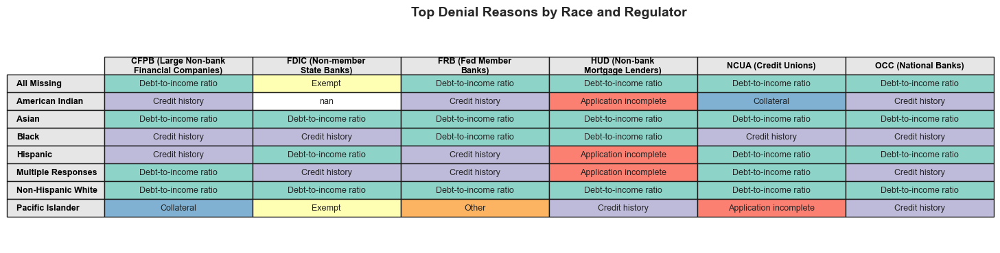

In [312]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import rgb2hex
import textwrap

# === Wrap agency names to break into lines ===
wrapped_columns = [textwrap.fill(col, width=20) for col in top_denial_reason_by_group.columns]

# === Prepare color map ===
unique_reasons = top_denial_reason_by_group.stack().unique()
palette = sns.color_palette("Set3", len(unique_reasons))
color_map = {reason: rgb2hex(color) for reason, color in zip(unique_reasons, palette)}

# === Prepare cell content and colors ===
cell_text, cell_colors = [], []
for race in top_denial_reason_by_group.index:
    row_text, row_colors = [], []
    for agency in top_denial_reason_by_group.columns:
        reason = top_denial_reason_by_group.loc[race, agency]
        wrapped_reason = textwrap.fill(str(reason), width=30)
        row_text.append(wrapped_reason)
        row_colors.append(color_map.get(reason, "#ffffff"))
    cell_text.append(row_text)
    cell_colors.append(row_colors)

# === Plot ===
fig, ax = plt.subplots(figsize=(12, 4))  # Shrink figure size
ax.axis('off')

table = ax.table(
    cellText=cell_text,
    rowLabels=top_denial_reason_by_group.index,
    colLabels=wrapped_columns,
    cellColours=cell_colors,
    cellLoc='center',
    colLoc='center',
    loc='center'
)

# === Adjust style ===
table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1.2, 1.5)  # Adjusted scale to reduce whitespace

# Highlight headers
for (row, col), cell in table.get_celld().items():
    if row == 0 or col == -1:
        cell.set_text_props(weight='bold', color='black')
        cell.set_facecolor('#e6e6e6')

plt.title("Top Denial Reasons by Race and Regulator", fontsize=14, weight='bold', pad=12)
plt.subplots_adjust(top=0.85, bottom=0.05, left=0.05, right=0.95)  # Remove padding
plt.show()

## lender clustering

In [314]:
# Step 0: Create a copy to preserve original data
df_cook_fill_rate_spread = df_cook_named.copy()

# Step 1: Define group keys
group_keys = ['action_taken', 'respondent_name', 'debt_to_income_ratio', 'ncrc_race_category']

# Step 2: Compute group means and fill
group_means = (
    df_cook_fill_rate_spread
    .groupby(group_keys)['rate_spread']
    .transform(lambda x: x.fillna(x.mean()))
)

# Step 3: Fill NaNs with group mean, then fallback to global mean
df_cook_fill_rate_spread['rate_spread'] = df_cook_fill_rate_spread['rate_spread'].fillna(group_means)
df_cook_fill_rate_spread['rate_spread'] = df_cook_fill_rate_spread['rate_spread'].fillna(df_cook_fill_rate_spread['rate_spread'].mean())

# Step 4: Groupby lender and compute metrics
lender_df = (
    df_cook_fill_rate_spread.dropna(subset=['rate_spread','action_taken', 'respondent_name'])
    .assign(is_approved=lambda d: d['action_taken'] == 'Loan originated')
    .groupby('respondent_name')
    .agg(
        avg_rate_spread=('rate_spread', 'mean'),
        approval_rate=('is_approved', 'mean'),
        num_loans=('lei', 'count')
    )
    .reset_index()
)

# Step 5: Filter out lenders with only 1 record
lender_df = lender_df[lender_df['num_loans'] > 3]

In [315]:
# k-mean
from sklearn.preprocessing import StandardScaler

features = ['avg_rate_spread', 'approval_rate', 'num_loans']
X = lender_df[features]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [316]:
import os
os.environ["OMP_NUM_THREADS"] = "3"

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler



In [317]:

# Step 2: 执行 KMeans 聚类
kmeans = KMeans(n_clusters=3, random_state=42)
lender_df['cluster'] = kmeans.fit_predict(X_scaled)

C:\Users\admin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.



In [339]:
# 定义解释性标签（根据上面聚类特征平均值结果）
cluster_labels = {
    0: "High Approval, Low Spread",
    1: "Low Approval, High Spread",
    2: "High Approval, High Spread"
}

# 添加到数据中
lender_df['cluster_label'] = lender_df['cluster'].map(cluster_labels)


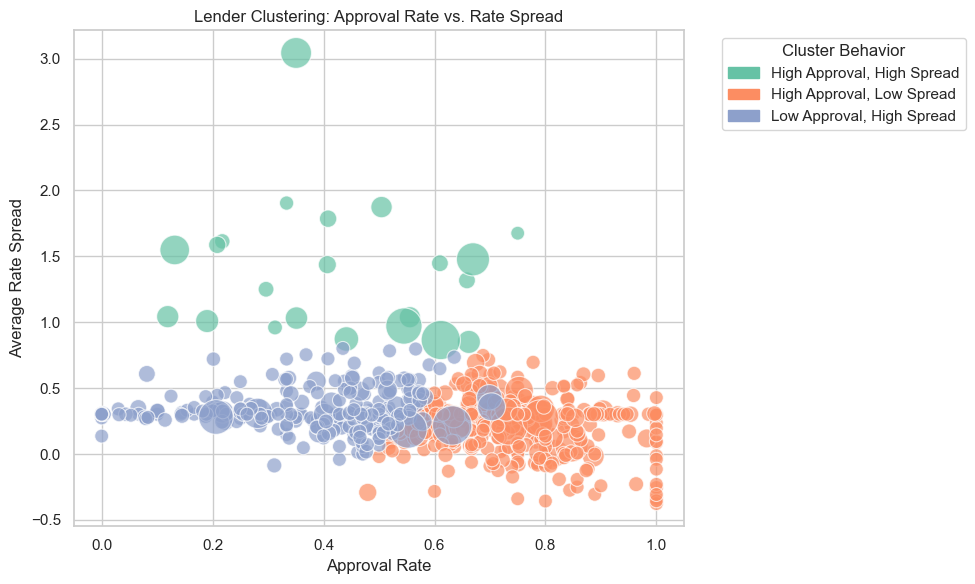

In [341]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch

plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")

# ✅ 设置你希望的绘图顺序，确保 'Low Approval, High Spread' 在最后
cluster_order = ['High Approval, High Spread', 'High Approval, Low Spread', 'Low Approval, High Spread']
palette = sns.color_palette('Set2', n_colors=len(cluster_order))

# ✅ 一类一类绘图（最关键的控制方式）
for i, label in enumerate(cluster_order):
    subset = lender_df[lender_df['cluster_label'] == label]
    sns.scatterplot(
        data=subset,
        x='approval_rate',
        y='avg_rate_spread',
        size='num_loans',
        sizes=(100, 800),
        alpha=0.7,
        color=palette[i],
        label=label,
        legend=False  # 我们会手动生成 legend
    )

# ✅ 自定义 legend（只保留颜色）
handles = [Patch(color=palette[i], label=label) for i, label in enumerate(cluster_order)]
plt.legend(handles=handles, title="Cluster Behavior", bbox_to_anchor=(1.05, 1), loc='upper left')

# 图表美化
plt.title("Lender Clustering: Approval Rate vs. Rate Spread")
plt.xlabel("Approval Rate")
plt.ylabel("Average Rate Spread")
plt.tight_layout()
plt.show()

### the top in three clusterings

In [346]:
# Top 5 lenders per cluster by number of loans
top_lenders_by_cluster = (
    lender_df.groupby('cluster_label')
    .apply(lambda g: g.sort_values(by='num_loans', ascending=False).head(5))
    .reset_index(drop=True)
)

# Select and format display fields
top_lenders_table = top_lenders_by_cluster[[
    'cluster_label', 'respondent_name', 'num_loans', 'approval_rate', 'avg_rate_spread'
]].copy()

top_lenders_table['approval_rate'] = (top_lenders_table['approval_rate'] * 100).round(1).astype(str) + '%'
top_lenders_table['avg_rate_spread'] = top_lenders_table['avg_rate_spread'].round(2)

# Display as a DataFrame
top_lenders_table

,cluster_label,respondent_name,num_loans,approval_rate,avg_rate_spread
0,"High Approval, High Spread","OCMBC, INC.",548,61.1%,0.87
1,"High Approval, High Spread","LAND HOME FINANCIAL SERVICES, INC.",457,54.5%,0.97
2,"High Approval, High Spread",Self-Help Federal Credit Union,369,66.9%,1.48
3,"High Approval, High Spread",Figure Lending LLC,311,35.0%,3.04
4,"High Approval, High Spread","TRIAD FINANCIAL SERVICES, INC.",281,13.2%,1.55
5,"High Approval, Low Spread","CROSSCOUNTRY MORTGAGE, LLC",7944,77.4%,0.30
6,"High Approval, Low Spread",The Huntington National Bank,7195,73.4%,0.21
7,"High Approval, Low Spread","Barrington Bank & Trust Company, N.A.",6954,70.7%,0.27
8,"High Approval, Low Spread","UNITED WHOLESALE MORTGAGE, LLC",6932,79.1%,0.27
9,"High Approval, Low Spread",DRAPER AND KRAMER MORTGAGE CORP.,5332,84.7%,0.07


In [347]:
df_cook_named.action_taken.value_counts()

action_taken
Loan originated                                  186838
Application withdrawn by applicant                49439
Purchased loan                                    42190
Application denied                                37192
File closed for incompleteness                    15844
Application approved but not accepted              6491
Preapproval request approved but not accepted        60
Preapproval request denied                           29
Name: count, dtype: int64

In [348]:
df_cook_named.denial_reason_1.value_counts()

denial_reason_1
Not applicable               297689
Debt-to-income ratio          10378
Credit history                 7712
Collateral                     6273
Application incomplete         5311
Other                          3857
Exempt                         3430
Unverifiable information       1919
Insufficient cash               862
Employment history              641
Mortgage insurance denied        11
Name: count, dtype: int64

# tract_median_age_of_housing_units

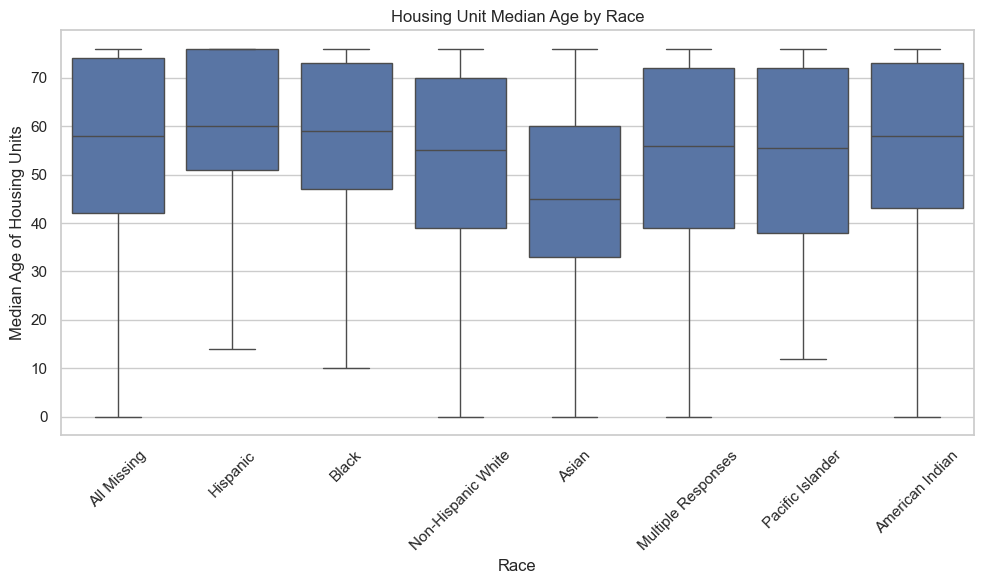

In [350]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_cook_named, x='ncrc_race_category', y='tract_median_age_of_housing_units', showfliers=False)
plt.title("Housing Unit Median Age by Race")
plt.xlabel("Race")
plt.ylabel("Median Age of Housing Units")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

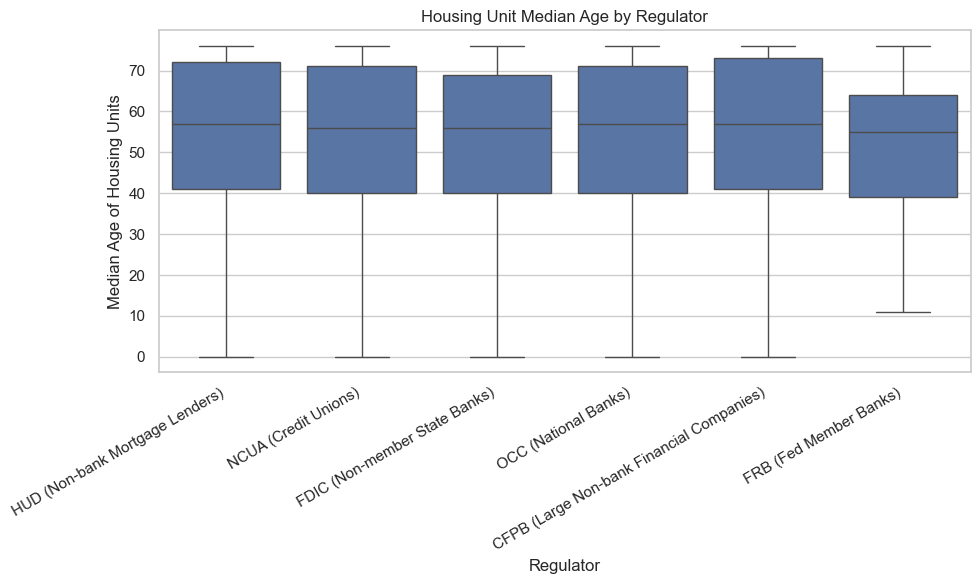

In [351]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_cook_named, x='agency_label', y='tract_median_age_of_housing_units', showfliers=False)
plt.title("Housing Unit Median Age by Regulator")
plt.xlabel("Regulator")
plt.ylabel("Median Age of Housing Units")
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()

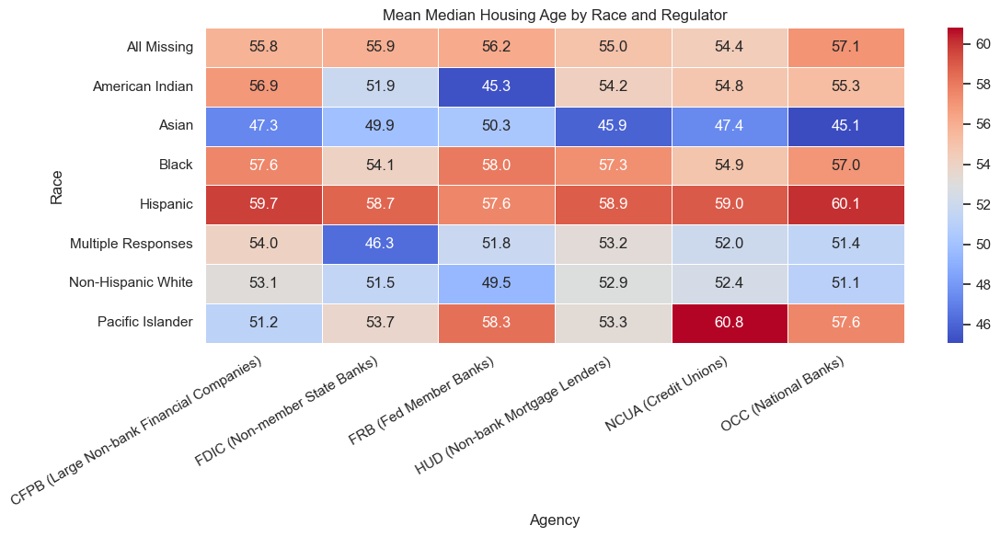

In [352]:
heat_data = df_cook_named.groupby(['ncrc_race_category', 'agency_label'])['tract_median_age_of_housing_units'].mean().round(1).unstack()

plt.figure(figsize=(12, 6))
sns.heatmap(heat_data, annot=True, fmt=".1f", cmap="coolwarm", linewidths=0.5)
plt.title("Mean Median Housing Age by Race and Regulator")
plt.xlabel("Agency")
plt.ylabel("Race")
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()


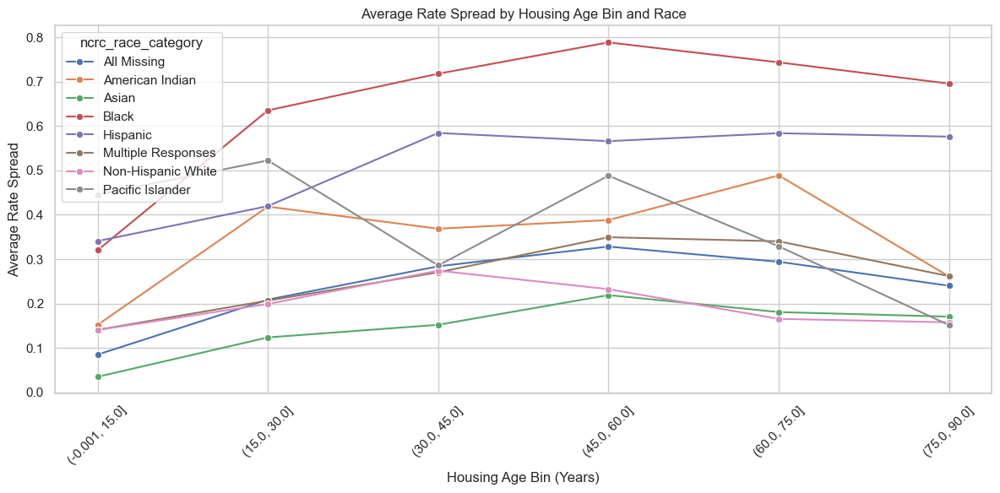

In [353]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Step 1: Bin housing ages into 15-year intervals
df_binned = df_cook_named.copy()
df_binned['housing_age_bin'] = pd.cut(
    df_binned['tract_median_age_of_housing_units'],
    bins=range(0, 105, 15),
    include_lowest=True
)

# Convert bin to string for plotting
df_binned['housing_age_bin'] = df_binned['housing_age_bin'].astype(str)

# Step 2: Group by bin and race, then compute mean rate_spread
avg_spread_by_bin_race = (
    df_binned.dropna(subset=['rate_spread', 'housing_age_bin', 'ncrc_race_category'])
    .groupby(['housing_age_bin', 'ncrc_race_category'])['rate_spread']
    .mean()
    .reset_index()
)

# Optional: Sort bins naturally by extracting numeric lower bound
avg_spread_by_bin_race['bin_order'] = avg_spread_by_bin_race['housing_age_bin'].str.extract(r'(\d+)').astype(int)
avg_spread_by_bin_race = avg_spread_by_bin_race.sort_values(by='bin_order')

# Step 3: Plot
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=avg_spread_by_bin_race,
    x='housing_age_bin',
    y='rate_spread',
    hue='ncrc_race_category',
    marker='o'
)

plt.title("Average Rate Spread by Housing Age Bin and Race")
plt.xlabel("Housing Age Bin (Years)")
plt.ylabel("Average Rate Spread")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


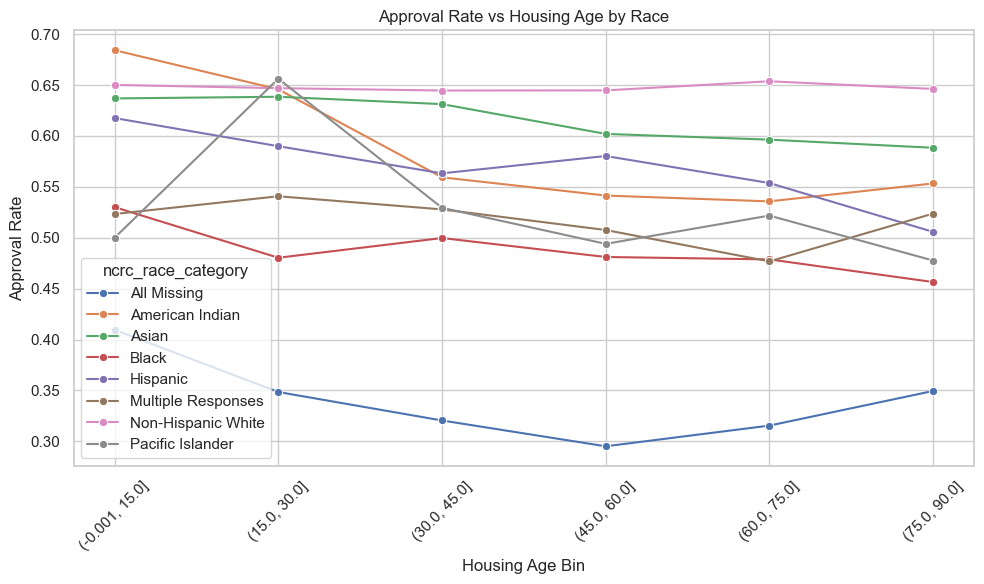

# origination_charges

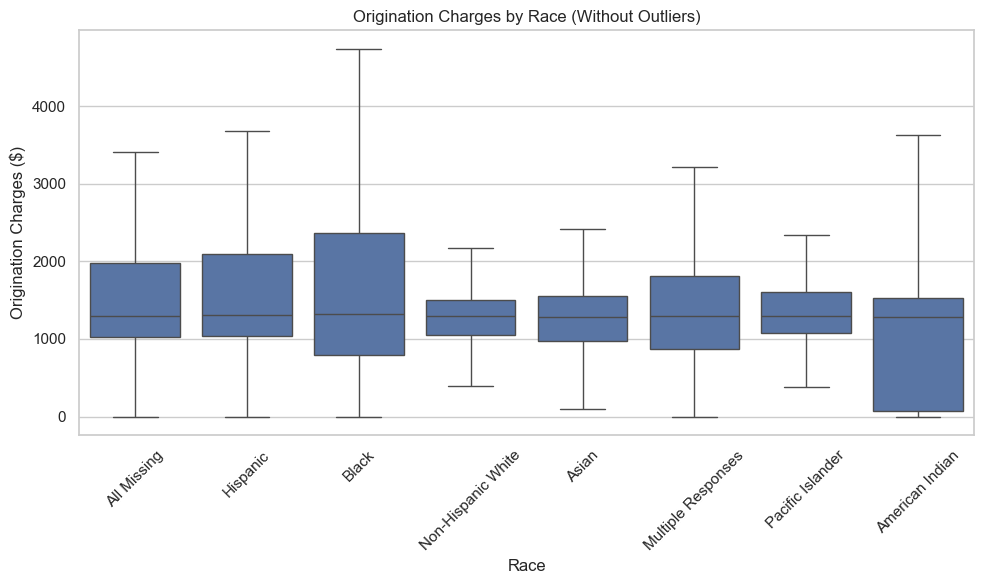

In [356]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.boxplot(data=df_cook_named, x='ncrc_race_category', y='origination_charges', showfliers=False)
plt.title("Origination Charges by Race (Without Outliers)")
plt.ylabel("Origination Charges ($)")
plt.xlabel("Race")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

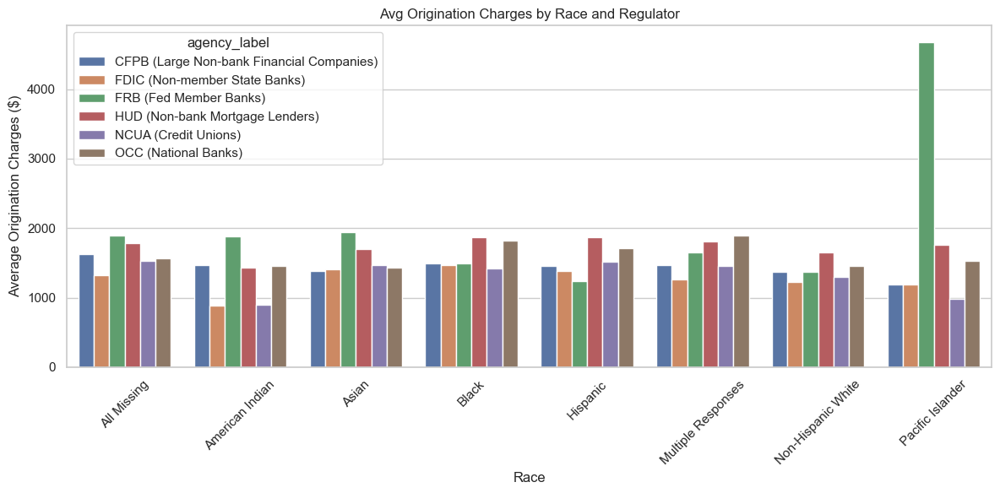

In [357]:
avg_by_race_agency = (
    df_cook_named.dropna(subset=['origination_charges', 'ncrc_race_category', 'agency_label'])
    .groupby(['ncrc_race_category', 'agency_label'])['origination_charges']
    .mean()
    .reset_index()
)

plt.figure(figsize=(12, 6))
sns.barplot(data=avg_by_race_agency, x='ncrc_race_category', y='origination_charges', hue='agency_label')
plt.title("Avg Origination Charges by Race and Regulator")
plt.ylabel("Average Origination Charges ($)")
plt.xlabel("Race")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

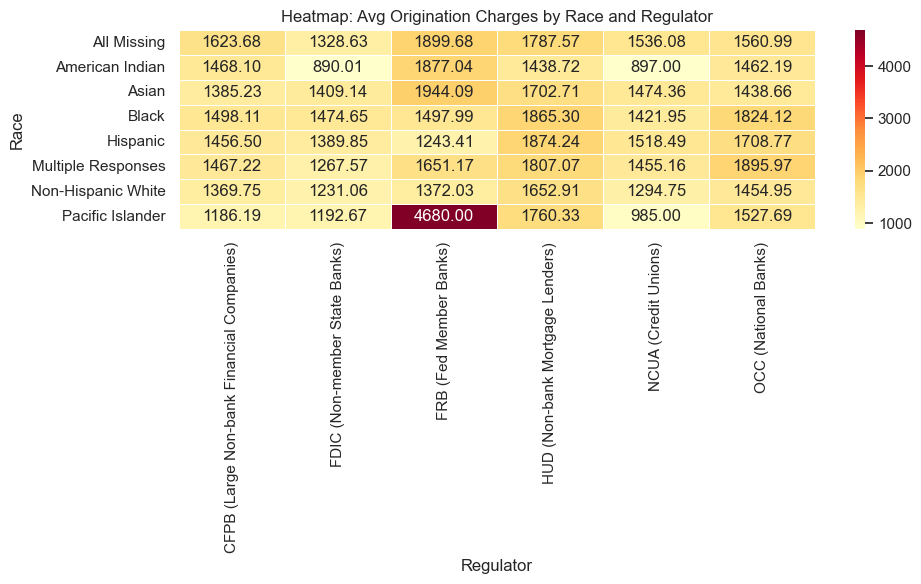

In [358]:
pivot = avg_by_race_agency.pivot(index='ncrc_race_category', columns='agency_label', values='origination_charges')

plt.figure(figsize=(10, 6))
sns.heatmap(pivot, annot=True, fmt=".2f", cmap="YlOrRd", linewidths=0.5)
plt.title("Heatmap: Avg Origination Charges by Race and Regulator")
plt.xlabel("Regulator")
plt.ylabel("Race")
plt.tight_layout()
plt.show()


C:\Users\admin\AppData\Local\Temp\ipykernel_10344\1847209247.py:36: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.



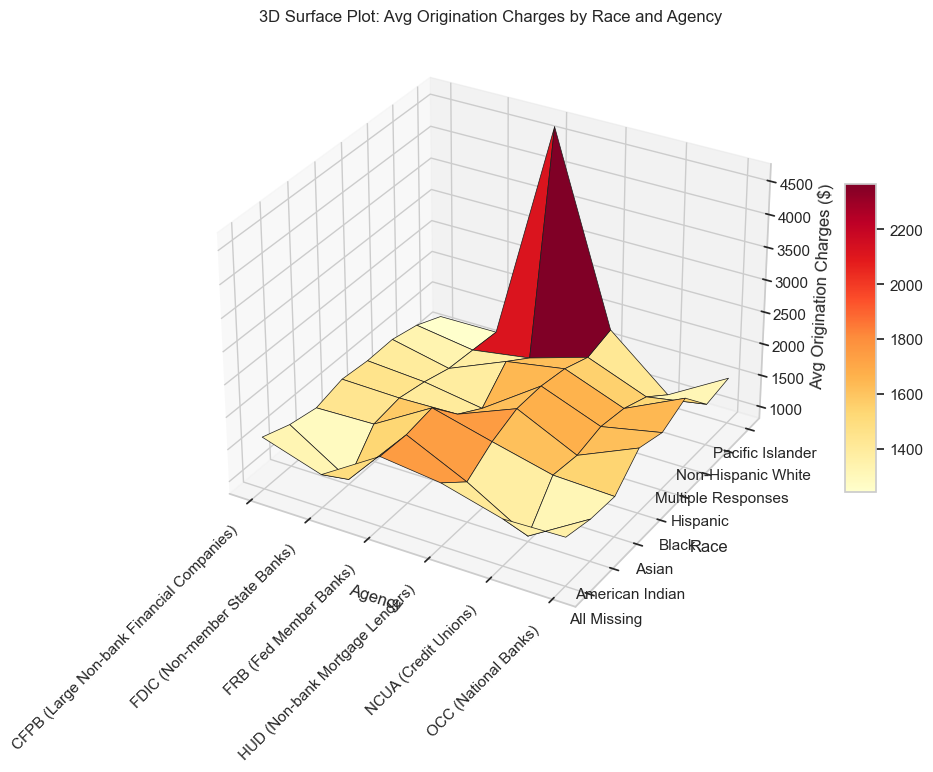

In [359]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Pivot the data
pivot = avg_by_race_agency.pivot(index='ncrc_race_category', columns='agency_label', values='origination_charges')

# Get race and agency as axis labels
races = list(pivot.index)
agencies = list(pivot.columns)

# Convert to numeric index
x = np.arange(len(agencies))
y = np.arange(len(races))
X, Y = np.meshgrid(x, y)
Z = pivot.to_numpy()

# Create 3D surface plot
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

surf = ax.plot_surface(X, Y, Z, cmap='YlOrRd', edgecolor='k', linewidth=0.5, antialiased=True)

# Set axis labels and ticks
ax.set_xticks(x)
ax.set_xticklabels(agencies, rotation=45, ha='right')
ax.set_yticks(y)
ax.set_yticklabels(races)
ax.set_xlabel('Agency')
ax.set_ylabel('Race')
ax.set_zlabel('Avg Origination Charges ($)')
ax.set_title('3D Surface Plot: Avg Origination Charges by Race and Agency')

# Add color bar
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10)
plt.tight_layout()
plt.show()


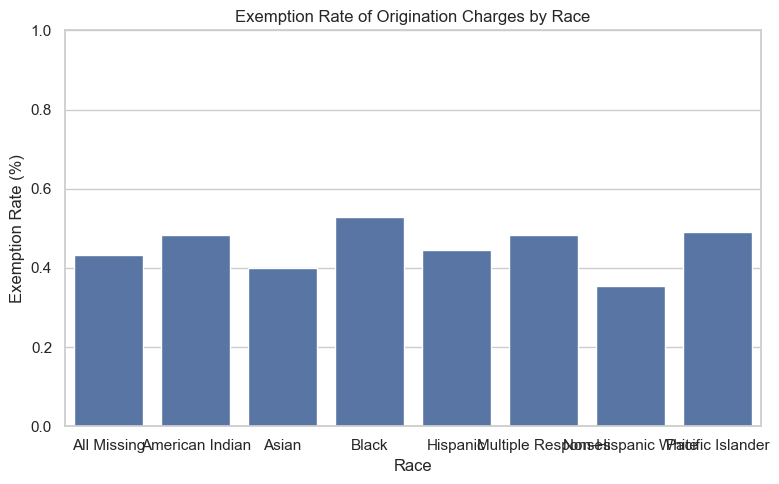

In [360]:
df_explore = df_cook_named.copy()

df_explore['origination_exempt_flag'] = df_explore['origination_charges'].isna().astype(int)

exempt_rate = (
    df_explore.groupby('ncrc_race_category')['origination_exempt_flag']
    .mean()
    .reset_index(name='exempt_rate')
)

plt.figure(figsize=(8, 5))
sns.barplot(data=exempt_rate, x='ncrc_race_category', y='exempt_rate')
plt.title("Exemption Rate of Origination Charges by Race")
plt.ylabel("Exemption Rate (%)")
plt.xlabel("Race")
plt.ylim(0, 1)
plt.tight_layout()
plt.show()


# combined_loan_to_value_ratio

### 1. CLTV Distribution by Race and Regulator (Boxplot)

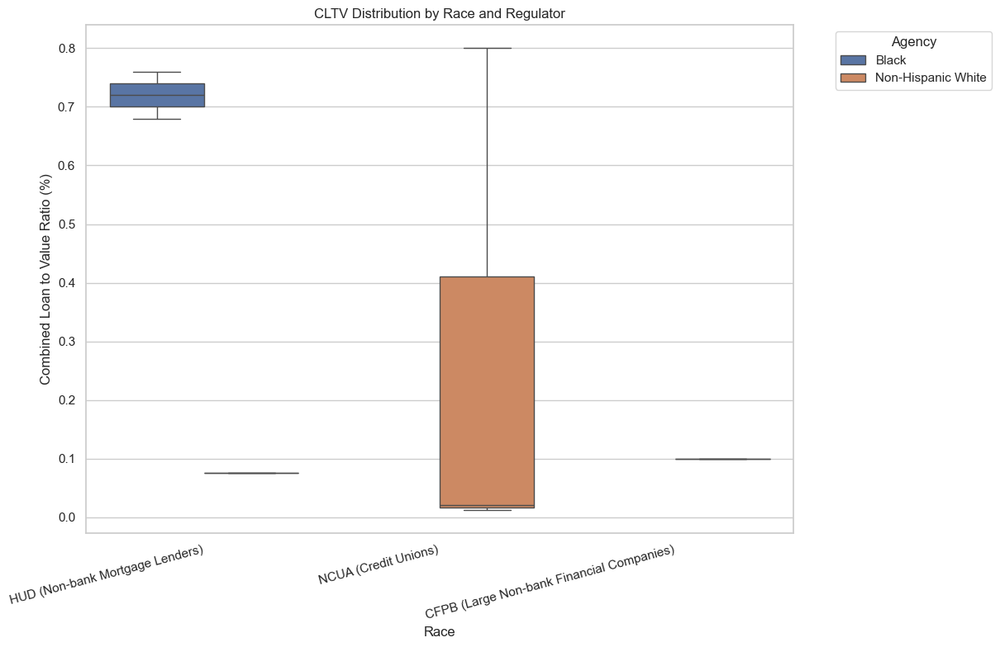

In [363]:
import seaborn as sns
import matplotlib.pyplot as plt

# Drop rows where CLTV ratio is greater than 1 (i.e., > 100%)
filtered_df1 = df_cook_named[df_cook_named['combined_loan_to_value_ratio'] <= 1]

# Create the boxplot
plt.figure(figsize=(12, 8))
sns.boxplot(data=filtered_df1, x='agency_label', y='combined_loan_to_value_ratio', hue='ncrc_race_category')
plt.title("CLTV Distribution by Race and Regulator")
plt.xlabel("Race")
plt.xticks(rotation=15, ha='right')  # Avoid label overlap
plt.tight_layout()
plt.ylabel("Combined Loan to Value Ratio (%)")
plt.legend(title="Agency", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### 2. Heatmap of Average CLTV by Race and Agency

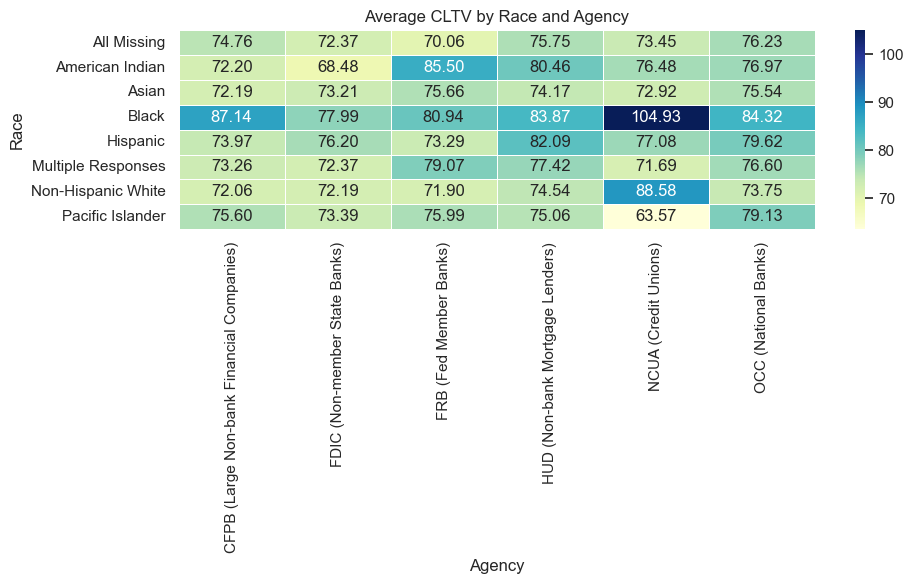

In [365]:
pivot_cltv = (
    df_cook_named.groupby(['ncrc_race_category', 'agency_label'])['combined_loan_to_value_ratio']
    .mean()
    .round(2)
    .unstack()
)

plt.figure(figsize=(10, 6))
sns.heatmap(pivot_cltv, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=0.5)
plt.title("Average CLTV by Race and Agency")
plt.xlabel("Agency")
plt.ylabel("Race")
plt.tight_layout()
plt.show()

### 3. Relationship Between CLTV and Approval Rate (by Race)

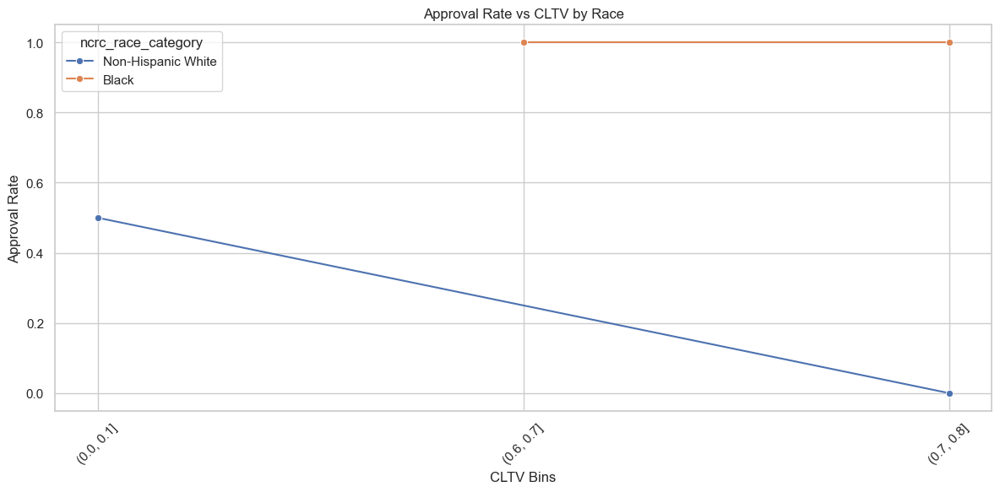

In [367]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Flag approvals
df_cook_named['is_approved'] = df_cook_named['action_taken'] == 'Loan originated'

# Create CLTV bins (0–1 in 0.1 steps)
cltv_bins = pd.cut(df_cook_named['combined_loan_to_value_ratio'], bins=np.arange(0, 1.01, 0.1))

# Group and calculate approval rate
approval_cltv = (
    df_cook_named.groupby([cltv_bins, 'ncrc_race_category'], observed=True)['is_approved']
    .mean()
    .reset_index()
    .rename(columns={'combined_loan_to_value_ratio': 'CLTV_bin', 'is_approved': 'approval_rate'})
)

# Convert bin intervals to strings for Seaborn compatibility
approval_cltv['CLTV_bin'] = approval_cltv['CLTV_bin'].astype(str)

# Plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=approval_cltv, x='CLTV_bin', y='approval_rate', hue='ncrc_race_category', marker="o")
plt.title("Approval Rate vs CLTV by Race")
plt.xlabel("CLTV Bins")
plt.ylabel("Approval Rate")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



### 4. Mediation-Like View: Agency × Race → CLTV → Rate Spread

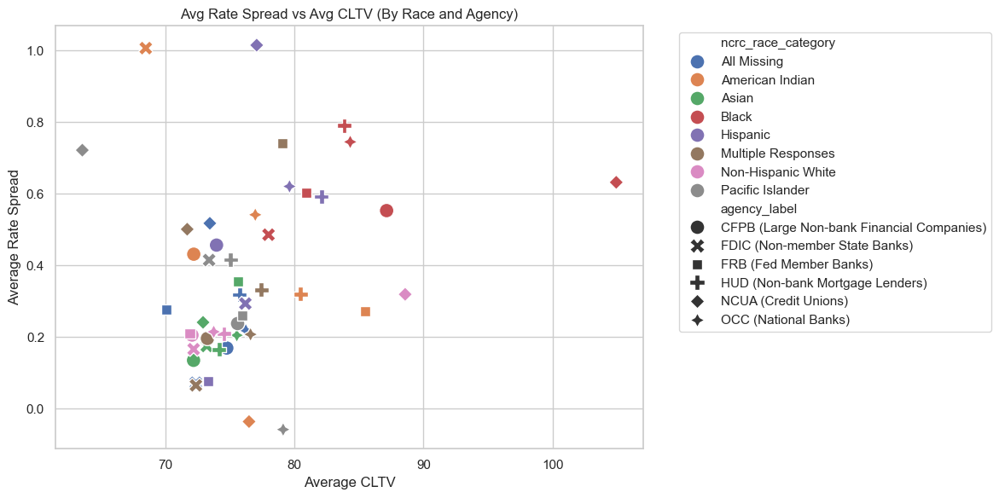

In [369]:
summary = (
    df_cook_named.groupby(['ncrc_race_category', 'agency_label'])
    .agg(avg_cltv=('combined_loan_to_value_ratio', 'mean'),
         avg_spread=('rate_spread', 'mean'))
    .reset_index()
)

# Bubble plot
plt.figure(figsize=(12, 6))
scatter = sns.scatterplot(
    data=summary,
    x='avg_cltv',
    y='avg_spread',
    hue='ncrc_race_category',
    style='agency_label',
    s=150
)

plt.title("Avg Rate Spread vs Avg CLTV (By Race and Agency)")
plt.xlabel("Average CLTV")
plt.ylabel("Average Rate Spread")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


### Explore DTI → CLTV → Rate Spread (Mediation-like)

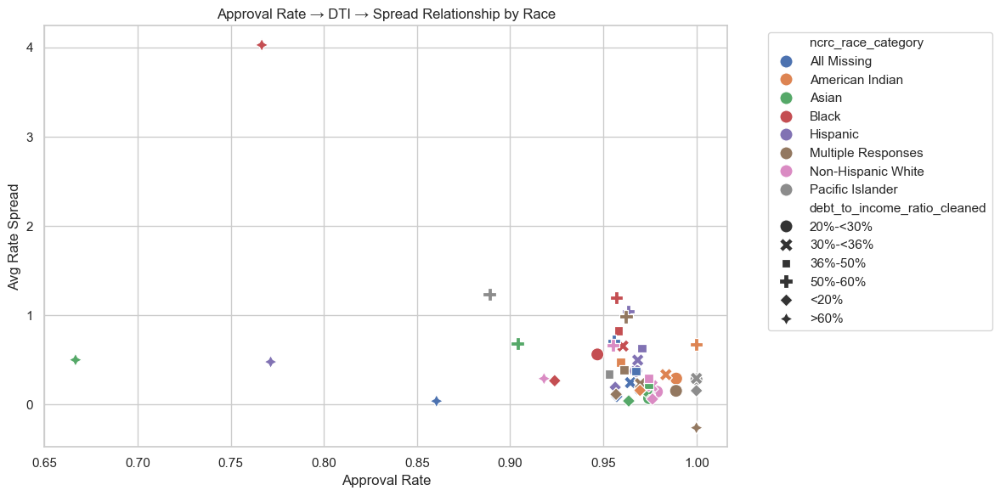

In [394]:
mediation_df2 = (
    df_cook_named.dropna(subset=['debt_to_income_ratio_cleaned', 'rate_spread', 'action_taken'])
    .assign(is_approved=df_cook_named['action_taken'] == 'Loan originated')
    .groupby(['debt_to_income_ratio_cleaned', 'ncrc_race_category'], observed=True)
    .agg(
        approval_rate=('is_approved', 'mean'),
        avg_spread=('rate_spread', 'mean')
    )
    .reset_index()
)

plt.figure(figsize=(12, 6))
sns.scatterplot(
    data=mediation_df2, 
    x='approval_rate', y='avg_spread', 
    hue='ncrc_race_category', 
    style='debt_to_income_ratio_cleaned', 
    s=120
)
plt.title("Approval Rate → DTI → Spread Relationship by Race")
plt.xlabel("Approval Rate")
plt.ylabel("Avg Rate Spread")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### Compare DTI Distribution by Race (Stacked Bar)

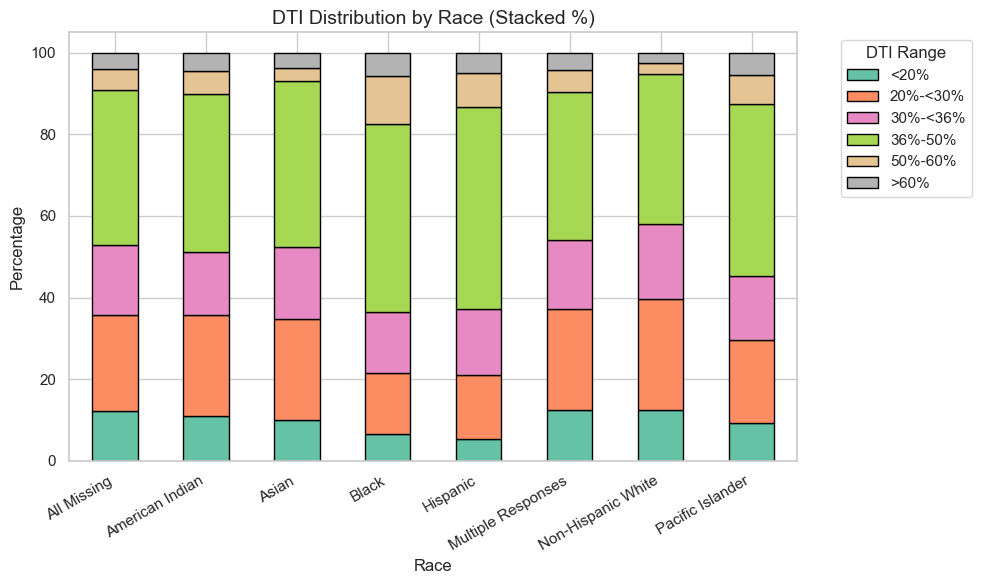

In [430]:
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Count distribution of DTI per race
dti_race_dist = (
    df_cook_named
    .dropna(subset=['debt_to_income_ratio', 'ncrc_race_category'])
    .groupby(['ncrc_race_category', 'debt_to_income_ratio_cleaned'])
    .size()
    .unstack(fill_value=0)
)

# Step 2: Normalize to percentages
dti_race_pct = dti_race_dist.div(dti_race_dist.sum(axis=1), axis=0) * 100

# Optional: Order DTI bands

dti_order = [
    '<20%',
    '20%-<30%',
    '30%-<36%',
    '36%-50%',
    '50%-60%',
    '>60%'
]
dti_race_pct = dti_race_pct[dti_order]

# Step 3: Plot stacked bar chart
ax = dti_race_pct.plot(
    kind='bar',
    stacked=True,
    figsize=(10, 6),
    colormap='Set2',
    edgecolor='black'
)

# Step 4: Style
plt.title("DTI Distribution by Race (Stacked %)", fontsize=14)
plt.xlabel("Race", fontsize=12)
plt.ylabel("Percentage", fontsize=12)
plt.xticks(rotation=30, ha='right')
plt.legend(title="DTI Range", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Multivariable Grouped Analysis (with Control Variables)

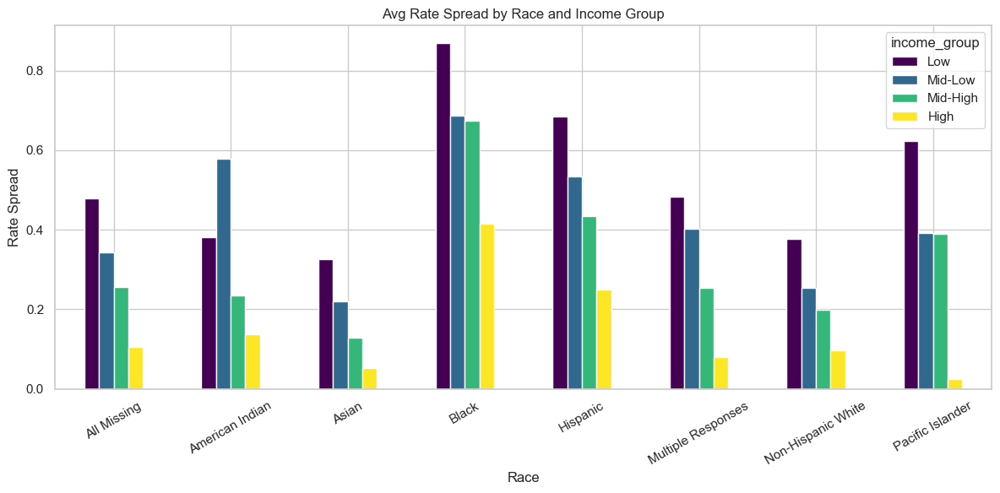

In [432]:
df_cook_named['income_group'] = pd.qcut(df_cook_named['income'], q=4, labels=["Low", "Mid-Low", "Mid-High", "High"])

grouped = (
    df_cook_named
    .groupby(['ncrc_race_category', 'income_group'], observed=False)['rate_spread']
    .mean()
    .unstack()
)

grouped.plot(kind='bar', figsize=(12,6), colormap='viridis')
plt.title("Avg Rate Spread by Race and Income Group")
plt.ylabel("Rate Spread")
plt.xlabel("Race")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

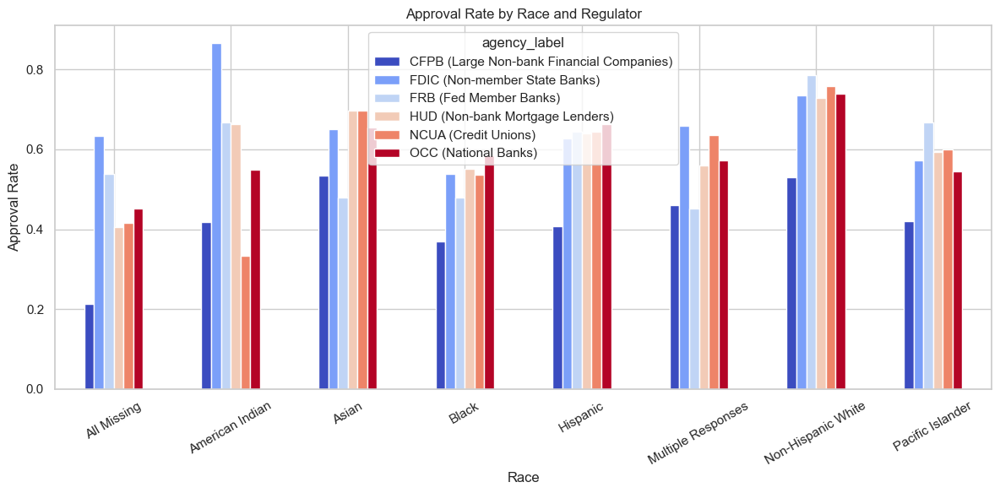

In [434]:
grouped = (
    df_cook_named
    .groupby(['ncrc_race_category', 'agency_label'])['is_approved']
    .mean()
    .unstack()
)

grouped.plot(kind='bar', figsize=(12,6), colormap='coolwarm')
plt.title("Approval Rate by Race and Regulator")
plt.ylabel("Approval Rate")
plt.xlabel("Race")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

## Denial reason

In [436]:
# only keep denial case
df_denied = df_cook_named[df_cook_named['action_taken'] == 'Application denied'].copy()

# Exclude invalid denial reasons
df_denied = df_denied[df_denied['denial_reason_1'].notna()]

In [437]:
# Step 1: Count each group
counts = df_denied.groupby(['ncrc_race_category', 'denial_reason_1'], observed=True).size().reset_index(name='count')

# Step 2: Normalize within each race
counts['percentage'] = (
    counts['count'] / counts.groupby('ncrc_race_category')['count'].transform('sum') * 100
)

# Step 3: Filter by percentage > 5%
top_race_reasons = counts[counts['percentage'] > 5]


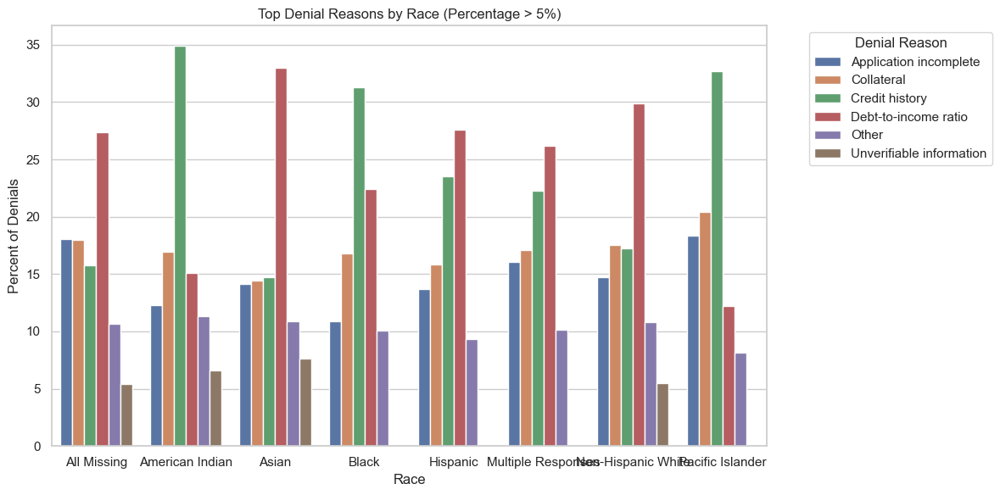

In [438]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.barplot(data=top_race_reasons, x='ncrc_race_category', y='percentage', hue='denial_reason_1')
plt.title("Top Denial Reasons by Race (Percentage > 5%)")
plt.ylabel("Percent of Denials")
plt.xlabel("Race")
plt.legend(title="Denial Reason", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


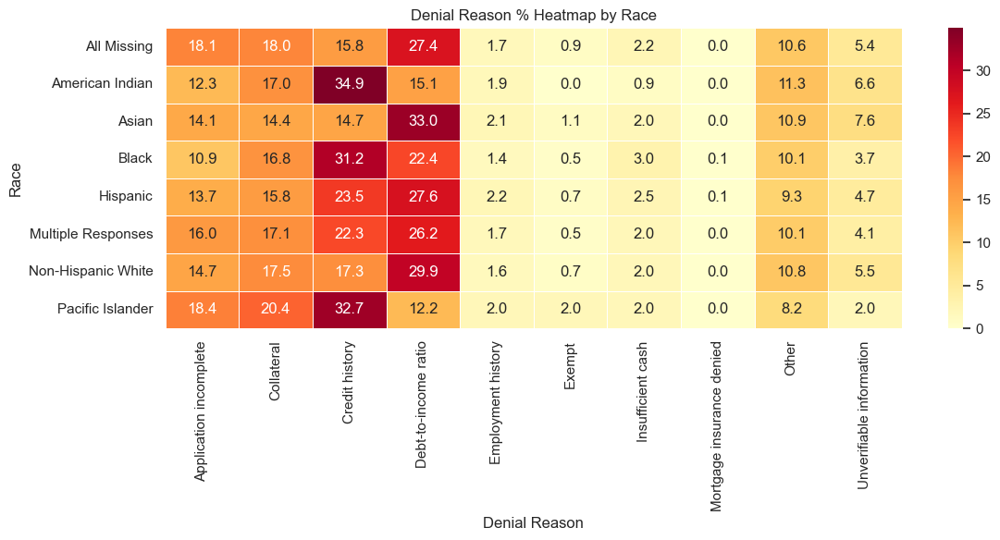

In [439]:
heatmap_df = (
    counts.pivot(index='ncrc_race_category', columns='denial_reason_1', values='percentage')
    .fillna(0)
)

plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_df, annot=True, fmt=".1f", cmap="YlOrRd", linewidths=0.5)
plt.title("Denial Reason % Heatmap by Race")
plt.xlabel("Denial Reason")
plt.ylabel("Race")
plt.tight_layout()
plt.show()



# Regression Model

In [441]:
import statsmodels.formula.api as smf

# Ensure is_approved is numeric
df_reg = df_cook_named.copy()
df_reg['is_approved'] = (df_reg['action_taken'] == 'Loan originated').astype(int)

# Drop missing values on relevant columns
df_reg = df_reg.dropna(subset=['is_approved', 'income', 'loan_amount', 'combined_loan_to_value_ratio', 'agency_label', 'ncrc_race_category'])

# Logistic regression
model = smf.logit(
    formula="is_approved ~ C(ncrc_race_category) + income + loan_amount + combined_loan_to_value_ratio + debt_to_income_ratio_missing + C(agency_label)",
    data=df_reg
).fit()

print(model.summary())

Optimization terminated successfully.
         Current function value: 0.634771
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:               approved   No. Observations:               338083
Model:                          Logit   Df Residuals:                   338066
Method:                           MLE   Df Model:                           16
Date:                Wed, 07 May 2025   Pseudo R-squ.:                 0.07682
Time:                        14:46:24   Log-Likelihood:            -2.1461e+05
converged:                       True   LL-Null:                   -2.3246e+05
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                                         coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------
Intercept                   

In [442]:
mfx = model.get_margeff(at='overall')
print(mfx.summary())

C:\Users\admin\anaconda3\Lib\site-packages\statsmodels\discrete\discrete_model.py:2409: RuntimeWarning:

overflow encountered in square

C:\Users\admin\anaconda3\Lib\site-packages\statsmodels\discrete\discrete_model.py:2409: RuntimeWarning:

invalid value encountered in divide



        Logit Marginal Effects       
Dep. Variable:               approved
Method:                          dydx
At:                           overall
                                                        dy/dx    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------
C(ncrc_race_category)[T.American Indian]               0.2134        nan        nan        nan         nan         nan
C(ncrc_race_category)[T.Asian]                         0.2673        nan        nan        nan         nan         nan
C(ncrc_race_category)[T.Black]                         0.1479        nan        nan        nan         nan         nan
C(ncrc_race_category)[T.Hispanic]                      0.2144        nan        nan        nan         nan         nan
C(ncrc_race_category)[T.Multiple Responses]            0.1694        nan        nan        nan         nan         nan
C(ncrc_race_cat

In [468]:
model_interact = smf.logit(
    formula="is_approved ~ C(ncrc_race_category) * C(agency_label) + income + loan_amount + combined_loan_to_value_ratio",
    data=df_reg
).fit()

Optimization terminated successfully.
         Current function value: 0.634311
         Iterations 9


In [470]:
model_spread = smf.ols(
    formula="rate_spread ~ C(ncrc_race_category) + income + loan_amount + combined_loan_to_value_ratio + C(agency_label)",
    data=df_cook_named.dropna(subset=['rate_spread', 'income', 'loan_amount'])
).fit()
print(model_spread.summary())

                            OLS Regression Results                            
Dep. Variable:            rate_spread   R-squared:                       0.134
Model:                            OLS   Adj. R-squared:                  0.134
Method:                 Least Squares   F-statistic:                     1845.
Date:                Wed, 07 May 2025   Prob (F-statistic):               0.00
Time:                        14:48:31   Log-Likelihood:            -1.8720e+05
No. Observations:              178686   AIC:                         3.744e+05
Df Residuals:                  178670   BIC:                         3.746e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                                         coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------

In [494]:
!pip install pingouin


   ---------------------------------------- 0.0/204.4 kB ? eta -:--:--
   -------------------------------------- - 194.6/204.4 kB 3.9 MB/s eta 0:00:01
   ---------------------------------------- 204.4/204.4 kB 4.1 MB/s eta 0:00:00


In [513]:
import pingouin as pg
import pandas as pd

# Prepare the data: only necessary columns and drop missing
df_med = df_cook_named[['ncrc_race_category', 'combined_loan_to_value_ratio', 'is_approved']].dropna()

# Ensure is_approved is boolean type (or 0/1)
df_med['is_approved'] = df_med['is_approved'].astype(int)

# Get unique races
unique_races = df_med['ncrc_race_category'].dropna().unique()

# Loop through each race and run mediation analysis
for race in unique_races:
    df_med['race_binary'] = (df_med['ncrc_race_category'] == race).astype(int)

    try:
        result = pg.mediation_analysis(
            data=df_med,
            x='race_binary',
            m='combined_loan_to_value_ratio',
            y='is_approved',
            alpha=0.05
        )
        print(f"\n--- Mediation Analysis: {race} vs Others ---")
        print(result)
    except Exception as e:
        print(f"\n[Error for race: {race}] → {str(e)}")


--- Mediation Analysis: All Missing vs Others ---
                               path      coef        se      pval  CI[2.5%]  \
0  combined_loan_to_value_ratio ~ X -0.901452  0.834451  0.280012 -2.536952   
1  Y ~ combined_loan_to_value_ratio -0.000019  0.000004  0.000019 -0.000028   
2                             Total -0.282180  0.002128  0.000000 -0.286351   
3                            Direct -0.282198  0.002128  0.000000 -0.286369   
4                          Indirect  0.000018  0.000031  0.000000  0.000012   

   CI[97.5%]  sig  
0   0.734048   No  
1  -0.000010  Yes  
2  -0.278009  Yes  
3  -0.278027  Yes  
4   0.000025  Yes  

--- Mediation Analysis: Hispanic vs Others ---
                               path      coef        se      pval  CI[2.5%]  \
0  combined_loan_to_value_ratio ~ X  3.782818  0.960728  0.000082  1.899818   
1  Y ~ combined_loan_to_value_ratio -0.000019  0.000004  0.000019 -0.000028   
2                             Total -0.000160  0.002513  0.949342 -0.

In [497]:
from statsmodels.stats.oaxaca import OaxacaBlinder

# Step 1: Prepare Data
df_blinder = df_cook_named[
    df_cook_named['ncrc_race_category'].isin(['Non-Hispanic White', 'Black'])
].dropna(subset=['income', 'loan_amount', 'is_approved']).copy()

df_blinder['is_white'] = (df_blinder['ncrc_race_category'] == 'Non-Hispanic White').astype(int)

# Step 2: Define Exog and Oaxaca model
exog_data = df_blinder[['income', 'loan_amount', 'is_white']]  # Note: 'is_white' included here too
oaxaca = OaxacaBlinder(
    endog=df_blinder['is_approved'],
    exog=exog_data,
    bifurcate='is_white'  # ✅ Pass column name as string
)

# Fit the model first
results = oaxaca.fit()

# Step 3: Access results
print("\nExplained (Endowments):", results.explained)
print("Unexplained (Coefficients):", results.unexplained)
print("\nGroup Means (Xbar):\n", results.groupstats['xbar'])
print("\nGroup Coefficients (Beta):\n", results.groupstats['beta'])

AttributeError: 'OaxacaBlinder' object has no attribute 'fit'

In [519]:
import statsmodels.api as sm

# Split data into two groups
white = df_blinder[df_blinder['is_white'] == 1]
black = df_blinder[df_blinder['is_white'] == 0]

# Fit separate models
model_white = sm.OLS(white['is_approved'], sm.add_constant(white[['income', 'loan_amount']])).fit()
model_black = sm.OLS(black['is_approved'], sm.add_constant(black[['income', 'loan_amount']])).fit()

# Manually compute Oaxaca-Blinder decomposition
mean_white = white[['income', 'loan_amount']].mean()
mean_black = black[['income', 'loan_amount']].mean()

explained = (mean_white - mean_black) @ model_black.params[1:]  # Endowment effect
unexplained = mean_black @ (model_white.params[1:] - model_black.params[1:])  # Coefficient effect

print("Explained (Endowments):", explained)
print("Unexplained (Coefficients):", unexplained)

Explained (Endowments): 0.05351424138565146
Unexplained (Coefficients): -0.08106785073659976


Text(0.5, 1.0, 'CLTV by Race')

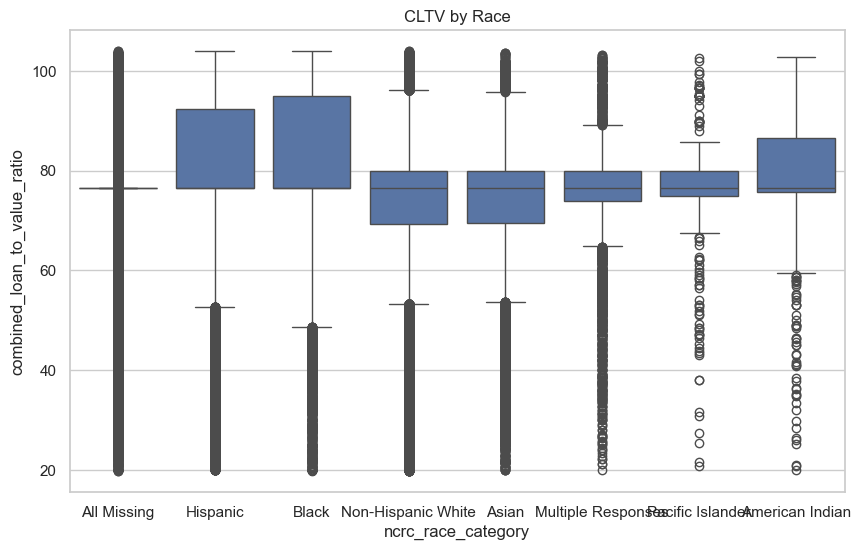

In [520]:
import pandas as pd

# Drop nulls first
df_clean = df_cook_named.dropna(subset=['combined_loan_to_value_ratio'])

# Calculate the 1st and 99th percentiles
lower_bound = df_clean['combined_loan_to_value_ratio'].quantile(0.005)
upper_bound = df_clean['combined_loan_to_value_ratio'].quantile(0.995)

# Filter the DataFrame to keep only the middle 98%
df_plot3 = df_clean[
    (df_clean['combined_loan_to_value_ratio'] >= lower_bound) & 
    (df_clean['combined_loan_to_value_ratio'] <= upper_bound)
]

sns.boxplot(data=df_plot3, x='ncrc_race_category', y='combined_loan_to_value_ratio')
plt.title("CLTV by Race")


# Logistic Regression for Approval Prediction

In [522]:
import pandas as pd
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Prepare DataFrame — binary approval + drop NA
df_logit = df_cook_named.copy()

# Ensure binary approval variable
df_logit['is_approved'] = (df_logit['action_taken'] == 'Loan originated').astype(int)

# Drop rows with missing values in predictors
df_logit_clean = df_logit.dropna(subset=[
    'is_approved', 'income', 'loan_amount',
    'combined_loan_to_value_ratio', 'agency_label', 'ncrc_race_category'
])
# Optional: check sample size
print("Sample size:", len(df_logit_clean))

# Step 2: Logistic regression model
logit_model = smf.logit(
    formula="""
    is_approved ~ C(ncrc_race_category) + income + loan_amount + 
    combined_loan_to_value_ratio + C(agency_label)
    """,
    data=df_logit_clean
).fit()

# Step 3: View results
print(logit_model.summary())

Sample size: 338083
Optimization terminated successfully.
         Current function value: 0.635390
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:            is_approved   No. Observations:               338083
Model:                          Logit   Df Residuals:                   338067
Method:                           MLE   Df Model:                           15
Date:                Wed, 07 May 2025   Pseudo R-squ.:                 0.07592
Time:                        15:25:59   Log-Likelihood:            -2.1481e+05
converged:                       True   LL-Null:                   -2.3246e+05
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                                         coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------
Intercep

In [523]:
# Step 4: Interpret odds ratios
odds_ratios = pd.DataFrame({
    "coef": logit_model.params,
    "odds_ratio": logit_model.params.apply(lambda x: round(np.exp(x), 3)),
    "p_value": logit_model.pvalues
})
print("\nOdds Ratios:\n", odds_ratios)


Odds Ratios:
                                                             coef  odds_ratio  \
Intercept                                          -8.391184e-01       0.432   
C(ncrc_race_category)[T.American Indian]            9.516660e-01       2.590   
C(ncrc_race_category)[T.Asian]                      1.194845e+00       3.303   
C(ncrc_race_category)[T.Black]                      6.566344e-01       1.928   
C(ncrc_race_category)[T.Hispanic]                   9.573449e-01       2.605   
C(ncrc_race_category)[T.Multiple Responses]         7.516457e-01       2.120   
C(ncrc_race_category)[T.Non-Hispanic White]         1.330614e+00       3.783   
C(ncrc_race_category)[T.Pacific Islander]           8.141583e-01       2.257   
C(agency_label)[T.FDIC (Non-member State Banks)]    1.005558e+00       2.733   
C(agency_label)[T.FRB (Fed Member Banks)]           9.585192e-01       2.608   
C(agency_label)[T.HUD (Non-bank Mortgage Lenders)]  8.696053e-01       2.386   
C(agency_label)[T.NCUA (C

C:\Users\admin\AppData\Local\Temp\ipykernel_10344\2999305191.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




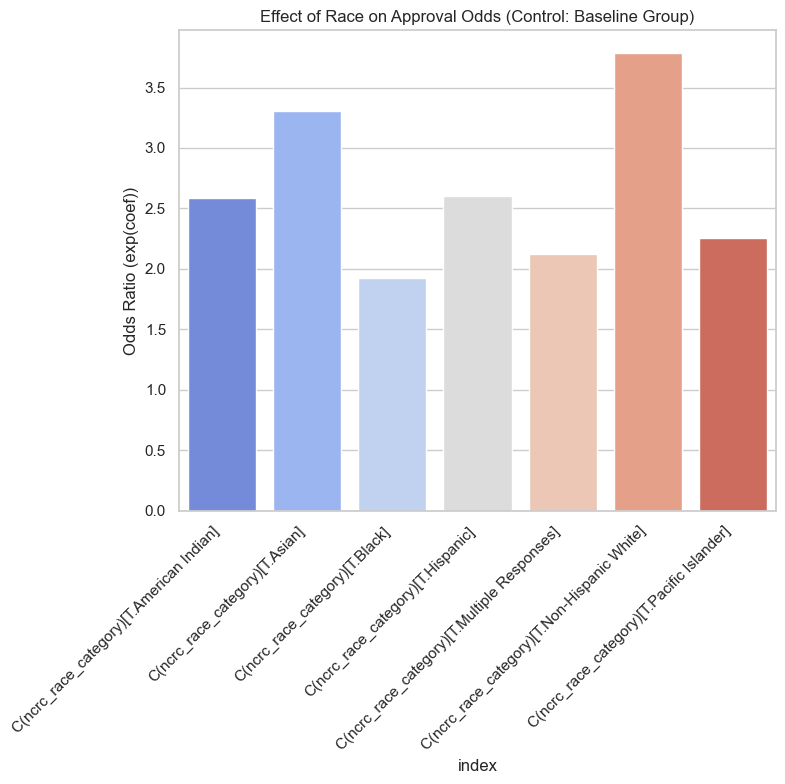

In [524]:
# Step 5: Visualize Race Effect Coefficients
race_effects = odds_ratios[odds_ratios.index.str.startswith("C(ncrc_race_category)")]

plt.figure(figsize=(8, 8))
sns.barplot(
    data=race_effects.reset_index(),
    x='index', y='odds_ratio', palette="coolwarm"
)
plt.xticks(rotation=45, ha='right')
plt.ylabel("Odds Ratio (exp(coef))")
plt.title("Effect of Race on Approval Odds (Control: Baseline Group)")
plt.tight_layout()
plt.show()


In [525]:
# Logistic regression with race-income interaction
logit_interact = smf.logit(
    formula="""
    is_approved ~ C(ncrc_race_category) * income + loan_amount +
    combined_loan_to_value_ratio + C(agency_label)
    """,
    data=df_logit_clean
).fit()

# View summary
print(logit_interact.summary())


Optimization terminated successfully.
         Current function value: 0.635329
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:            is_approved   No. Observations:               338083
Model:                          Logit   Df Residuals:                   338060
Method:                           MLE   Df Model:                           22
Date:                Wed, 07 May 2025   Pseudo R-squ.:                 0.07601
Time:                        15:26:11   Log-Likelihood:            -2.1479e+05
converged:                       True   LL-Null:                   -2.3246e+05
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                                         coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------
Intercept                   

In [526]:
model_no_race = smf.logit(
    formula="""
    is_approved ~ income + loan_amount + 
    combined_loan_to_value_ratio + C(agency_label)
    """,
    data=df_logit_clean
).fit()

C:\Users\admin\anaconda3\Lib\site-packages\statsmodels\discrete\discrete_model.py:2385: RuntimeWarning:

overflow encountered in exp



Optimization terminated successfully.
         Current function value: 0.663870
         Iterations 8


In [527]:
model_with_race = smf.logit(
    formula="""
    is_approved ~ C(ncrc_race_category) + income + loan_amount + 
    combined_loan_to_value_ratio + C(agency_label)
    """,
    data=df_logit_clean
).fit()

Optimization terminated successfully.
         Current function value: 0.635390
         Iterations 9


In [528]:
print("\nModel without race:")
print("Pseudo R²:", round(model_no_race.prsquared, 4))
print("Log-Likelihood:", round(model_no_race.llf, 2))

print("\nModel with race:")
print("Pseudo R²:", round(model_with_race.prsquared, 4))
print("Log-Likelihood:", round(model_with_race.llf, 2))

pseudo_r2_diff = model_with_race.prsquared - model_no_race.prsquared
print(f"\nΔPseudo R² from adding race: {pseudo_r2_diff:.4f}")


Model without race:
Pseudo R²: 0.0345
Log-Likelihood: -224443.28

Model with race:
Pseudo R²: 0.0759
Log-Likelihood: -214814.6

ΔPseudo R² from adding race: 0.0414


In [529]:
from sklearn.metrics import roc_auc_score

# Predict probabilities
y_true = df_logit_clean['is_approved']
pred_no_race = model_no_race.predict(df_logit_clean)
pred_with_race = model_with_race.predict(df_logit_clean)

auc_no_race = roc_auc_score(y_true, pred_no_race)
auc_with_race = roc_auc_score(y_true, pred_with_race)

print(f"AUC without race: {auc_no_race:.3f}")
print(f"AUC with race: {auc_with_race:.3f}")
print(f"ΔAUC: {auc_with_race - auc_no_race:.3f}")

C:\Users\admin\anaconda3\Lib\site-packages\statsmodels\discrete\discrete_model.py:2385: RuntimeWarning:

overflow encountered in exp



AUC without race: 0.619
AUC with race: 0.680
ΔAUC: 0.062


C:\Users\admin\anaconda3\Lib\site-packages\statsmodels\discrete\discrete_model.py:2385: RuntimeWarning:

overflow encountered in exp



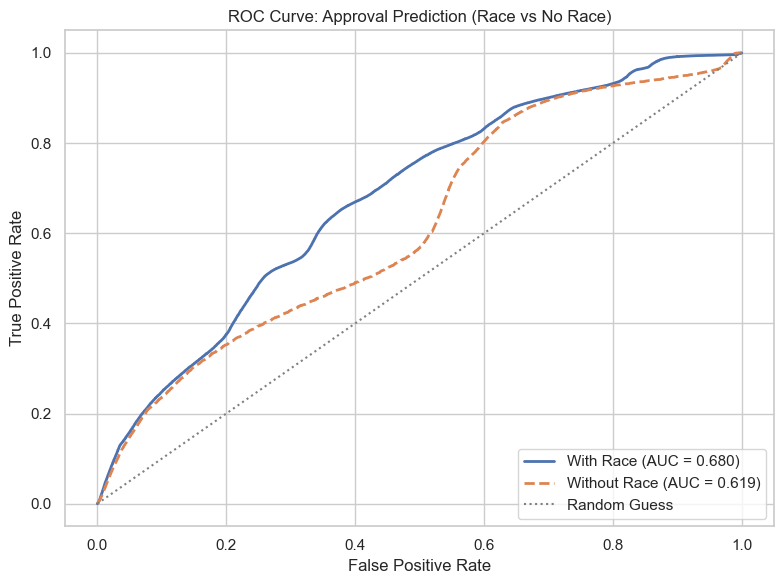

In [530]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Get true labels
y_true = df_logit_clean['is_approved']

# Get predicted probabilities
y_pred_with_race = model_with_race.predict(df_logit_clean)
y_pred_no_race = model_no_race.predict(df_logit_clean)

# Compute ROC curves
fpr_with_race, tpr_with_race, _ = roc_curve(y_true, y_pred_with_race)
fpr_no_race, tpr_no_race, _ = roc_curve(y_true, y_pred_no_race)

# Compute AUC
auc_with_race = roc_auc_score(y_true, y_pred_with_race)
auc_no_race = roc_auc_score(y_true, y_pred_no_race)

# Plot
plt.figure(figsize=(8, 6))
plt.plot(fpr_with_race, tpr_with_race, label=f"With Race (AUC = {auc_with_race:.3f})", linewidth=2)
plt.plot(fpr_no_race, tpr_no_race, label=f"Without Race (AUC = {auc_no_race:.3f})", linestyle='--', linewidth=2)
plt.plot([0, 1], [0, 1], color='gray', linestyle=':', label='Random Guess')

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve: Approval Prediction (Race vs No Race)")
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

C:\Users\admin\AppData\Local\Temp\ipykernel_10344\3396225971.py:23: UserWarning:



The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.




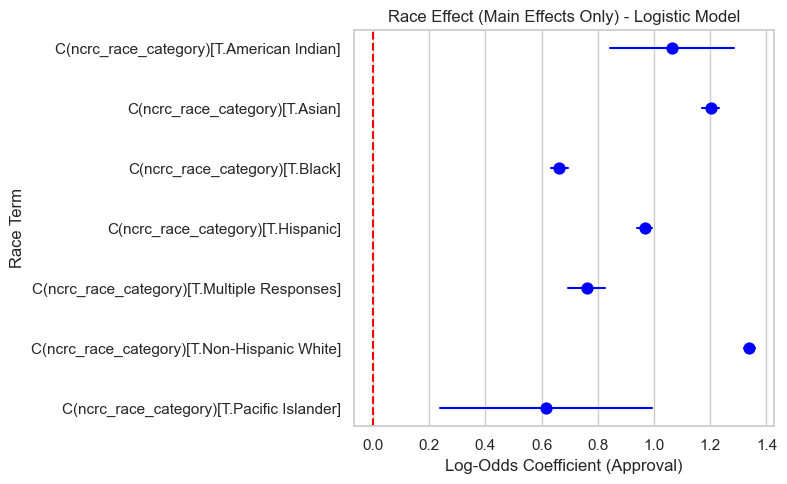

In [551]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# === 1️ Get all coefficients + 95% CIs ===
coef_table_logit = logit_with_interaction.conf_int().reset_index()
coef_table_logit.columns = ['Variable', 'CI_Lower', 'CI_Upper']
coef_table_logit['Coef'] = logit_with_interaction.params.values

# === 2️ MAIN RACE effects ===
race_main_logit = coef_table_logit[
    coef_table_logit['Variable'].str.contains(r'C\(ncrc_race_category\)\[T')
    & ~coef_table_logit['Variable'].str.contains(':')
]

# === 3️ RACE × Income interaction terms ===
race_interaction_logit = coef_table_logit[
    coef_table_logit['Variable'].str.contains(':')
]

# === 4️ Plot MAIN RACE effects ===
plt.figure(figsize=(8, 5))
sns.pointplot(
    y='Variable',
    x='Coef',
    data=race_main_logit,
    join=False,
    color='blue'
)
# Add error bars
for i in range(race_main_logit.shape[0]):
    plt.plot(
        [race_main_logit['CI_Lower'].iloc[i], race_main_logit['CI_Upper'].iloc[i]],
        [i, i], color='blue'
    )
plt.axvline(0, color='red', linestyle='--')
plt.title("Race Effect (Main Effects Only) - Logistic Model")
plt.xlabel("Log-Odds Coefficient (Approval)")
plt.ylabel("Race Term")
plt.tight_layout()
plt.show()

In [545]:
from sklearn.metrics import roc_auc_score

# === 1️ Prepare data ===
df_logit = df_cook_named.dropna(subset=[
    'is_approved', 'income', 'loan_amount', 'combined_loan_to_value_ratio'
]).copy()

# Ensure is_approved is 0/1 numeric
df_logit['is_approved'] = df_logit['is_approved'].astype(int)

# === 2️ WITH Race + Race×Income interaction ===
logit_with_interaction = smf.logit(
    formula="""
        is_approved ~ C(ncrc_race_category) * income
        + loan_amount
        + combined_loan_to_value_ratio
        + C(agency_label)
    """,
    data=df_logit
).fit()

# === 3️ WITH Race (NO interaction) ===
logit_with_race = smf.logit(
    formula="""
        is_approved ~ C(ncrc_race_category)
        + income
        + loan_amount
        + combined_loan_to_value_ratio
        + C(agency_label)
    """,
    data=df_logit
).fit()

# === 4️ WITHOUT Race ===
logit_no_race = smf.logit(
    formula="""
        is_approved ~ income
        + loan_amount
        + combined_loan_to_value_ratio
        + C(agency_label)
    """,
    data=df_logit
).fit()

# === 5️ Compute AUCs ===
y_true = df_logit['is_approved']

auc_with_interaction = roc_auc_score(y_true, logit_with_interaction.predict())
auc_with_race = roc_auc_score(y_true, logit_with_race.predict())
auc_no_race = roc_auc_score(y_true, logit_no_race.predict())

# ===  Print AUC Comparison ===
print("\n=== Logistic AUC Comparison ===")
print("With Race + Interaction: {:.4f}".format(auc_with_interaction))
print("With Race (No Interaction): {:.4f}".format(auc_with_race))
print("Without Race: {:.4f}".format(auc_no_race))

print("\nΔAUC (With Interaction vs No Race): {:.4f}".format(
    auc_with_interaction - auc_no_race))
print("ΔAUC (With Race vs No Race): {:.4f}".format(
    auc_with_race - auc_no_race))
print("ΔAUC (With Interaction vs With Race): {:.4f}".format(
    auc_with_interaction - auc_with_race))
print(auc_with_interaction,
auc_with_race,
auc_no_race)

Optimization terminated successfully.
         Current function value: 0.635329
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.635390
         Iterations 9


C:\Users\admin\anaconda3\Lib\site-packages\statsmodels\discrete\discrete_model.py:2385: RuntimeWarning:

overflow encountered in exp



Optimization terminated successfully.
         Current function value: 0.663870
         Iterations 8


C:\Users\admin\anaconda3\Lib\site-packages\statsmodels\discrete\discrete_model.py:2385: RuntimeWarning:

overflow encountered in exp




=== Logistic AUC Comparison ===
With Race + Interaction: 0.6804
With Race (No Interaction): 0.6804
Without Race: 0.6185

ΔAUC (With Interaction vs No Race): 0.0619
ΔAUC (With Race vs No Race): 0.0619
ΔAUC (With Interaction vs With Race): 0.0000
0.6804317208379059 0.6803943887796041 0.6185360932463948


C:\Users\admin\AppData\Local\Temp\ipykernel_10344\1155220138.py:3: UserWarning:



The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.




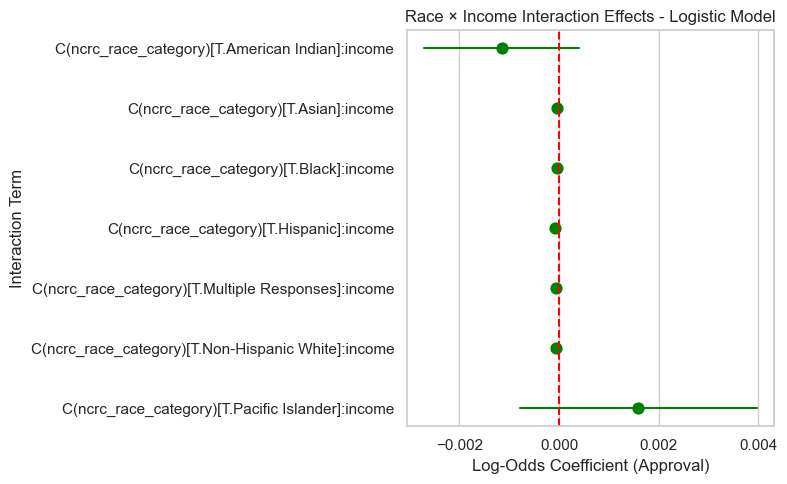

In [553]:
# === 5️ Plot RACE × Income interaction effects ===
plt.figure(figsize=(8, 5))
sns.pointplot(
    y='Variable',
    x='Coef',
    data=race_interaction_logit,
    join=False,
    color='green'
)
for i in range(race_interaction_logit.shape[0]):
    plt.plot(
        [race_interaction_logit['CI_Lower'].iloc[i], race_interaction_logit['CI_Upper'].iloc[i]],
        [i, i], color='green'
    )
plt.axvline(0, color='red', linestyle='--')
plt.title("Race × Income Interaction Effects - Logistic Model")
plt.xlabel("Log-Odds Coefficient (Approval)")
plt.ylabel("Interaction Term")
plt.tight_layout()
plt.show()

# OLS for rate_spread with Race

In [560]:
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data
df_ols = df_cook_named.dropna(subset=[
    'rate_spread', 'income', 'loan_amount',
    'combined_loan_to_value_ratio', 'agency_label', 'ncrc_race_category'
])

# WITH race + race:income interaction
ols_with_race = smf.ols(
    formula="rate_spread ~ C(ncrc_race_category) * income + loan_amount + combined_loan_to_value_ratio + C(agency_label)",
    data=df_ols
).fit()

# WITHOUT race
ols_no_race = smf.ols(
    formula="rate_spread ~ income + loan_amount + combined_loan_to_value_ratio + C(agency_label)",
    data=df_ols
).fit()

In [556]:
# Step 2: Logistic regression model
ols_no_interact_model = smf.ols(
    formula="""
    rate_spread ~ C(ncrc_race_category) + income + loan_amount + 
    combined_loan_to_value_ratio + C(agency_label)
    """,
    data=df_ols
).fit()

# Step 3: View results
print(ols_no_interact_model.summary())

                            OLS Regression Results                            
Dep. Variable:            rate_spread   R-squared:                       0.134
Model:                            OLS   Adj. R-squared:                  0.134
Method:                 Least Squares   F-statistic:                     1845.
Date:                Wed, 07 May 2025   Prob (F-statistic):               0.00
Time:                        15:32:40   Log-Likelihood:            -1.8720e+05
No. Observations:              178686   AIC:                         3.744e+05
Df Residuals:                  178670   BIC:                         3.746e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                                         coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------

<>:7: SyntaxWarning:

invalid escape sequence '\('

<>:7: SyntaxWarning:

invalid escape sequence '\('

C:\Users\admin\AppData\Local\Temp\ipykernel_10344\566970324.py:7: SyntaxWarning:

invalid escape sequence '\('

C:\Users\admin\AppData\Local\Temp\ipykernel_10344\566970324.py:14: UserWarning:



The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.




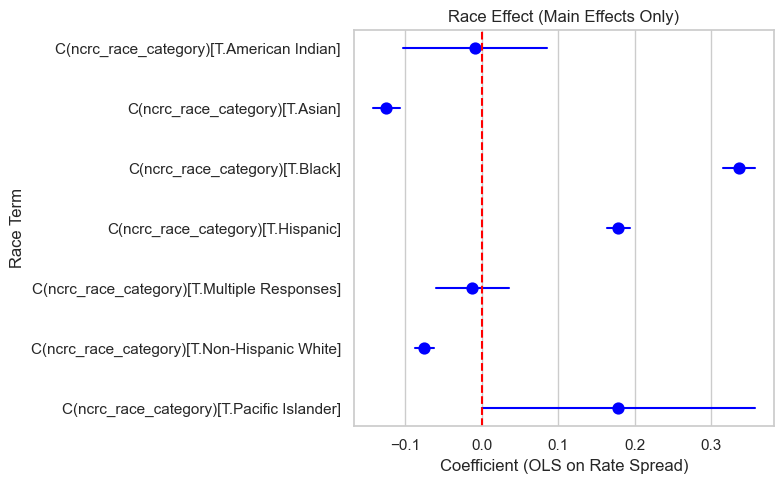

In [562]:
# Get all coefficients + CIs
coef_table = ols_with_race.conf_int().reset_index()
coef_table.columns = ['Variable', 'CI_Lower', 'CI_Upper']
coef_table['Coef'] = ols_with_race.params.values

# Separate: RACE main effects
race_main = coef_table[coef_table['Variable'].str.contains('C\(ncrc_race_category\)\[T') & ~coef_table['Variable'].str.contains(':')]

# Separate: RACE-INCOME interaction terms
race_interaction = coef_table[coef_table['Variable'].str.contains(':')]

# Plot MAIN RACE effects
plt.figure(figsize=(8, 5))
sns.pointplot(
    y='Variable',
    x='Coef',
    data=race_main,
    join=False,
    color='blue'
)
# Add error bars
for i in range(race_main.shape[0]):
    plt.plot(
        [race_main['CI_Lower'].iloc[i], race_main['CI_Upper'].iloc[i]],
        [i, i], color='blue'
    )
plt.axvline(0, color='red', linestyle='--')
plt.title("Race Effect (Main Effects Only)")
plt.xlabel("Coefficient (OLS on Rate Spread)")
plt.ylabel("Race Term")
plt.tight_layout()
plt.show()

C:\Users\admin\AppData\Local\Temp\ipykernel_10344\1628291656.py:3: UserWarning:



The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.




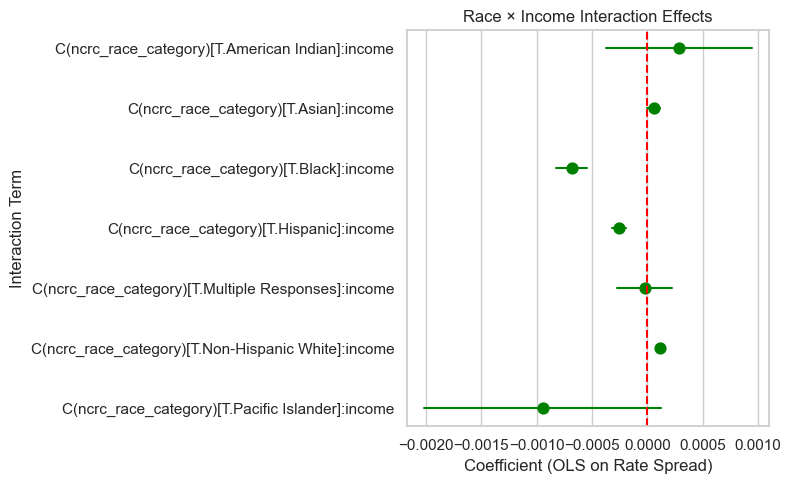

In [563]:
# Plot RACE-INCOME interaction effects
plt.figure(figsize=(8, 5))
sns.pointplot(
    y='Variable',
    x='Coef',
    data=race_interaction,
    join=False,
    color='green'
)
for i in range(race_interaction.shape[0]):
    plt.plot(
        [race_interaction['CI_Lower'].iloc[i], race_interaction['CI_Upper'].iloc[i]],
        [i, i], color='green'
    )
plt.axvline(0, color='red', linestyle='--')
plt.title("Race × Income Interaction Effects")
plt.xlabel("Coefficient (OLS on Rate Spread)")
plt.ylabel("Interaction Term")
plt.tight_layout()
plt.show()

In [564]:
# 1️ WITH Race + Race×Income interaction
ols_with_interaction = smf.ols(
    formula="rate_spread ~ C(ncrc_race_category) * income + loan_amount + combined_loan_to_value_ratio + C(agency_label)",
    data=df_ols
).fit()

# 2️ WITH Race (NO interaction)
ols_with_race = smf.ols(
    formula="rate_spread ~ C(ncrc_race_category) + income + loan_amount + combined_loan_to_value_ratio + C(agency_label)",
    data=df_ols
).fit()

# 3️ WITHOUT Race
ols_no_race = smf.ols(
    formula="rate_spread ~ income + loan_amount + combined_loan_to_value_ratio + C(agency_label)",
    data=df_ols
).fit()

#  Print R² Comparison
print("\n=== OLS R² Comparison ===")
print("With Race + Interaction: {:.4f}".format(ols_with_interaction.rsquared))
print("With Race (No Interaction): {:.4f}".format(ols_with_race.rsquared))
print("Without Race: {:.4f}".format(ols_no_race.rsquared))

print("\nΔR² (With Interaction vs No Race): {:.4f}".format(ols_with_interaction.rsquared - ols_no_race.rsquared))
print("ΔR² (With Race vs No Race): {:.4f}".format(ols_with_race.rsquared - ols_no_race.rsquared))
print("ΔR² (With Interaction vs With Race): {:.4f}".format(ols_with_interaction.rsquared - ols_with_race.rsquared))


=== OLS R² Comparison ===
With Race + Interaction: 0.1353
With Race (No Interaction): 0.1341
Without Race: 0.1129

ΔR² (With Interaction vs No Race): 0.0224
ΔR² (With Race vs No Race): 0.0212
ΔR² (With Interaction vs With Race): 0.0012


In [565]:
# Get ALL coefficients side by side
coef_with = ols_with_race.params.reset_index()
coef_with.columns = ['Variable', 'Coef_With_Race']

coef_no = ols_no_race.params.reset_index()
coef_no.columns = ['Variable', 'Coef_Without_Race']

merged = pd.merge(coef_with, coef_no, on='Variable', how='outer')
print(merged)

                                              Variable  Coef_With_Race  \
0                                            Intercept   -7.262417e-02   
1             C(ncrc_race_category)[T.American Indian]    1.908756e-02   
2                       C(ncrc_race_category)[T.Asian]   -1.154528e-01   
3                       C(ncrc_race_category)[T.Black]    2.741802e-01   
4                    C(ncrc_race_category)[T.Hispanic]    1.582529e-01   
5          C(ncrc_race_category)[T.Multiple Responses]   -1.542749e-02   
6          C(ncrc_race_category)[T.Non-Hispanic White]   -5.721813e-02   
7            C(ncrc_race_category)[T.Pacific Islander]    5.608562e-02   
8     C(agency_label)[T.FDIC (Non-member State Banks)]   -1.228312e-01   
9            C(agency_label)[T.FRB (Fed Member Banks)]   -7.958407e-02   
10  C(agency_label)[T.HUD (Non-bank Mortgage Lenders)]   -3.225259e-02   
11             C(agency_label)[T.NCUA (Credit Unions)]    1.158164e-01   
12             C(agency_label)[T.OCC (

C:\Users\admin\AppData\Local\Temp\ipykernel_10344\819955691.py:13: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




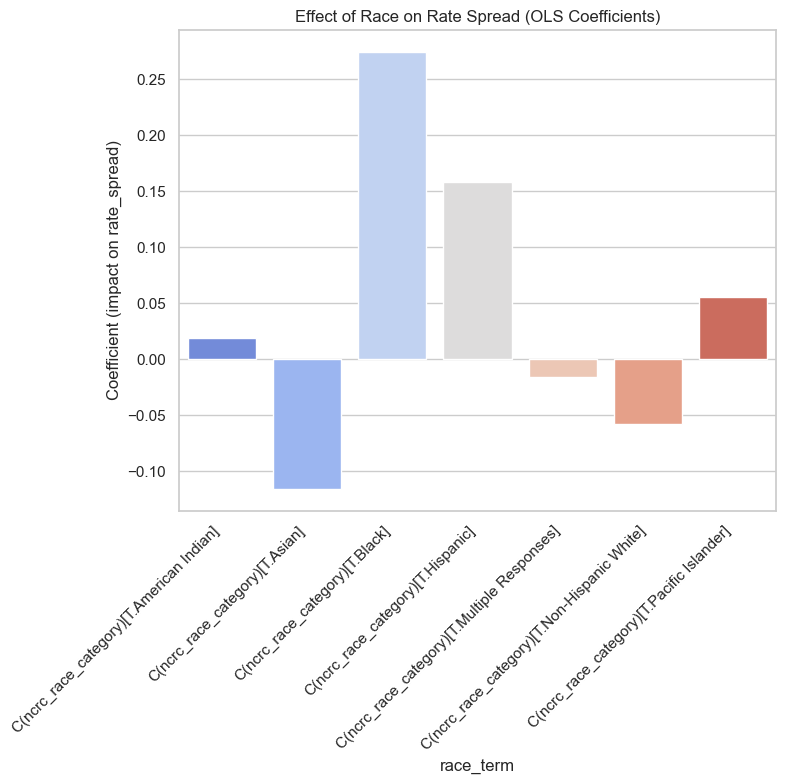

In [566]:
import seaborn as sns
import matplotlib.pyplot as plt

#  Extract race coefficients from the OLS model with interaction
race_effects_ols = ols_with_race.params.filter(like="C(ncrc_race_category)")

# Convert to DataFrame for seaborn
race_effects_df = race_effects_ols.reset_index()
race_effects_df.columns = ['race_term', 'coef']

# Plot bar chart
plt.figure(figsize=(8, 8))
sns.barplot(
    data=race_effects_df,
    x='race_term',
    y='coef',
    palette="coolwarm"
)
plt.xticks(rotation=45, ha='right')
plt.ylabel("Coefficient (impact on rate_spread)")
plt.title("Effect of Race on Rate Spread (OLS Coefficients)")
plt.tight_layout()
plt.show()

# SHAP

In [571]:
!pip install shap


   ---------------------------------------- 0.0/545.2 kB ? eta -:--:--
   ------ --------------------------------- 92.2/545.2 kB 2.6 MB/s eta 0:00:01
   ---------------------------- ----------- 389.1/545.2 kB 4.0 MB/s eta 0:00:01
   ---------------------------------------- 545.2/545.2 kB 4.9 MB/s eta 0:00:00


## For Logistic Regression (Approval Rate)

C:\Users\admin\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

LinearExplainer explainer: 338084it [00:14, 6238.38it/s] 


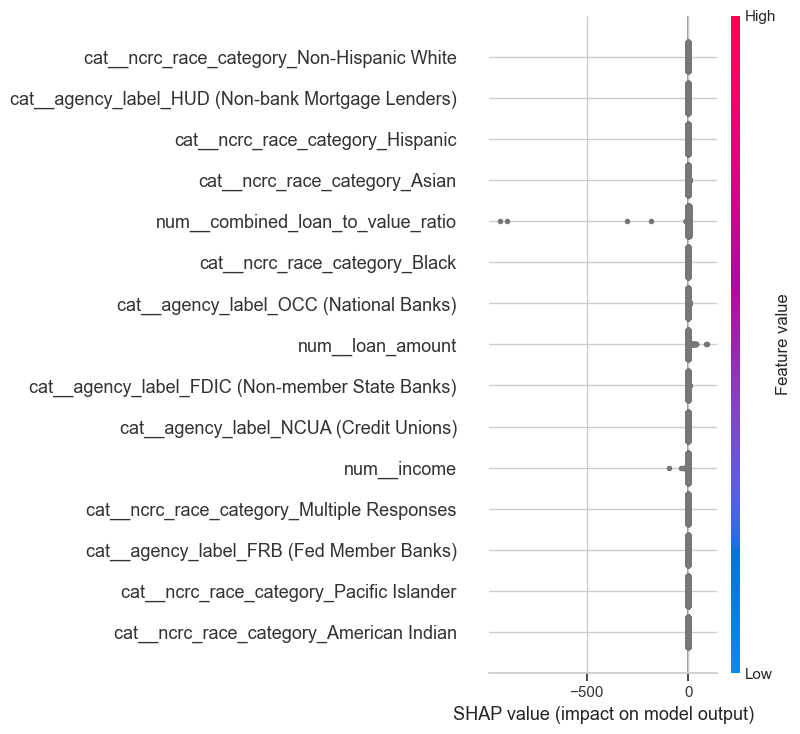

In [577]:
import shap
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# Prepare data
df_logit = df_cook_named.dropna(subset=[
    'is_approved', 'income', 'loan_amount', 'combined_loan_to_value_ratio'
])
X = df_logit[['ncrc_race_category', 'income', 'loan_amount', 'combined_loan_to_value_ratio', 'agency_label']]
y = df_logit['is_approved'].astype(int)

# Define features
categorical_features = ['ncrc_race_category', 'agency_label']
numeric_features = ['income', 'loan_amount', 'combined_loan_to_value_ratio']

# Column transformer for preprocessing
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(drop='first'), categorical_features),
        ('num', 'passthrough', numeric_features)
    ]
)

# Pipeline: preprocessing + logistic regression
model_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(max_iter=500))
])

# Fit model
model_pipeline.fit(X, y)

# === SHAP Explanation ===

# Step 1: Transform X using only the preprocessor
X_transformed = model_pipeline.named_steps['preprocessor'].transform(X)

# Step 2: Create explainer using the trained classifier
explainer = shap.Explainer(model_pipeline.named_steps['classifier'], X_transformed)

# Step 3: Compute SHAP values
shap_values = explainer(X_transformed)

# Step 4: Plot summary with proper feature names
feature_names = model_pipeline.named_steps['preprocessor'].get_feature_names_out()
shap.summary_plot(shap_values, features=X_transformed, feature_names=feature_names)


## For OLS Regression (Rate Spread)

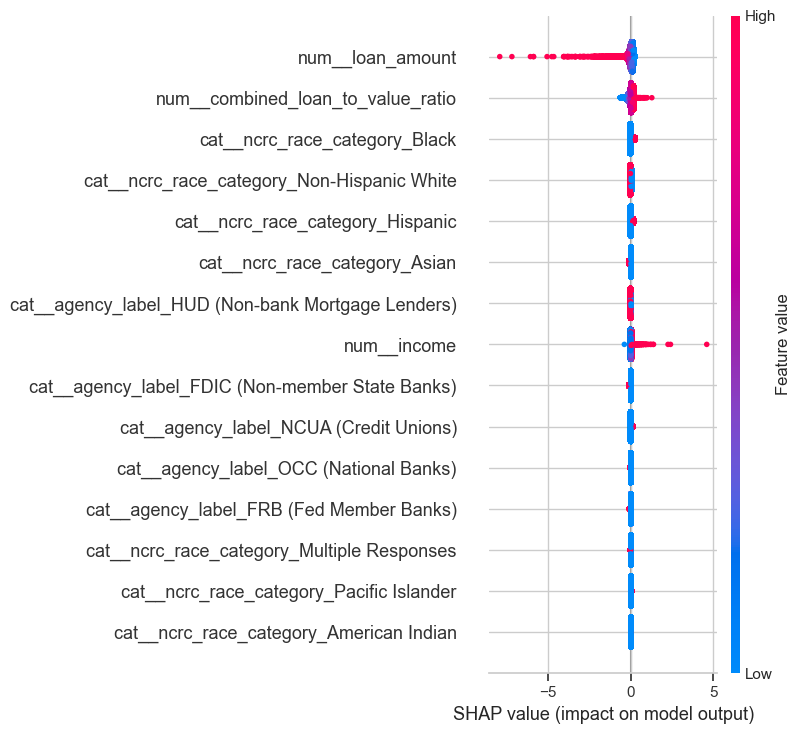

In [579]:
from sklearn.linear_model import LinearRegression
import shap

# Prepare data
df_ols = df_cook_named.dropna(subset=[
    'rate_spread', 'income', 'loan_amount', 'combined_loan_to_value_ratio'
])
X = df_ols[['ncrc_race_category', 'income', 'loan_amount', 'combined_loan_to_value_ratio', 'agency_label']]
y = df_ols['rate_spread']

# Reuse or redefine preprocessor if not already defined
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

categorical_features = ['ncrc_race_category', 'agency_label']
numeric_features = ['income', 'loan_amount', 'combined_loan_to_value_ratio']

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(drop='first'), categorical_features),
        ('num', 'passthrough', numeric_features)
    ]
)

# Pipeline for linear regression
from sklearn.pipeline import Pipeline

model_pipeline_ols = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

# Fit the pipeline
model_pipeline_ols.fit(X, y)

# === SHAP Explanation ===

# Step 1: Transform features using preprocessor only
X_transformed = model_pipeline_ols.named_steps['preprocessor'].transform(X)

# Step 2: Create SHAP explainer with transformed features
explainer_ols = shap.Explainer(model_pipeline_ols.named_steps['regressor'], X_transformed)

# Step 3: Compute SHAP values
shap_values_ols = explainer_ols(X_transformed)

# Step 4: Get feature names after preprocessing
feature_names = model_pipeline_ols.named_steps['preprocessor'].get_feature_names_out()

# Step 5: SHAP summary plot
shap.summary_plot(shap_values_ols, features=X_transformed, feature_names=feature_names)
